In [1]:
import torch
import torch.nn as nn
import time
import argparse

import os
import datetime

from torch.distributions.categorical import Categorical

# visualization 
%matplotlib inline
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import warnings
warnings.filterwarnings("ignore", category=UserWarning)

device = torch.device("cpu"); gpu_id = -1 # select CPU

gpu_id = '0' # select a single GPU  
#gpu_id = '2,3' # select multiple GPUs  
os.environ["CUDA_VISIBLE_DEVICES"] = str(gpu_id)  
if torch.cuda.is_available():
    device = torch.device("cuda")
    print('GPU name: {:s}, gpu_id: {:s}'.format(torch.cuda.get_device_name(0),gpu_id))   
    
print(device)
print('pytorch version = ',torch.__version__)

GPU name: NVIDIA GeForce RTX 2080 Ti, gpu_id: 0
cuda
pytorch version =  1.10.0


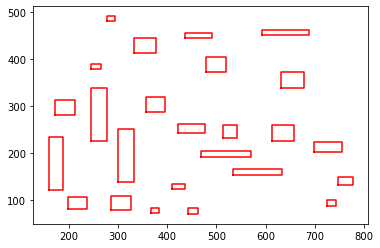

In [2]:
from listofpathpoint import input_handler
import cnc_input
import copy
temp = input_handler('10&15data/25_chips/25_1.json')
temp.original_map_present()

In [3]:
import math
import numpy as np
import torch.nn.functional as F
import random
import torch.optim as optim
from torch.autograd import Variable
from torch.optim import lr_scheduler
import matplotlib.pyplot as plt
from tqdm import tqdm_notebook
class TransEncoderNet(nn.Module):
    """
    Encoder network based on self-attention transformer
    Inputs :  
      h of size      (bsz, nb_nodes, dim_emb)    batch of input cities
    Outputs :  
      h of size      (bsz, nb_nodes, dim_emb)    batch of encoded cities
      score of size  (bsz, nb_nodes, nb_nodes+1) batch of attention scores
    """
    
    def __init__(self, nb_layers, dim_emb, nb_heads, dim_ff, batchnorm):
        super(TransEncoderNet, self).__init__()
        assert dim_emb == nb_heads* (dim_emb//nb_heads) # check if dim_emb is divisible by nb_heads
        self.MHA_layers = nn.ModuleList( [nn.MultiheadAttention(dim_emb, nb_heads) for _ in range(nb_layers)] )
        self.linear1_layers = nn.ModuleList( [nn.Linear(dim_emb, dim_ff) for _ in range(nb_layers)] )
        self.linear2_layers = nn.ModuleList( [nn.Linear(dim_ff, dim_emb) for _ in range(nb_layers)] )   
        if batchnorm:
            self.norm1_layers = nn.ModuleList( [nn.BatchNorm1d(dim_emb) for _ in range(nb_layers)] )
            self.norm2_layers = nn.ModuleList( [nn.BatchNorm1d(dim_emb) for _ in range(nb_layers)] )
        else:
            self.norm1_layers = nn.ModuleList( [nn.LayerNorm(dim_emb) for _ in range(nb_layers)] )
            self.norm2_layers = nn.ModuleList( [nn.LayerNorm(dim_emb) for _ in range(nb_layers)] )
        self.nb_layers = nb_layers
        self.nb_heads = nb_heads
        self.batchnorm = batchnorm
        
    def forward(self, h):      
        # PyTorch nn.MultiheadAttention requires input size (seq_len, bsz, dim_emb) 
        h = h.transpose(0,1) # size(h)=(nb_nodes, bsz, dim_emb)  
        # L layers
        for i in range(self.nb_layers):
            h_rc = h # residual connection, size(h_rc)=(nb_nodes, bsz, dim_emb)
            h, score = self.MHA_layers[i](h, h, h) # size(h)=(nb_nodes, bsz, dim_emb), size(score)=(bsz, nb_nodes, nb_nodes)
            # add residual connection
            
            h = h_rc + h # size(h)=(nb_nodes, bsz, dim_emb)
            if self.batchnorm:
                # Pytorch nn.BatchNorm1d requires input size (bsz, dim, seq_len)
                h = h.permute(1,2,0).contiguous() # size(h)=(bsz, dim_emb, nb_nodes)
                h = self.norm1_layers[i](h)       # size(h)=(bsz, dim_emb, nb_nodes)
                h = h.permute(2,0,1).contiguous() # size(h)=(nb_nodes, bsz, dim_emb)
            else:
                h = self.norm1_layers[i](h)       # size(h)=(nb_nodes, bsz, dim_emb) 
            # feedforward
            h_rc = h # residual connection
            h = self.linear2_layers[i](torch.relu(self.linear1_layers[i](h)))
            h = h_rc + h # size(h)=(nb_nodes, bsz, dim_emb)
            if self.batchnorm:
                h = h.permute(1,2,0).contiguous() # size(h)=(bsz, dim_emb, nb_nodes)
                h = self.norm2_layers[i](h)       # size(h)=(bsz, dim_emb, nb_nodes)
                h = h.permute(2,0,1).contiguous() # size(h)=(nb_nodes, bsz, dim_emb)
            else:
                h = self.norm2_layers[i](h) # size(h)=(nb_nodes, bsz, dim_emb)
        # Transpose h
        h = h.transpose(0,1) # size(h)=(bsz, nb_nodes, dim_emb)
        return h, score
    

class Attention(nn.Module):
    def __init__(self, n_hidden):
        super(Attention, self).__init__()
        self.size = 0
        self.batch_size = 0
        self.dim = n_hidden
        
        v  = torch.FloatTensor(n_hidden)
        self.v  = nn.Parameter(v)
        self.v.data.uniform_(-1/math.sqrt(n_hidden), 1/math.sqrt(n_hidden))
        
        # parameters for pointer attention
        self.Wref = nn.Linear(n_hidden, n_hidden)
        self.Wq = nn.Linear(n_hidden, n_hidden)
    
    
    def forward(self, q, ref):       # query and reference
        self.batch_size = q.size(0)
        self.size = int(ref.size(0) / self.batch_size)
        q = self.Wq(q)     # (B, dim)
        ref = self.Wref(ref)
        ref = ref.view(self.batch_size, self.size, self.dim)  # (B, size, dim)
        
        q_ex = q.unsqueeze(1).repeat(1, self.size, 1) # (B, size, dim)
        # v_view: (B, dim, 1)
        v_view = self.v.unsqueeze(0).expand(self.batch_size, self.dim).unsqueeze(2)
        
        # (B, size, dim) * (B, dim, 1)
        u = torch.bmm(torch.tanh(q_ex + ref), v_view).squeeze(2)
        
        return u, ref
    
class LSTM(nn.Module):
    def __init__(self, n_hidden):
        super(LSTM, self).__init__()
        
        # parameters for input gate
        self.Wxi = nn.Linear(n_hidden, n_hidden)    # W(xt)
        self.Whi = nn.Linear(n_hidden, n_hidden)    # W(ht)
        self.wci = nn.Linear(n_hidden, n_hidden)    # w(ct)
        
        # parameters for forget gate
        self.Wxf = nn.Linear(n_hidden, n_hidden)    # W(xt)
        self.Whf = nn.Linear(n_hidden, n_hidden)    # W(ht)
        self.wcf = nn.Linear(n_hidden, n_hidden)    # w(ct)
        
        # parameters for cell gate
        self.Wxc = nn.Linear(n_hidden, n_hidden)    # W(xt)
        self.Whc = nn.Linear(n_hidden, n_hidden)    # W(ht)
        
        # parameters for forget gate
        self.Wxo = nn.Linear(n_hidden, n_hidden)    # W(xt)
        self.Who = nn.Linear(n_hidden, n_hidden)    # W(ht)
        self.wco = nn.Linear(n_hidden, n_hidden)    # w(ct)
    
    
    def forward(self, x, h, c):       # query and reference
        
        # input gate
        i = torch.sigmoid(self.Wxi(x) + self.Whi(h) + self.wci(c))
        # forget gate
        f = torch.sigmoid(self.Wxf(x) + self.Whf(h) + self.wcf(c))
        # cell gate
        c = f * c + i * torch.tanh(self.Wxc(x) + self.Whc(h))
        # output gate
        o = torch.sigmoid(self.Wxo(x) + self.Who(h) + self.wco(c))
        
        h = o * torch.tanh(c)
        
        return h, c

class HPN(nn.Module):
    def __init__(self, n_feature, n_hidden):

        super(HPN, self).__init__()
        self.city_size = 0
        self.batch_size = 0
        self.dim = n_hidden
        
        # lstm for first turn
        #self.lstm0 = nn.LSTM(n_hidden, n_hidden)main_training - Jupyter Notebook
        
        # pointer layer
        #self.pointer = Attention(n_hidden)
        self.TransPointer = Attention(n_hidden)
        
        # lstm encoder
        self.encoder = LSTM(n_hidden)
        
        # trainable first hidden input
        h0 = torch.FloatTensor(n_hidden)
        c0 = torch.FloatTensor(n_hidden)
        # trainable latent variable coefficient
        print('here') 
        alpha = torch.ones(1)
        self.h0 = nn.Parameter(h0)
        self.c0 = nn.Parameter(c0)
        
        self.alpha = nn.Parameter(alpha)
        self.h0.data.uniform_(-1/math.sqrt(n_hidden), 1/math.sqrt(n_hidden))
        self.c0.data.uniform_(-1/math.sqrt(n_hidden), 1/math.sqrt(n_hidden))
        
        r1 = torch.ones(1)
        r2 = torch.ones(1)
        r3 = torch.ones(1)
        self.r1 = nn.Parameter(r1)
        self.r2 = nn.Parameter(r2)
        self.r3 = nn.Parameter(r3)
        
        # embedding
        self.embedding_x = nn.Linear(n_feature, n_hidden)
        self.embedding_all = nn.Linear(n_feature, n_hidden)
        self.Transembedding_all = TransEncoderNet(6, 128, 8, 512, batchnorm=True)#6,128,8,512
        
        # vector to start decoding 
        self.start_placeholder = nn.Parameter(torch.randn(n_hidden))
        
        # weights for GNN
#         self.W1 = nn.Linear(n_hidden, n_hidden)
#         self.W2 = nn.Linear(n_hidden, n_hidden)
#         self.W3 = nn.Linear(n_hidden, n_hidden)
        
        # aggregation function for GNN
#         self.agg_1 = nn.Linear(n_hidden, n_hidden)
#         self.agg_2 = nn.Linear(n_hidden, n_hidden)
#         self.agg_3 = nn.Linear(n_hidden, n_hidden)
    
    
    def forward(self,context,Transcontext, x, X_all, mask_final, h=None, c=None, latent=None):
        '''
        Inputs (B: batch size, size: city size, dim: hidden dimension)
        
        x: current city coordinate (B, 2)
        X_all: all cities' cooridnates (B, size, 2)
        mask: mask visited cities
        h: hidden variable (B, dim)
        c: cell gate (B, dim)
        latent: latent pointer vector from previous layer (B, size, dim)
        
        Outputs
        
        softmax: probability distribution of next city (B, size)
        h: hidden variable (B, dim)
        c: cell gate (B, dim)
        latent_u: latent pointer vector for next layer
        '''
        
        self.batch_size = X_all.size(0)
        self.city_size = X_all.size(1)
        # Check if this the first iteration loop
        if h is None or c is None:
            x          = self.start_placeholder  
            context = self.embedding_all(X_all)
            Transcontext,_ = self.Transembedding_all(context)
            
            # =============================
            # graph neural network encoder
            # =============================

            # (B, size, dim)
            #context = context.reshape(-1, self.dim)
            Transcontext = Transcontext.reshape(-1, self.dim)

#             context = self.r1 * self.W1(context)\
#                 + (1-self.r1) * F.relu(self.agg_1(context/(self.city_size-1)))

#             context = self.r2 * self.W2(context)\
#                 + (1-self.r2) * F.relu(self.agg_2(context/(self.city_size-1)))

#             context = self.r3 * self.W3(context)\
#                 + (1-self.r3) * F.relu(self.agg_3(context/(self.city_size-1)))
            h0 = self.h0.unsqueeze(0).expand(self.batch_size, self.dim)
            c0 = self.c0.unsqueeze(0).expand(self.batch_size, self.dim)

            h0 = h0.unsqueeze(0).contiguous()
            c0 = c0.unsqueeze(0).contiguous()
            
            # let h0, c0 be the hidden variable of first turn
            h = h0.squeeze(0)
            c = c0.squeeze(0)
        else:
            x          = self.embedding_x(x)
        # LSTM encoder1900/2500
        h, c = self.encoder(x, h, c)
        # query vector
        q = h
        # pointer
        #u1, _ = self.pointer(q, context)
        u2 ,_ = self.TransPointer(q, Transcontext)
        # Avg Agg between the two attention vector
        u = u2
        latent_u = u.clone()
                
        u = 10 * torch.tanh(u)
        u = u + mask_final
        return context, Transcontext,F.softmax(u, dim=1), h, c, latent_u
params= list(HPN(n_feature = 2, n_hidden = 128).parameters())
print(len(params))
for name,parameters in HPN(n_feature = 2, n_hidden = 128).named_parameters():
    print(name,':',parameters.size())

here
110
here
h0 : torch.Size([128])
c0 : torch.Size([128])
alpha : torch.Size([1])
r1 : torch.Size([1])
r2 : torch.Size([1])
r3 : torch.Size([1])
start_placeholder : torch.Size([128])
TransPointer.v : torch.Size([128])
TransPointer.Wref.weight : torch.Size([128, 128])
TransPointer.Wref.bias : torch.Size([128])
TransPointer.Wq.weight : torch.Size([128, 128])
TransPointer.Wq.bias : torch.Size([128])
encoder.Wxi.weight : torch.Size([128, 128])
encoder.Wxi.bias : torch.Size([128])
encoder.Whi.weight : torch.Size([128, 128])
encoder.Whi.bias : torch.Size([128])
encoder.wci.weight : torch.Size([128, 128])
encoder.wci.bias : torch.Size([128])
encoder.Wxf.weight : torch.Size([128, 128])
encoder.Wxf.bias : torch.Size([128])
encoder.Whf.weight : torch.Size([128, 128])
encoder.Whf.bias : torch.Size([128])
encoder.wcf.weight : torch.Size([128, 128])
encoder.wcf.bias : torch.Size([128])
encoder.Wxc.weight : torch.Size([128, 128])
encoder.Wxc.bias : torch.Size([128])
encoder.Whc.weight : torch.Size

In [4]:
#test network 
Actor = HPN(n_feature = 2, n_hidden = 128)
print(Actor)
nb_param = 0
for param in Actor.parameters():
    nb_param += np.prod(list(param.data.size()))
print('Number of parameters:', nb_param)

here
HPN(
  (TransPointer): Attention(
    (Wref): Linear(in_features=128, out_features=128, bias=True)
    (Wq): Linear(in_features=128, out_features=128, bias=True)
  )
  (encoder): LSTM(
    (Wxi): Linear(in_features=128, out_features=128, bias=True)
    (Whi): Linear(in_features=128, out_features=128, bias=True)
    (wci): Linear(in_features=128, out_features=128, bias=True)
    (Wxf): Linear(in_features=128, out_features=128, bias=True)
    (Whf): Linear(in_features=128, out_features=128, bias=True)
    (wcf): Linear(in_features=128, out_features=128, bias=True)
    (Wxc): Linear(in_features=128, out_features=128, bias=True)
    (Whc): Linear(in_features=128, out_features=128, bias=True)
    (Wxo): Linear(in_features=128, out_features=128, bias=True)
    (Who): Linear(in_features=128, out_features=128, bias=True)
    (wco): Linear(in_features=128, out_features=128, bias=True)
  )
  (embedding_x): Linear(in_features=2, out_features=128, bias=True)
  (embedding_all): Linear(in_featu

# daniel rectangle feature handle

In [5]:
'''
This part I designed the rectangle-characterized TSP, that means for every step the agent walk through a corner,
then he travel through the whole rectangle using zig-zag, finally he ends up at one of the rest corners of 
the rextangle, so, it equals the agent walk through three points at one step, in practice, I add three points into 
mask to make them unselectable.
'''
def rectangle_process(temp,idx,idx_final,Y,Y_final,Y0,mask,k,B,Not_choosen_ones,Not_last_time,mask_list_num):
    Y1 = Y[zero_to_bsz, idx.data].clone()
    rectangle_inf = idx/4
    feature_table,mapping_tool = temp.outcorner_getout(rectangle_inf,B,mask_list_num)
    if torch.cuda.is_available():
        mapping_tool_matrix = torch.tensor(mapping_tool).cuda()
    else:
        mapping_tool_matrix = torch.tensor(mapping_tool)
    mapping_tool_matrix = mapping_tool_matrix.repeat(B,1)
    feature_table = torch.Tensor(feature_table).type(torch.long)
    if torch.cuda.is_available():
        feature_table = feature_table.cuda()
    Y_corner = Y[zero_to_bsz, feature_table[:,0].data].clone()
    Y_Yfinal = feature_table[:,0].data/4
    Y_Yfinal_int = Y_Yfinal.type(torch.int)
    Y_Yfinal_int = Y_Yfinal_int.type(torch.long)
    Y_Yfinal_ROI = mapping_tool_matrix[zero_to_bsz,Y_Yfinal_int]
    Y_Yfinal_corner = feature_table[:,0].data - Y_Yfinal_int*4
    Y_corner_final = Y_Yfinal_ROI*4 + Y_Yfinal_corner
    x = Y_final[zero_to_bsz, Y_corner_final].clone()
    if k ==0:
        if torch.cuda.is_available():
            reward = torch.zeros(B).cuda()
        else:
            reward = torch.zeros(B)
    if k > 0:
        reward = torch.sum((Y1[:,(0,1)] - Y0[:,(0,1)])**2 , dim=1 )**0.5
        reward += torch.sum((Y_corner[:,(0,1)] - Y1[:,(0,1)])**2 , dim=1 )**0.5
        #dis = (Y1 - Y0)**2
        #dis_1 = (Y_corner - Y1)**2
        #reward = torch.maximum(dis[:,0],dis[:,1])**0.5
        #reward += torch.maximum(dis_1[:,0],dis_1[:,1])**0.5 
    if torch.cuda.is_available():
        reward = reward.cuda()
    mask[zero_to_bsz, idx.data] += -np.inf
    #這邊是全都是四邊形時的配置
    mask[zero_to_bsz, feature_table[:,0].data] += -np.inf
    mask[zero_to_bsz, feature_table[:,1].data] += -np.inf    
    mask[zero_to_bsz, feature_table[:,2].data] += -np.inf 
    if_frozen = Not_last_time[zero_to_bsz, idx.data]
    Not_choosen_ones[zero_to_bsz,if_frozen * (idx.data +4)] = 0
    if_frozen = Not_last_time[zero_to_bsz, feature_table[:,0].data]
    Not_choosen_ones[zero_to_bsz,if_frozen * (feature_table[:,0] +4)] = 0
    if_frozen = Not_last_time[zero_to_bsz, feature_table[:,1].data]
    Not_choosen_ones[zero_to_bsz,if_frozen * (feature_table[:,1] +4)] = 0  
    if_frozen = Not_last_time[zero_to_bsz, feature_table[:,2].data]
    Not_choosen_ones[zero_to_bsz,if_frozen * (feature_table[:,2] +4)] = 0
    Not_choosen_ones[zero_to_bsz,0] = 1
    return reward, Y_corner, x
def rectangle_process_actor(temp,idx,idx_final,Y,Y_final,Y0,mask,k,B,i,path_gazebo,Not_choosen_ones,Not_last_time,mask_list_num):
    Y1 = Y[zero_to_bsz, idx.data].clone()
    rectangle_inf = idx/4
    feature_table,mapping_tool = temp.outcorner_getout(rectangle_inf,B,mask_list_num)
    if torch.cuda.is_available():
        mapping_tool_matrix = torch.tensor(mapping_tool).cuda()
    else:
        mapping_tool_matrix = torch.tensor(mapping_tool)
    mapping_tool_matrix = mapping_tool_matrix.repeat(B,1)
    feature_table = torch.Tensor(feature_table).type(torch.long)
    if torch.cuda.is_available():
        feature_table = feature_table.cuda()
    Y_corner = Y[zero_to_bsz, feature_table[:,0].data].clone()
    Y_Yfinal = feature_table[:,0].data/4
    Y_Yfinal_int = Y_Yfinal.type(torch.int)
    Y_Yfinal_int = Y_Yfinal_int.type(torch.long)
    Y_Yfinal_ROI = mapping_tool_matrix[zero_to_bsz,Y_Yfinal_int]
    Y_Yfinal_corner = feature_table[:,0].data - Y_Yfinal_int*4
    Y_corner_final = Y_Yfinal_ROI*4 + Y_Yfinal_corner
    x = Y_final[zero_to_bsz, Y_corner_final].clone()
    if i % 100 == 0:
        path_gazebo.append([idx.data[0].tolist(),feature_table[:,0].data[0].tolist()])
    if k ==0:
        if torch.cuda.is_available():
            reward = torch.zeros(B).cuda()
        else:
            reward = torch.zeros(B)
    if k > 0:
        reward = torch.sum((Y1[:,(0,1)] - Y0[:,(0,1)])**2 , dim=1 )**0.5
        reward += torch.sum((Y_corner[:,(0,1)] - Y1[:,(0,1)])**2 , dim=1 )**0.5
        #dis = (Y1 - Y0)**2
        #dis_1 = (Y_corner - Y1)**2
        #reward = torch.maximum(dis[:,0],dis[:,1])**0.5
        #reward += torch.maximum(dis_1[:,0],dis_1[:,1])**0.5 
    if torch.cuda.is_available():
        reward = reward.cuda()
    mask[zero_to_bsz, idx.data] += -np.inf
    mask[zero_to_bsz, feature_table[:,0].data] += -np.inf
    mask[zero_to_bsz, feature_table[:,1].data ] += -np.inf    
    mask[zero_to_bsz, feature_table[:,2].data ] += -np.inf
    if_frozen = Not_last_time[zero_to_bsz, idx.data]
    next_time_visited = if_frozen * (idx.data +4)
    Not_choosen_ones[zero_to_bsz,next_time_visited] = 0
    if_frozen = Not_last_time[zero_to_bsz, feature_table[:,0].data]
    next_time_visited = if_frozen * (feature_table[:,0].data+4)
    Not_choosen_ones[zero_to_bsz,next_time_visited] = 0
    if_frozen = Not_last_time[zero_to_bsz, feature_table[:,1].data]
    next_time_visited = if_frozen * (feature_table[:,1].data+4)
    Not_choosen_ones[zero_to_bsz,next_time_visited] = 0  
    if_frozen = Not_last_time[zero_to_bsz, feature_table[:,2].data]
    next_time_visited = if_frozen * (feature_table[:,2].data+4)
    Not_choosen_ones[zero_to_bsz,next_time_visited] = 0
    Not_choosen_ones[zero_to_bsz,0] = 1
    return reward, Y_corner, x

In [6]:
def make_map_matrix(size, size_final, mask_list_num):
    if torch.cuda.is_available():
        map_matrix = torch.zeros(size, size_final).cuda()
    else:
        map_matrix = torch.zeros(size, size_final)
    for i in range(len(mask_list_num)):
        if i !=0 :
            for j in range(mask_list_num[i-1],mask_list_num[i]):
                #complete a ROI for once visit time
                map_matrix[4*j][4*(i-1)]=1
                map_matrix[4*j+1][4*(i-1)+1]=1
                map_matrix[4*j+2][4*(i-1)+2]=1
                map_matrix[4*j+3][4*(i-1)+3]=1
                
    return map_matrix
def unmask_checker(R,B, waiting_time_list, mask_temp):
    R_reshape = R.view(B,1)
    if_dried = waiting_time_list - R_reshape
    if_dried = if_dried<0
    # if a ROI is ready for re-opened, it would be True in if_dried matrix
    mask_temp[if_dried] = 0
    return mask_temp
def logical_mask_filter(mask_final_temp, mask_final, map_matrix):
    if_open = mask_final_temp==0
    if_open = if_open.type(torch.LongTensor)
    map_matrix = map_matrix.type(torch.LongTensor)
    mask_final = torch.mm(if_open,map_matrix)
    mask_final = mask_final==0
    # true = masked, false = unmasked
    mask_final = mask_final.type(torch.float)
    mask_final *= -np.inf
    mask_final[mask_final != mask_final] = 0 
    return mask_final
def idx_transfer(counter_visit, mask_list_num, idx,B):
    idx_float = idx.data/4
    idx_int = idx_float.type(torch.int)
    idx_int = idx_int.type(torch.LongTensor)
    if torch.cuda.is_available():
        idx_int = idx_int.cuda()
    idx_temp = idx_int*4
    idx_corner = idx.data - idx_temp
    if torch.cuda.is_available():
        mask_list_matrix = torch.tensor(mask_list_num[:-1]).cuda()
    else:
        mask_list_matrix = torch.tensor(mask_list_num[:-1])
    mask_list_matrix = mask_list_matrix.repeat(B,1)
    which_ROI_baseline = mask_list_matrix[zero_to_bsz,idx_int]+counter_visit[zero_to_bsz,idx_int]
    if torch.cuda.is_available():
        which_ROI_baseline = which_ROI_baseline.cuda()
    idx_baseline = which_ROI_baseline*4 + idx_corner
    idx_baseline = idx_baseline.type(torch.int)
    idx_baseline = idx_baseline.type(torch.LongTensor)
    if torch.cuda.is_available():
        idx_baseline = idx_baseline.cuda()
    counter_visit[zero_to_bsz, idx_int] += 1
    return idx_baseline

prepare to train
Hyper parameters:
learning rate 0.0001
batch size 128
steps 2500
epoch 100
here
here
55
initial_all tensor([  0.,   0.,   0.,   0.,   0.,   0.,   0.,   0., 150., 150., 150., 150.,
          0.,   0.,   0.,   0.,   0.,   0.,   0.,   0., 150., 150., 150., 150.,
        150., 150., 150., 150.,   0.,   0.,   0.,   0., 150., 150., 150., 150.,
        150., 150., 150., 150.,   0.,   0.,   0.,   0., 150., 150., 150., 150.,
        150., 150., 150., 150.,   0.,   0.,   0.,   0., 150., 150., 150., 150.,
        150., 150., 150., 150.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,
          0.,   0.,   0.,   0., 150., 150., 150., 150., 150., 150., 150., 150.,
          0.,   0.,   0.,   0., 150., 150., 150., 150.,   0.,   0.,   0.,   0.,
        150., 150., 150., 150.,   0.,   0.,   0.,   0., 150., 150., 150., 150.,
        150., 150., 150., 150.,   0.,   0.,   0.,   0., 150., 150., 150., 150.,
        150., 150., 150., 150.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,
   

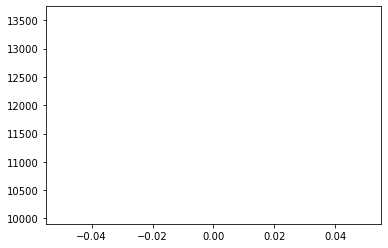

record the last path to gazebo for showing up


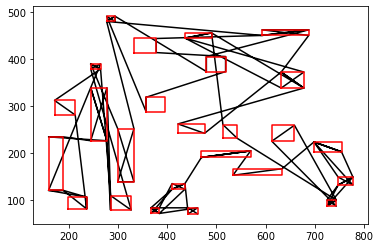

epoch:0, batch:200/2500, reward:9678.052734375


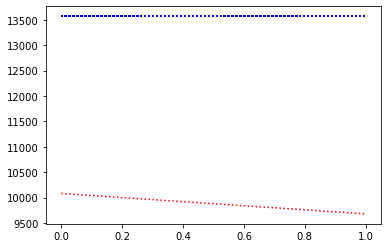

record the last path to gazebo for showing up


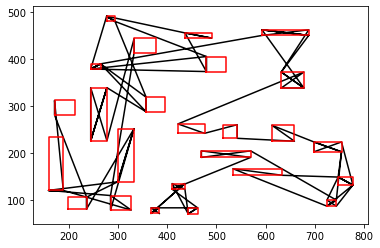

epoch:0, batch:300/2500, reward:9752.56640625


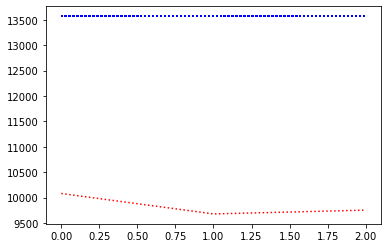

record the last path to gazebo for showing up


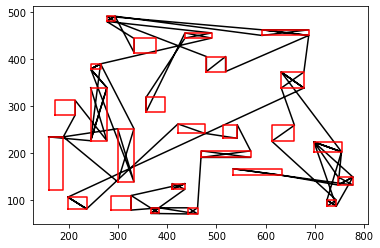

epoch:0, batch:400/2500, reward:9123.5791015625


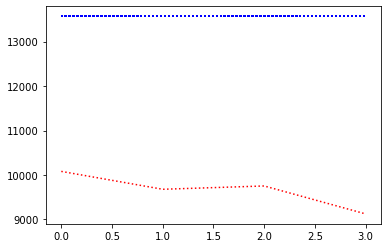

record the last path to gazebo for showing up


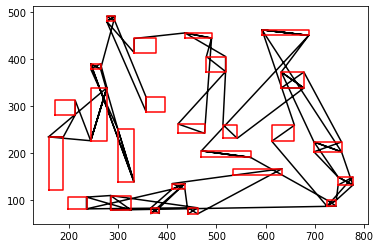

epoch:0, batch:500/2500, reward:9515.7900390625


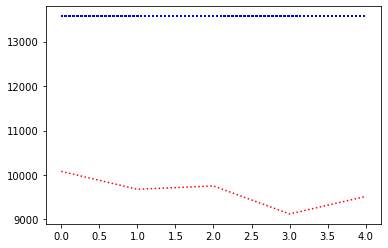

record the last path to gazebo for showing up


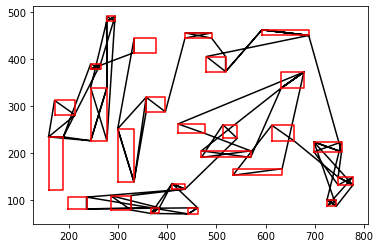

epoch:0, batch:600/2500, reward:9236.08984375


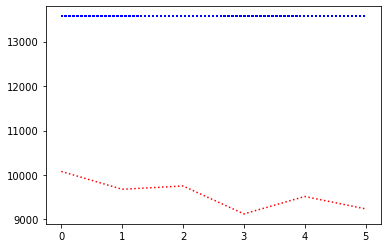

record the last path to gazebo for showing up


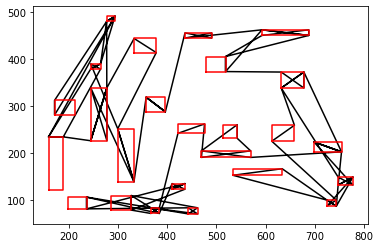

epoch:0, batch:700/2500, reward:9260.904296875


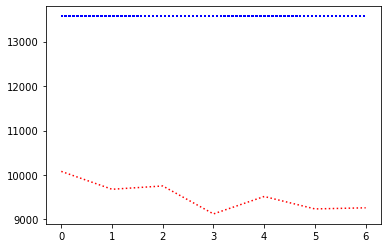

record the last path to gazebo for showing up


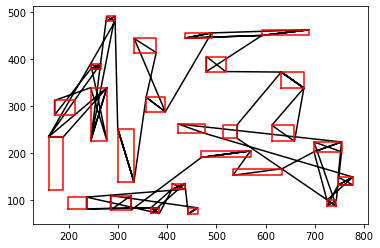

epoch:0, batch:800/2500, reward:9011.353515625


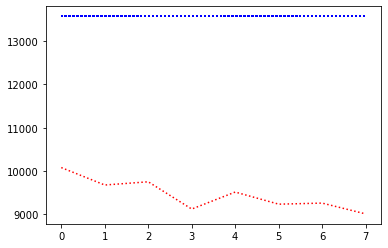

record the last path to gazebo for showing up


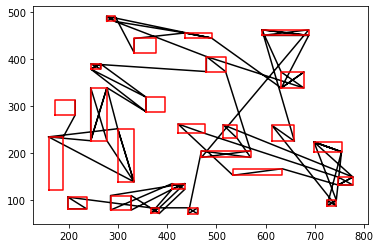

epoch:0, batch:900/2500, reward:8947.740234375


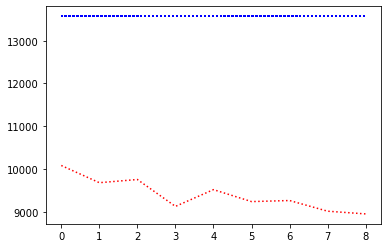

record the last path to gazebo for showing up


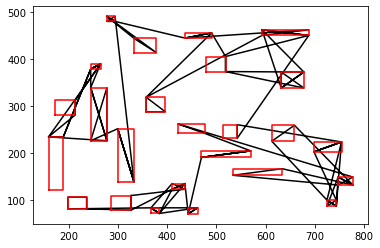

epoch:0, batch:1000/2500, reward:9208.4677734375


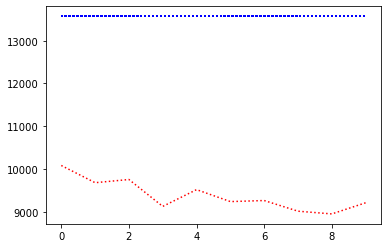

record the last path to gazebo for showing up


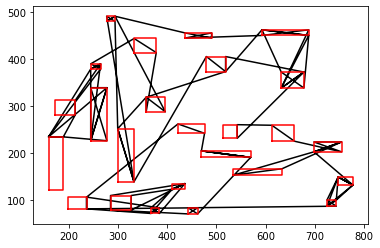

epoch:0, batch:1100/2500, reward:8610.06640625


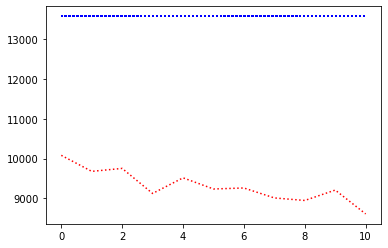

record the last path to gazebo for showing up


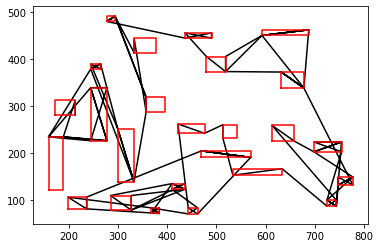

epoch:0, batch:1200/2500, reward:8733.609375


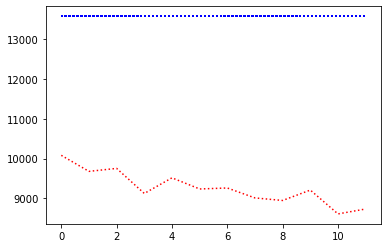

record the last path to gazebo for showing up


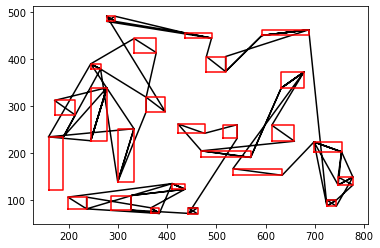

epoch:0, batch:1300/2500, reward:8568.34375


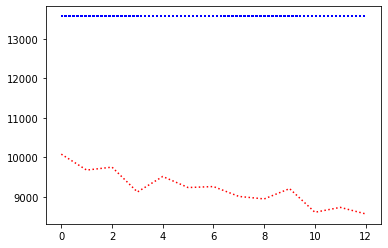

record the last path to gazebo for showing up


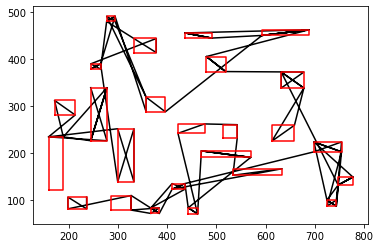

epoch:0, batch:1400/2500, reward:8826.2900390625


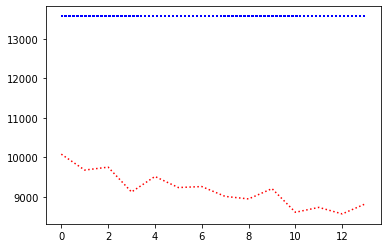

record the last path to gazebo for showing up


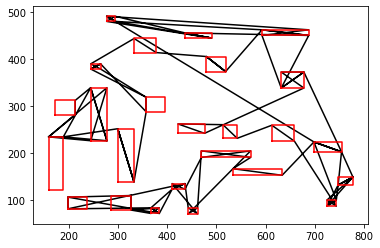

epoch:0, batch:1500/2500, reward:8854.5703125


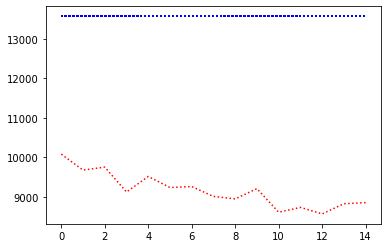

record the last path to gazebo for showing up


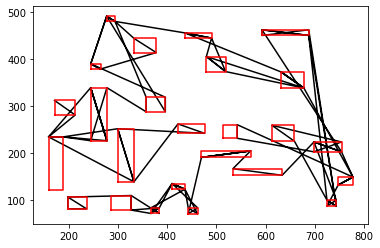

epoch:0, batch:1600/2500, reward:8525.6328125


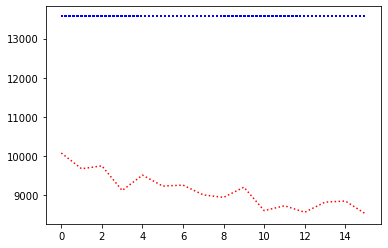

record the last path to gazebo for showing up


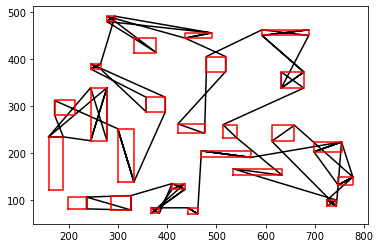

epoch:0, batch:1700/2500, reward:8614.1650390625


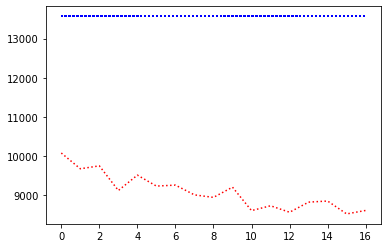

record the last path to gazebo for showing up


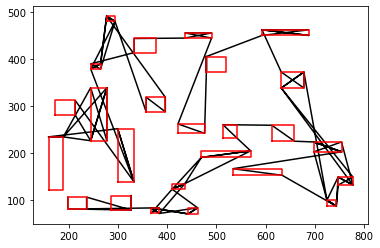

epoch:0, batch:1800/2500, reward:8393.552734375


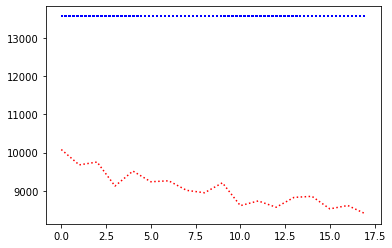

record the last path to gazebo for showing up


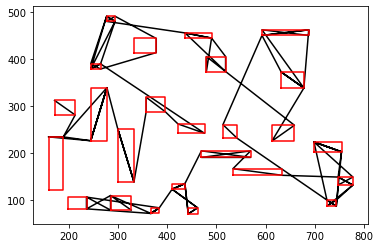

epoch:0, batch:1900/2500, reward:8652.00390625


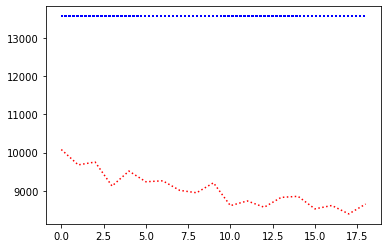

record the last path to gazebo for showing up


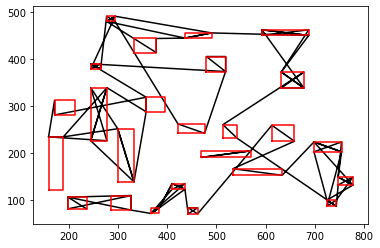

epoch:0, batch:2000/2500, reward:8652.3876953125


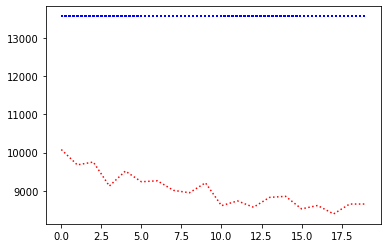

record the last path to gazebo for showing up


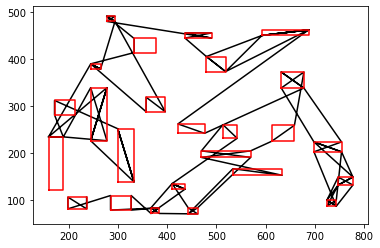

epoch:0, batch:2100/2500, reward:8778.22265625


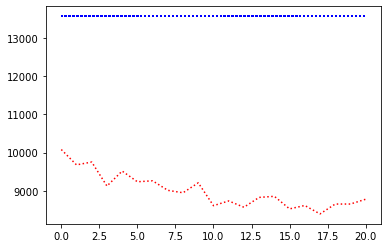

record the last path to gazebo for showing up


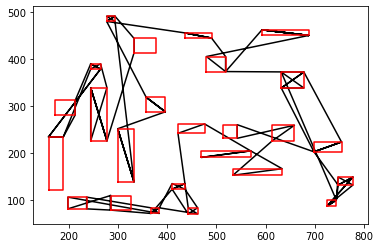

epoch:0, batch:2200/2500, reward:9177.3095703125


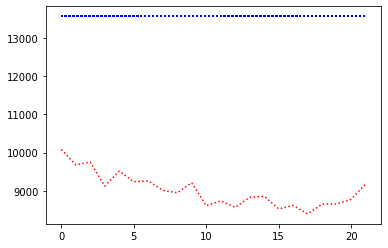

record the last path to gazebo for showing up


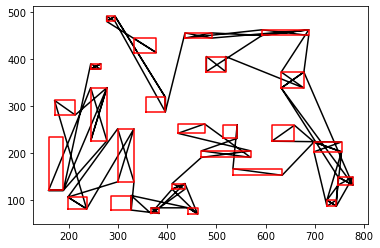

epoch:0, batch:2300/2500, reward:9167.666015625


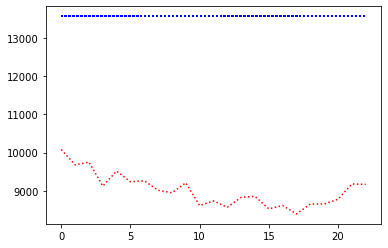

record the last path to gazebo for showing up


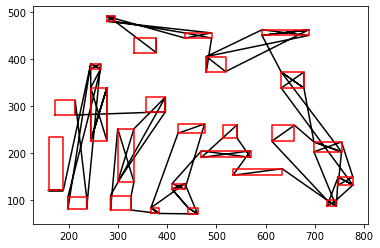

epoch:0, batch:2400/2500, reward:9188.1435546875


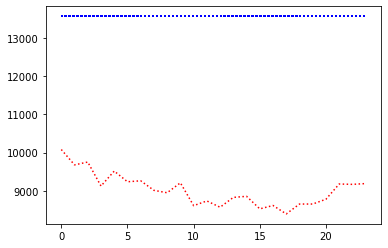

record the last path to gazebo for showing up


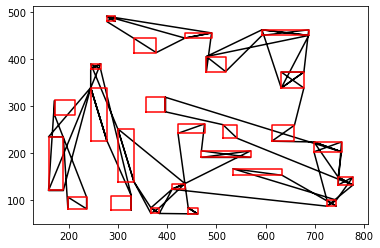

epoch:0, batch:2500/2500, reward:9491.935546875


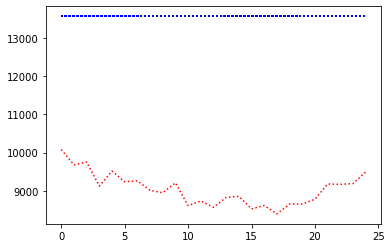

record the last path to gazebo for showing up


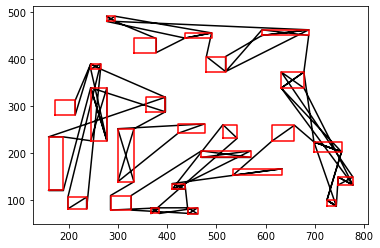

Avg Actor 8569.6591796875 --- Avg Critic 13571.6474609375
My actor is going on the right road Hallelujah :) Updated
Epoch: 0, epoch time: 85.549min, tot time: 0.059day, L_actor: 8569.659, L_critic: 13571.647, update: True
Save Checkpoints
epoch:1, batch:100/2500, reward:8716.4765625


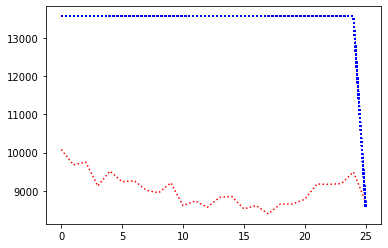

record the last path to gazebo for showing up


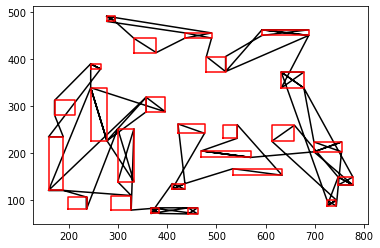

epoch:1, batch:200/2500, reward:8585.5009765625


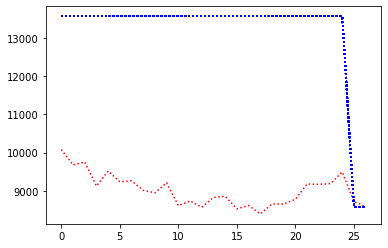

record the last path to gazebo for showing up


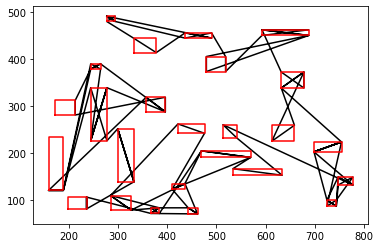

epoch:1, batch:300/2500, reward:8466.34375


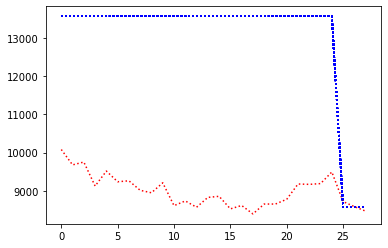

record the last path to gazebo for showing up


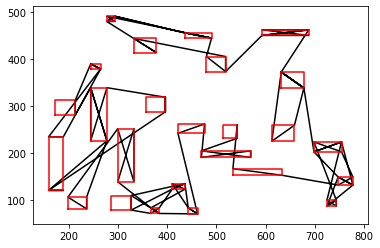

epoch:1, batch:400/2500, reward:8246.59765625


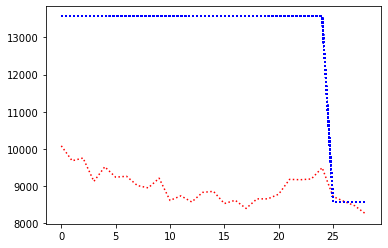

record the last path to gazebo for showing up


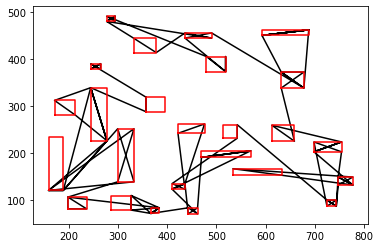

epoch:1, batch:500/2500, reward:8167.0673828125


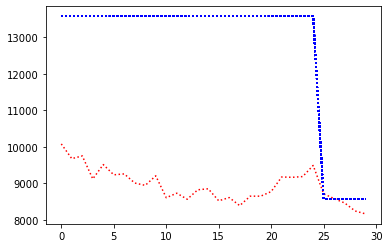

record the last path to gazebo for showing up


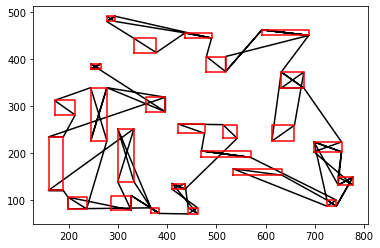

epoch:1, batch:600/2500, reward:8041.73291015625


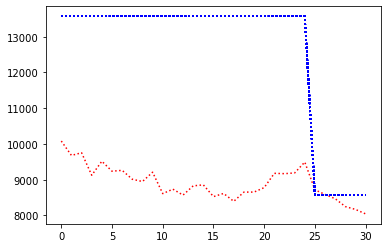

record the last path to gazebo for showing up


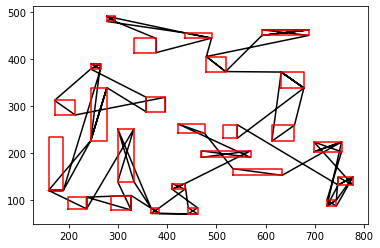

epoch:1, batch:700/2500, reward:7996.3447265625


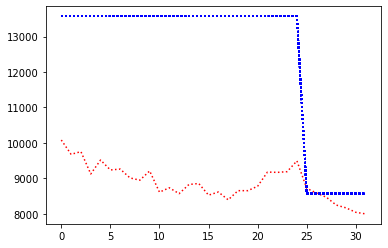

record the last path to gazebo for showing up


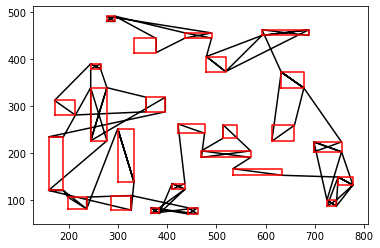

epoch:1, batch:800/2500, reward:7959.87158203125


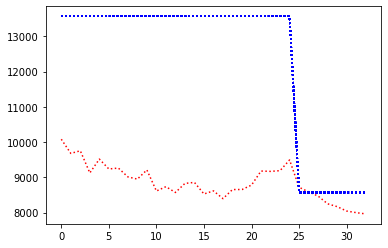

record the last path to gazebo for showing up


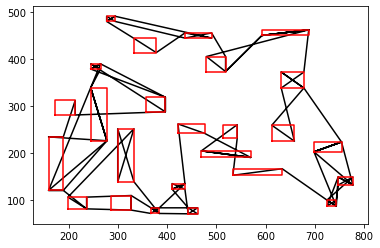

epoch:1, batch:900/2500, reward:7947.60888671875


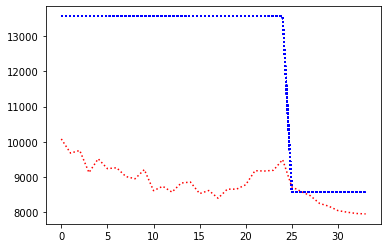

record the last path to gazebo for showing up


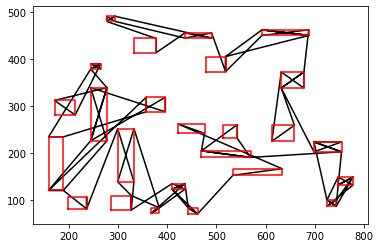

epoch:1, batch:1000/2500, reward:7906.18994140625


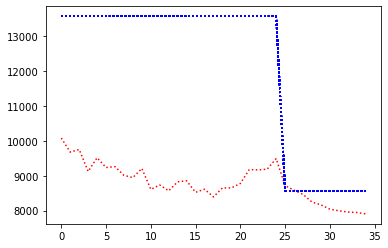

record the last path to gazebo for showing up


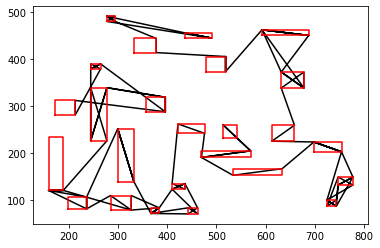

epoch:1, batch:1100/2500, reward:7900.59375


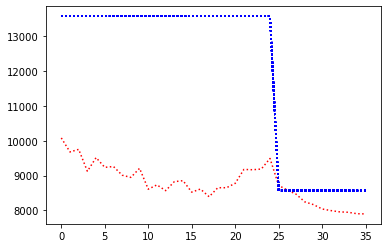

record the last path to gazebo for showing up


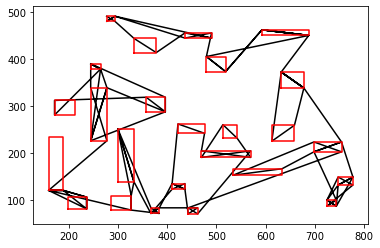

epoch:1, batch:1200/2500, reward:7805.1005859375


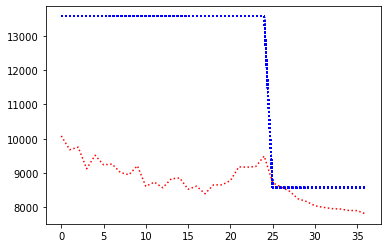

record the last path to gazebo for showing up


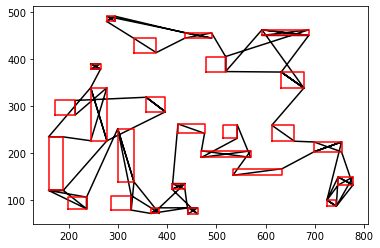

epoch:1, batch:1300/2500, reward:7777.1708984375


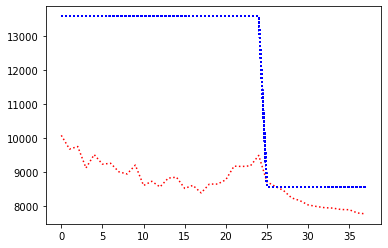

record the last path to gazebo for showing up


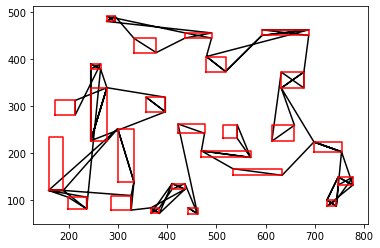

epoch:1, batch:1400/2500, reward:7743.3505859375


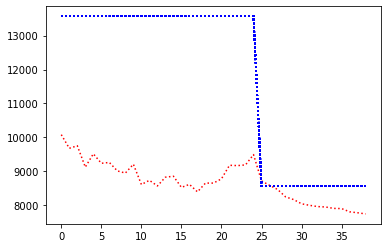

record the last path to gazebo for showing up


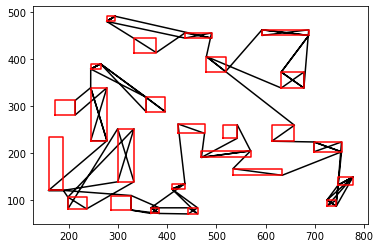

epoch:1, batch:1500/2500, reward:7744.70947265625


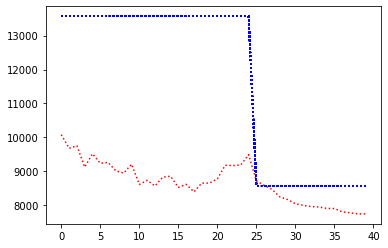

record the last path to gazebo for showing up


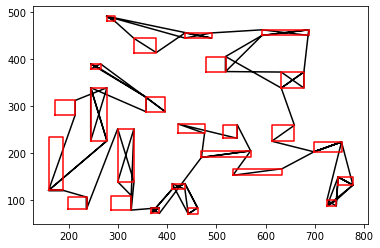

epoch:1, batch:1600/2500, reward:7735.1552734375


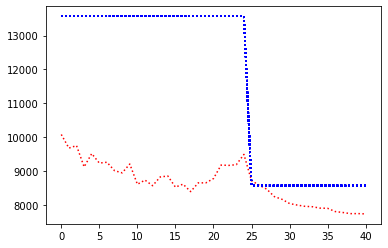

record the last path to gazebo for showing up


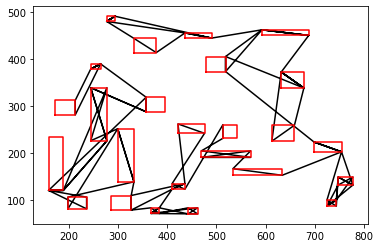

epoch:1, batch:1700/2500, reward:7579.9755859375


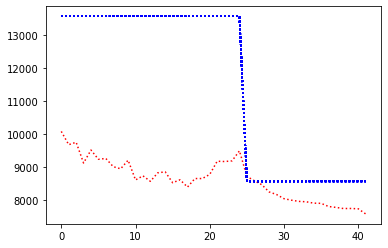

record the last path to gazebo for showing up


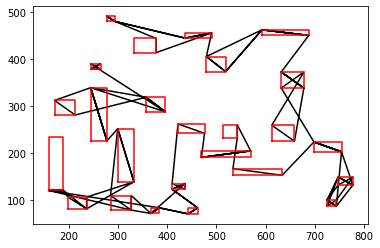

epoch:1, batch:1800/2500, reward:7577.12744140625


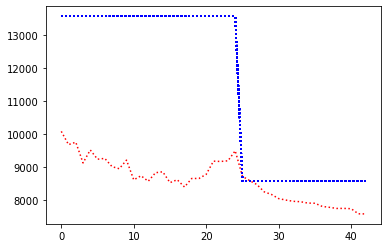

record the last path to gazebo for showing up


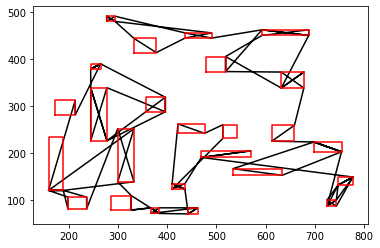

epoch:1, batch:1900/2500, reward:7679.0830078125


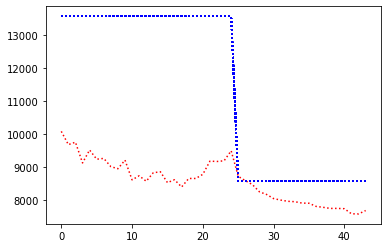

record the last path to gazebo for showing up


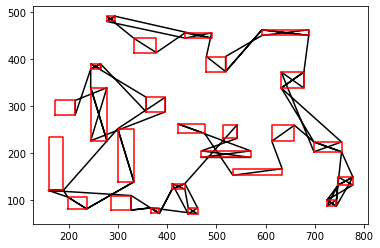

epoch:1, batch:2000/2500, reward:7545.67578125


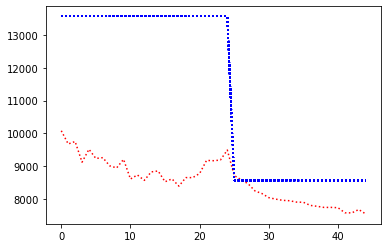

record the last path to gazebo for showing up


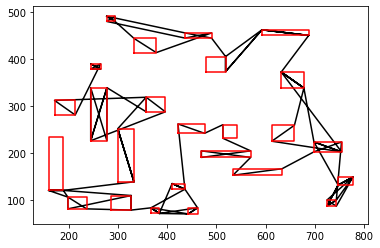

epoch:1, batch:2100/2500, reward:7534.96142578125


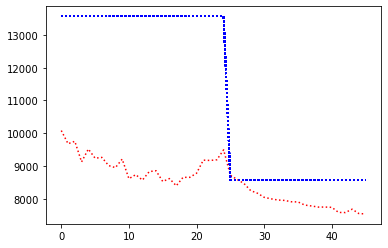

record the last path to gazebo for showing up


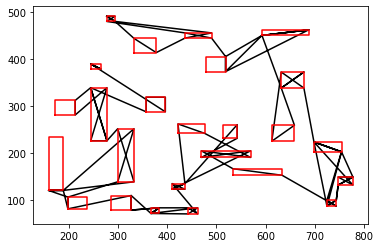

epoch:1, batch:2200/2500, reward:7590.25244140625


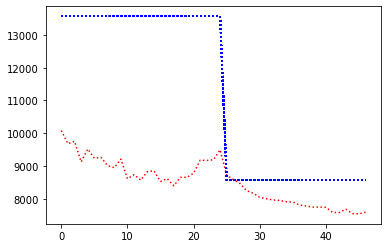

record the last path to gazebo for showing up


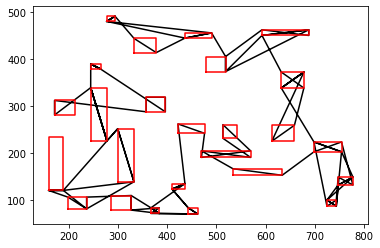

epoch:1, batch:2300/2500, reward:7481.8125


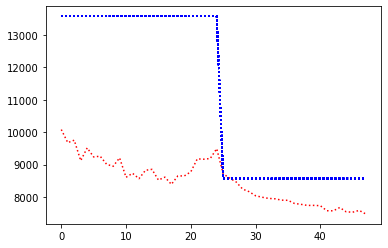

record the last path to gazebo for showing up


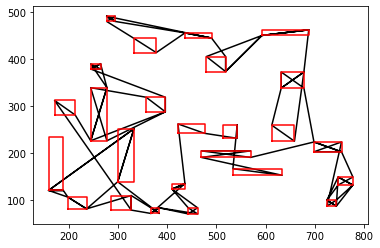

epoch:1, batch:2400/2500, reward:7526.53515625


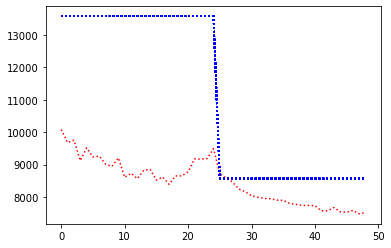

record the last path to gazebo for showing up


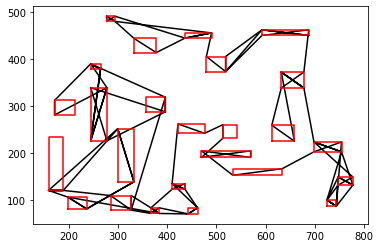

epoch:1, batch:2500/2500, reward:7588.94384765625


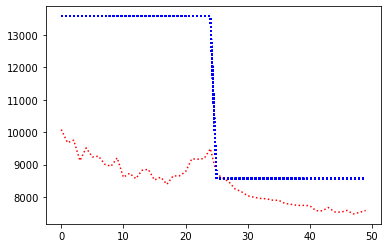

record the last path to gazebo for showing up


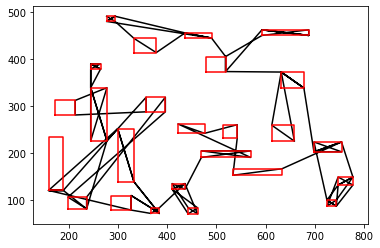

Avg Actor 7844.0966796875 --- Avg Critic 8569.6591796875
My actor is going on the right road Hallelujah :) Updated
Epoch: 1, epoch time: 85.880min, tot time: 0.120day, L_actor: 7844.097, L_critic: 8569.659, update: True
Save Checkpoints
epoch:2, batch:100/2500, reward:7345.8623046875


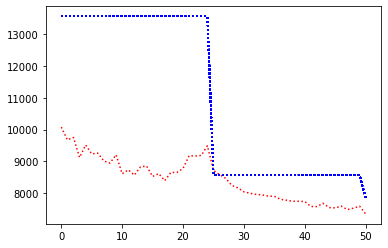

record the last path to gazebo for showing up


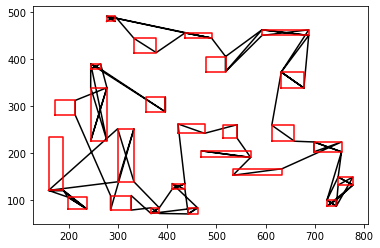

epoch:2, batch:200/2500, reward:7316.62109375


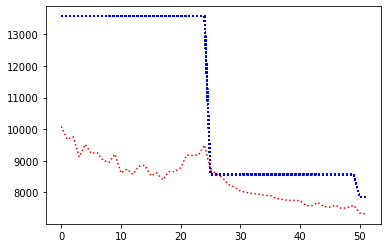

record the last path to gazebo for showing up


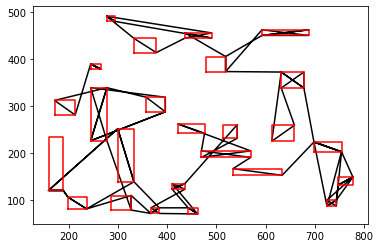

epoch:2, batch:300/2500, reward:7314.92431640625


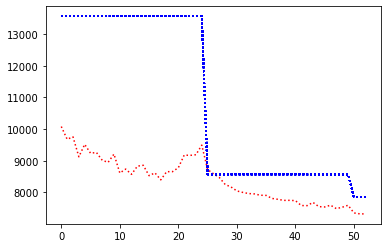

record the last path to gazebo for showing up


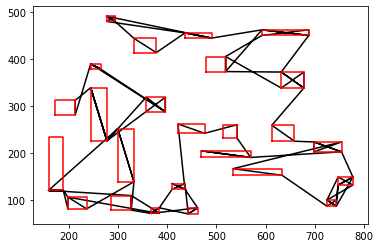

epoch:2, batch:400/2500, reward:7229.1279296875


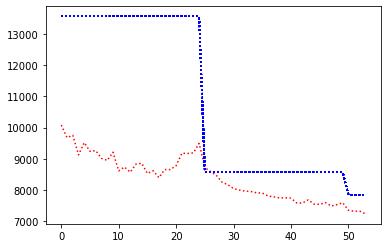

record the last path to gazebo for showing up


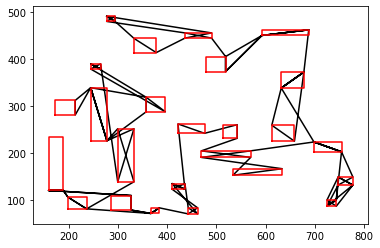

epoch:2, batch:500/2500, reward:7268.14306640625


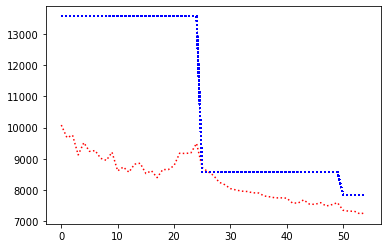

record the last path to gazebo for showing up


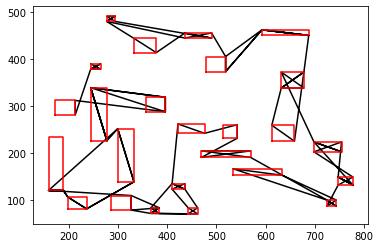

epoch:2, batch:600/2500, reward:7230.00927734375


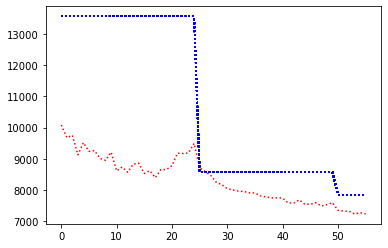

record the last path to gazebo for showing up


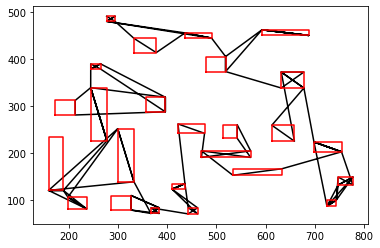

epoch:2, batch:700/2500, reward:7216.15576171875


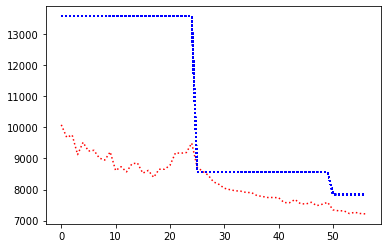

record the last path to gazebo for showing up


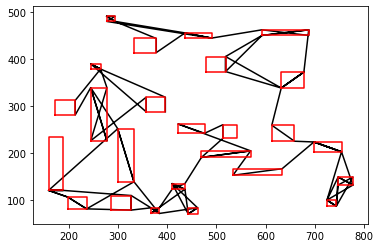

epoch:2, batch:800/2500, reward:7227.728515625


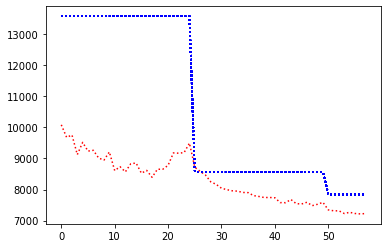

record the last path to gazebo for showing up


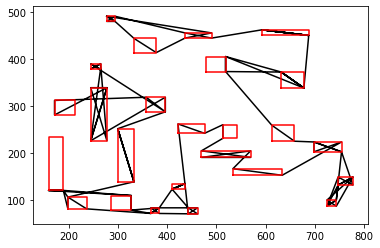

epoch:2, batch:900/2500, reward:7223.97265625


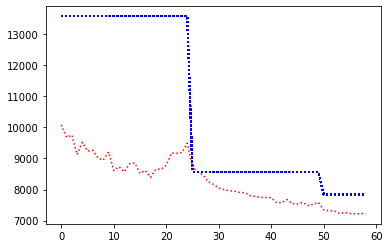

record the last path to gazebo for showing up


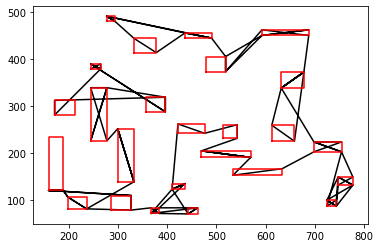

epoch:2, batch:1000/2500, reward:7209.009765625


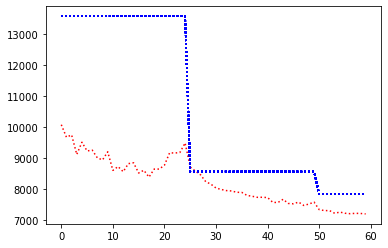

record the last path to gazebo for showing up


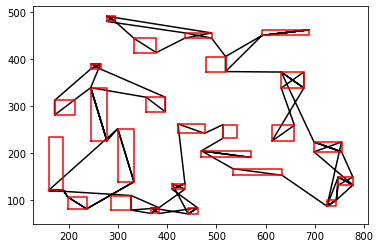

epoch:2, batch:1100/2500, reward:7188.2763671875


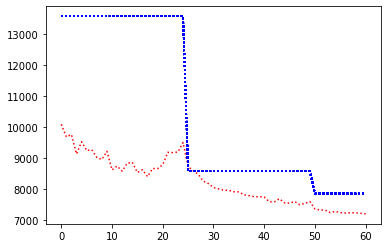

record the last path to gazebo for showing up


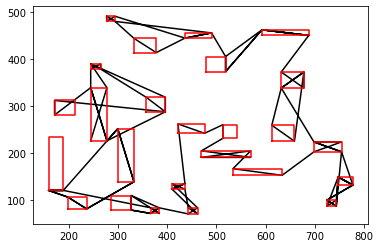

epoch:2, batch:1200/2500, reward:7206.638671875


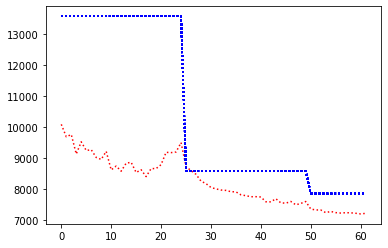

record the last path to gazebo for showing up


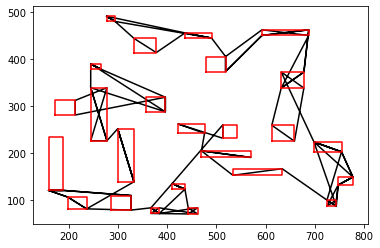

epoch:2, batch:1300/2500, reward:7198.2685546875


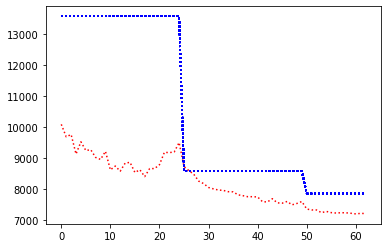

record the last path to gazebo for showing up


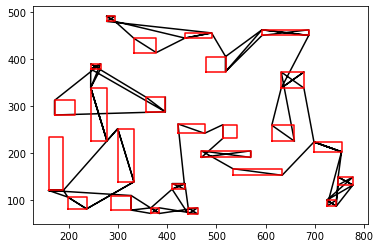

epoch:2, batch:1400/2500, reward:7300.2353515625


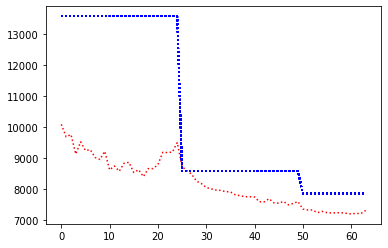

record the last path to gazebo for showing up


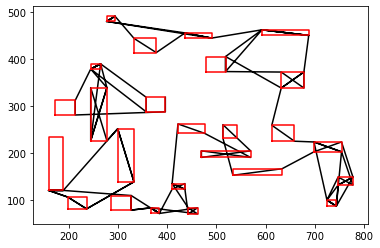

epoch:2, batch:1500/2500, reward:7243.9345703125


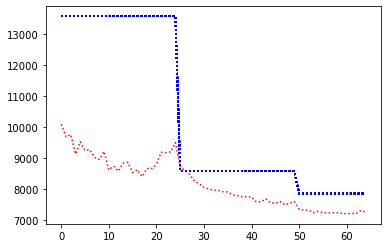

record the last path to gazebo for showing up


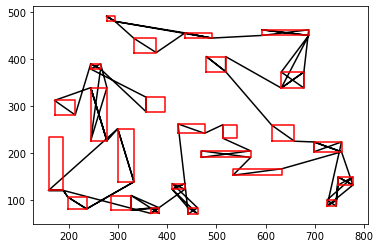

epoch:2, batch:1600/2500, reward:7139.28369140625


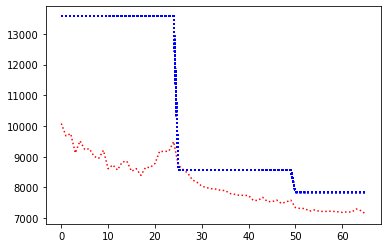

record the last path to gazebo for showing up


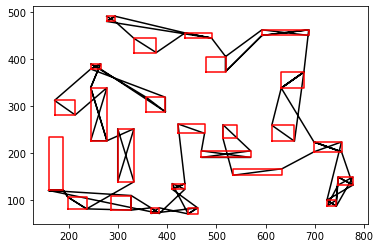

epoch:2, batch:1700/2500, reward:7142.861328125


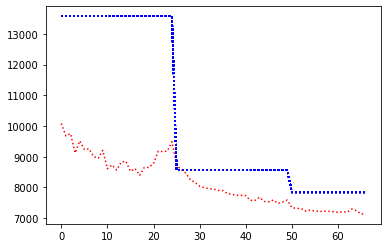

record the last path to gazebo for showing up


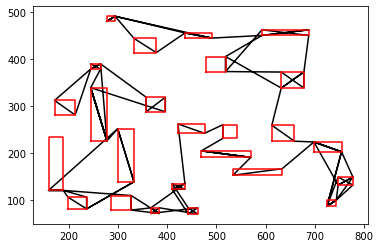

epoch:2, batch:1800/2500, reward:7169.287109375


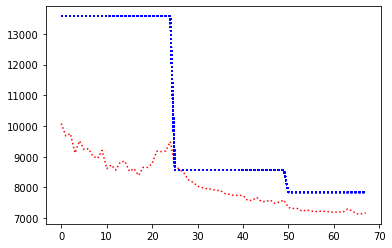

record the last path to gazebo for showing up


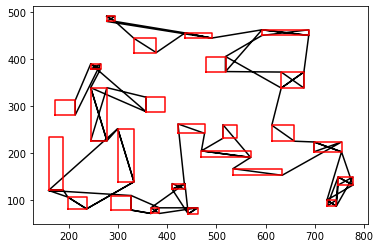

epoch:2, batch:1900/2500, reward:7139.2392578125


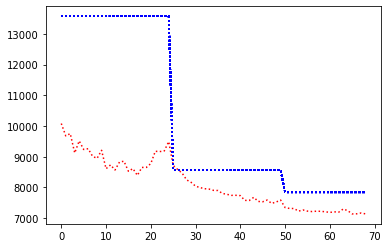

record the last path to gazebo for showing up


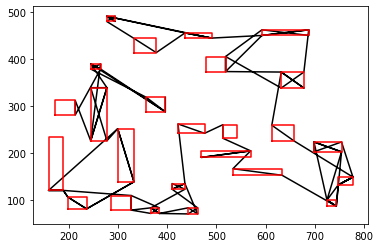

epoch:2, batch:2000/2500, reward:7140.5859375


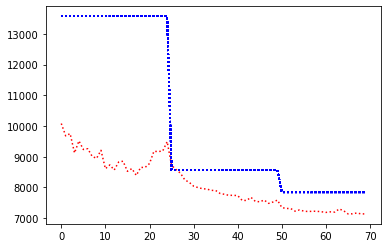

record the last path to gazebo for showing up


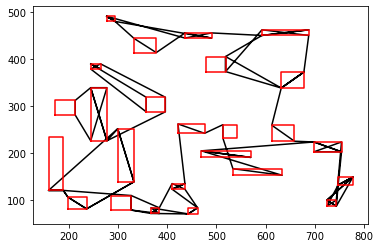

epoch:2, batch:2100/2500, reward:7103.3203125


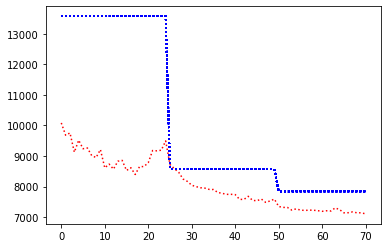

record the last path to gazebo for showing up


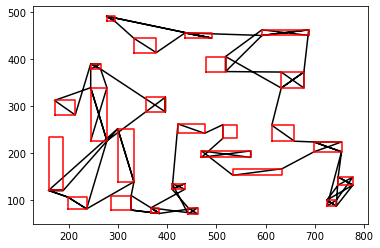

epoch:2, batch:2200/2500, reward:7173.505859375


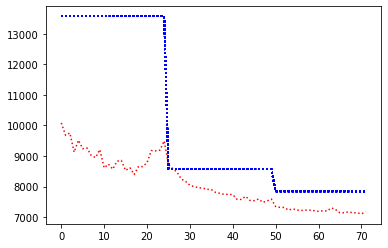

record the last path to gazebo for showing up


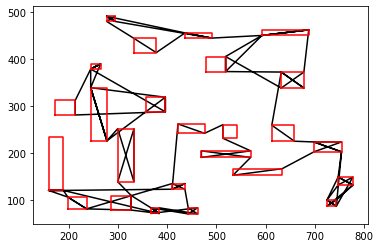

epoch:2, batch:2300/2500, reward:7113.828125


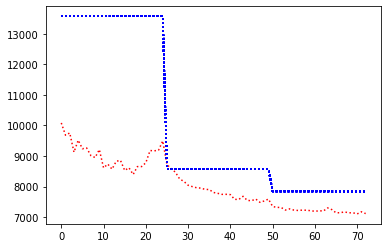

record the last path to gazebo for showing up


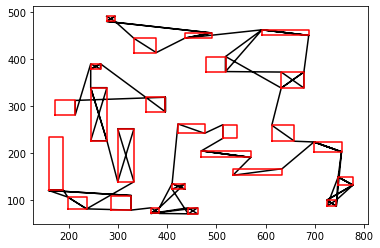

epoch:2, batch:2400/2500, reward:7202.6953125


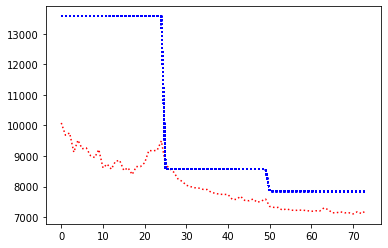

record the last path to gazebo for showing up


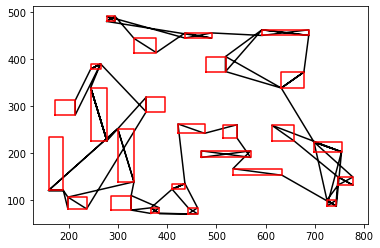

epoch:2, batch:2500/2500, reward:7093.33056640625


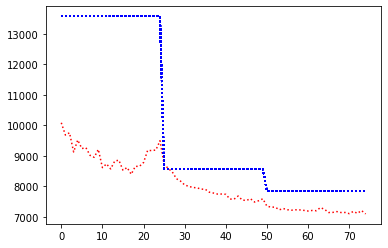

record the last path to gazebo for showing up


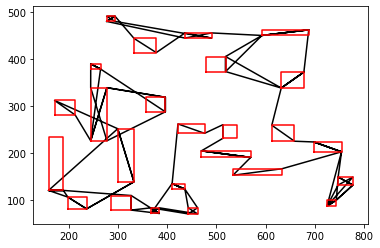

Avg Actor 7645.134765625 --- Avg Critic 7844.0966796875
My actor is going on the right road Hallelujah :) Updated
Epoch: 2, epoch time: 87.052min, tot time: 0.180day, L_actor: 7645.135, L_critic: 7844.097, update: True
Save Checkpoints
epoch:3, batch:100/2500, reward:7045.1201171875


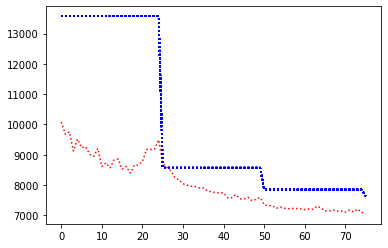

record the last path to gazebo for showing up


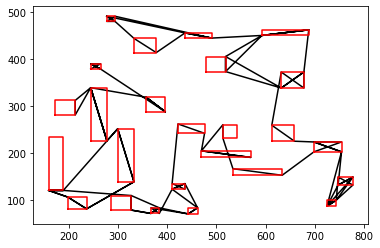

epoch:3, batch:200/2500, reward:7079.0283203125


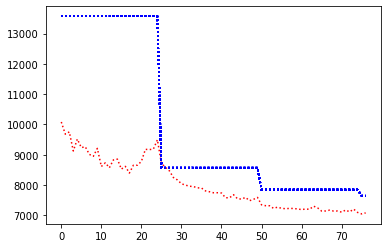

record the last path to gazebo for showing up


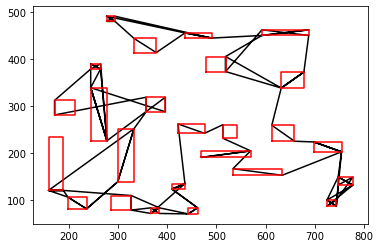

epoch:3, batch:300/2500, reward:7017.015625


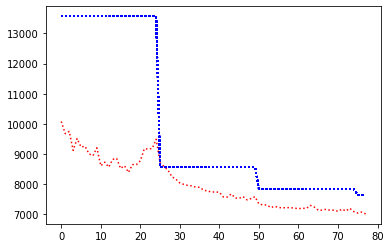

record the last path to gazebo for showing up


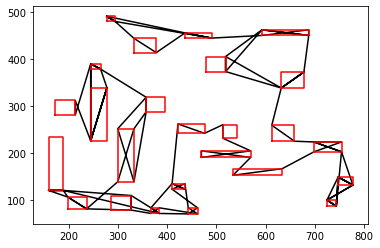

epoch:3, batch:400/2500, reward:6980.1689453125


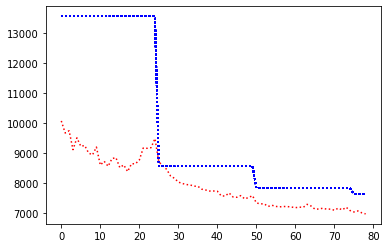

record the last path to gazebo for showing up


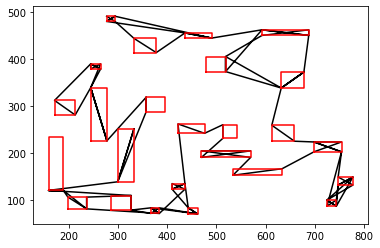

epoch:3, batch:500/2500, reward:7049.06884765625


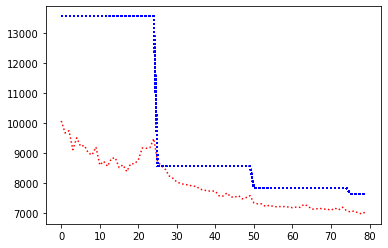

record the last path to gazebo for showing up


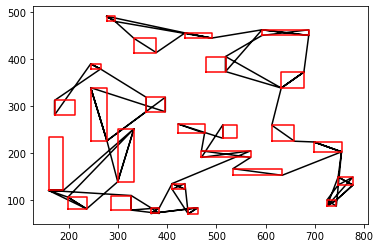

epoch:3, batch:600/2500, reward:6980.3427734375


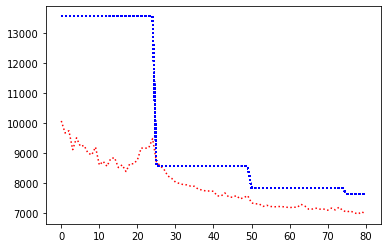

record the last path to gazebo for showing up


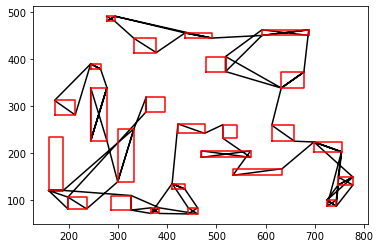

epoch:3, batch:700/2500, reward:7044.953125


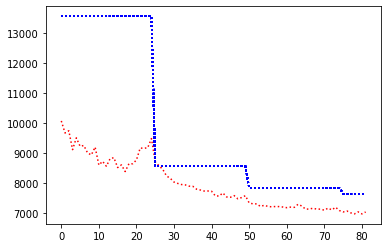

record the last path to gazebo for showing up


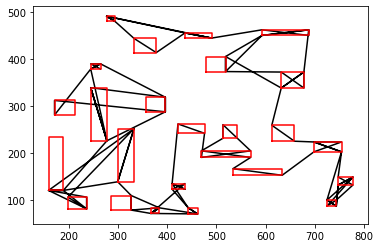

epoch:3, batch:800/2500, reward:7030.98486328125


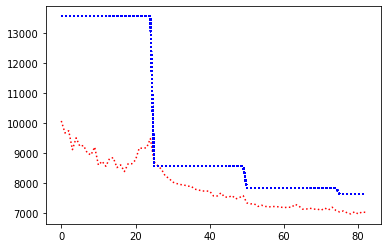

record the last path to gazebo for showing up


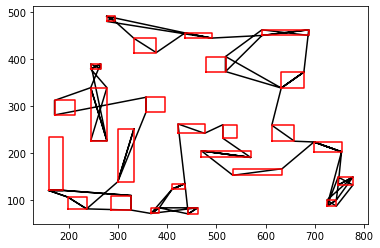

epoch:3, batch:900/2500, reward:6905.96728515625


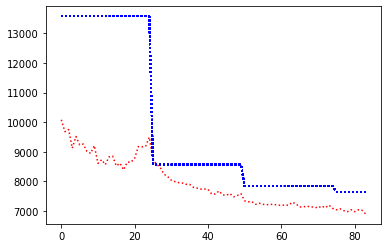

record the last path to gazebo for showing up


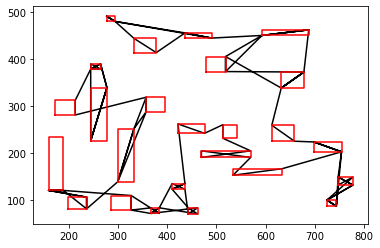

epoch:3, batch:1000/2500, reward:6950.7255859375


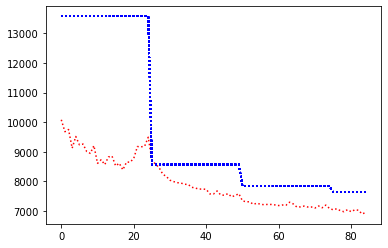

record the last path to gazebo for showing up


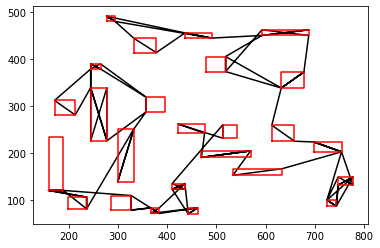

epoch:3, batch:1100/2500, reward:6884.9794921875


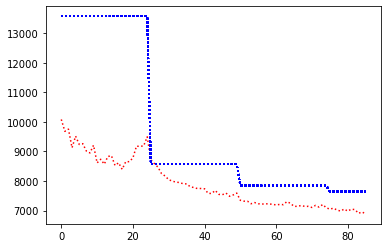

record the last path to gazebo for showing up


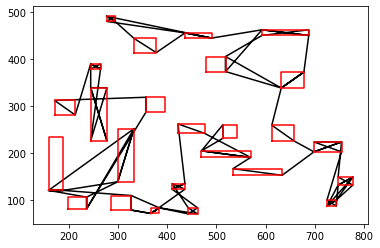

epoch:3, batch:1200/2500, reward:6847.431640625


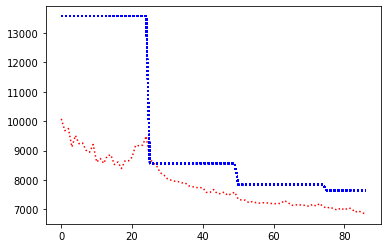

record the last path to gazebo for showing up


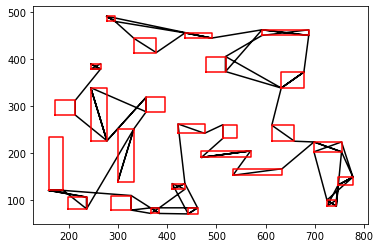

epoch:3, batch:1300/2500, reward:6912.734375


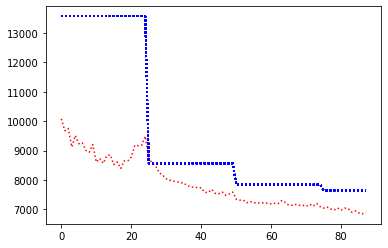

record the last path to gazebo for showing up


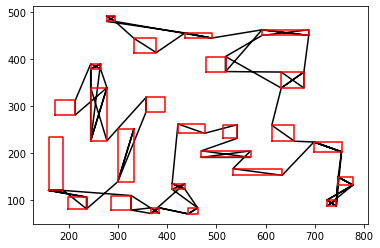

epoch:3, batch:1400/2500, reward:6850.30078125


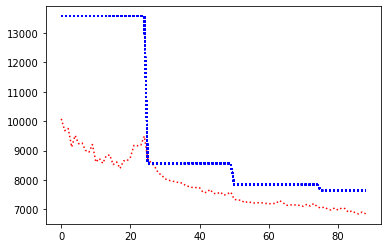

record the last path to gazebo for showing up


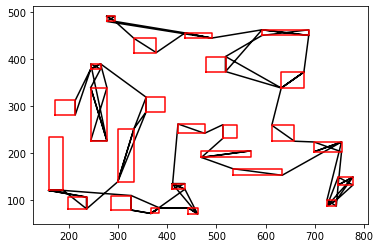

epoch:3, batch:1500/2500, reward:6902.1875


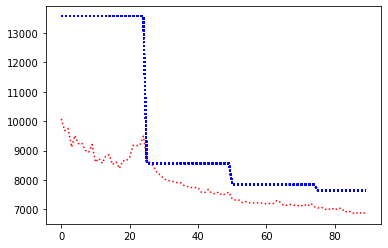

record the last path to gazebo for showing up


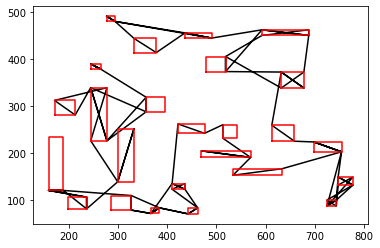

epoch:3, batch:1600/2500, reward:6844.466796875


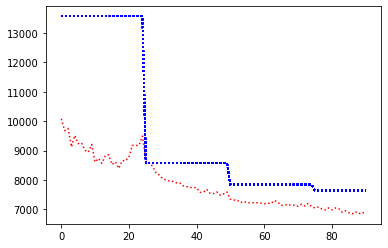

record the last path to gazebo for showing up


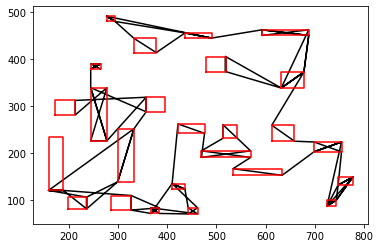

epoch:3, batch:1700/2500, reward:6883.08154296875


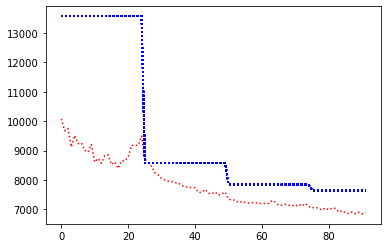

record the last path to gazebo for showing up


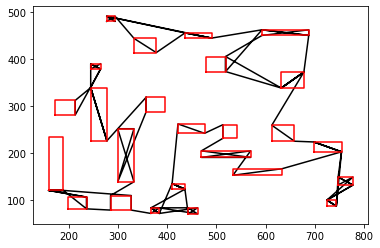

epoch:3, batch:1800/2500, reward:6887.220703125


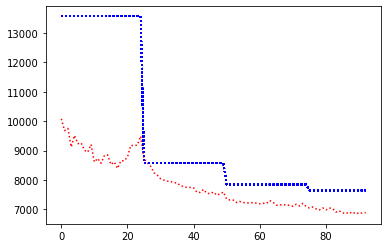

record the last path to gazebo for showing up


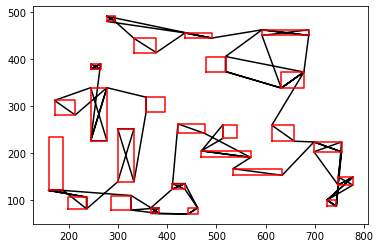

epoch:3, batch:1900/2500, reward:6905.572265625


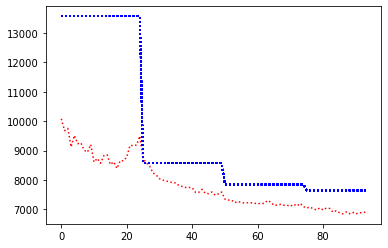

record the last path to gazebo for showing up


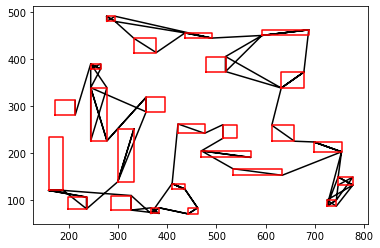

epoch:3, batch:2000/2500, reward:6892.5537109375


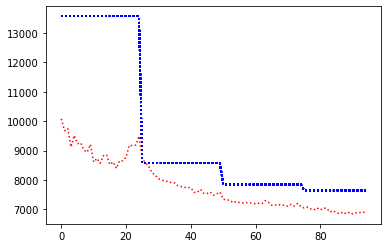

record the last path to gazebo for showing up


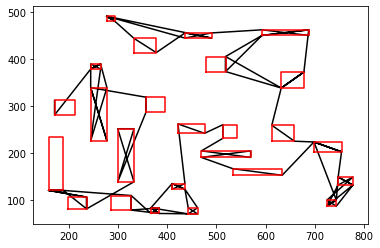

epoch:3, batch:2100/2500, reward:6722.09326171875


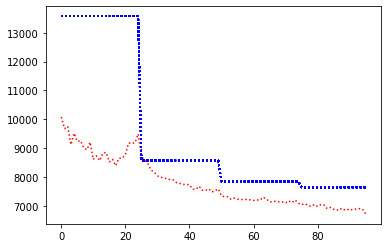

record the last path to gazebo for showing up


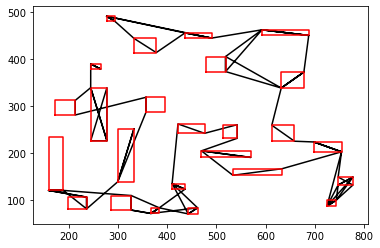

epoch:3, batch:2200/2500, reward:6754.2080078125


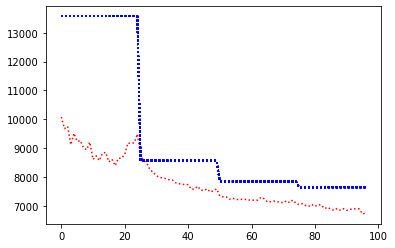

record the last path to gazebo for showing up


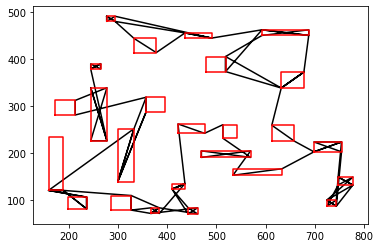

epoch:3, batch:2300/2500, reward:7003.0029296875


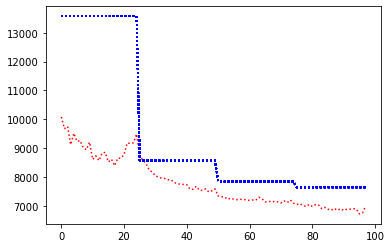

record the last path to gazebo for showing up


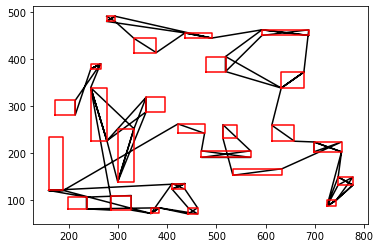

epoch:3, batch:2400/2500, reward:6895.427734375


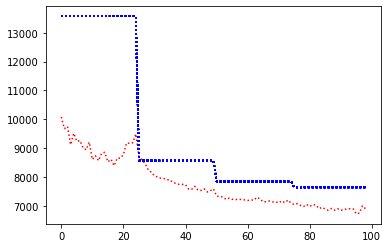

record the last path to gazebo for showing up


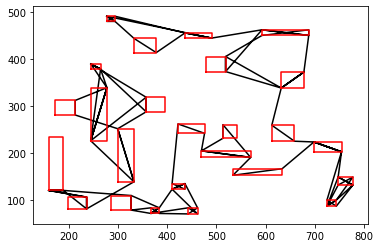

epoch:3, batch:2500/2500, reward:6781.41943359375


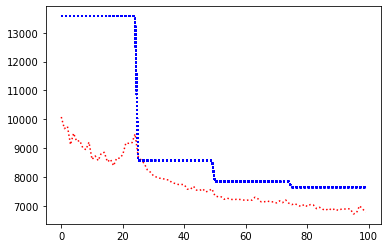

record the last path to gazebo for showing up


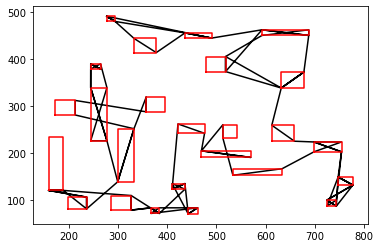

Avg Actor 6853.646484375 --- Avg Critic 7645.134765625
My actor is going on the right road Hallelujah :) Updated
Epoch: 3, epoch time: 87.552min, tot time: 0.242day, L_actor: 6853.646, L_critic: 7645.135, update: True
Save Checkpoints
epoch:4, batch:100/2500, reward:6620.1279296875


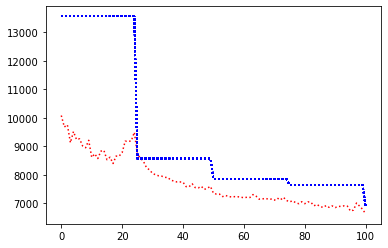

record the last path to gazebo for showing up


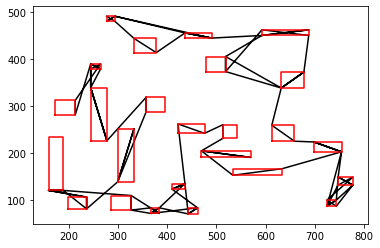

epoch:4, batch:200/2500, reward:6571.3232421875


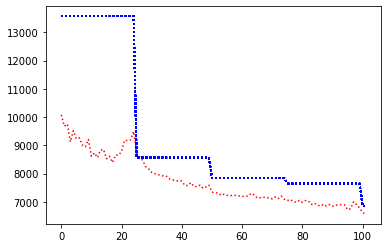

record the last path to gazebo for showing up


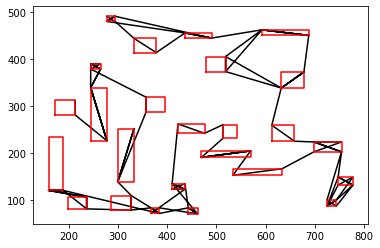

epoch:4, batch:300/2500, reward:6604.1943359375


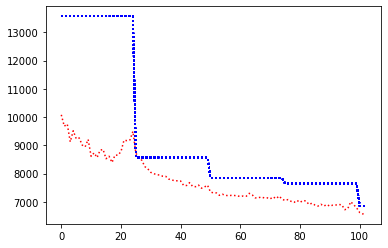

record the last path to gazebo for showing up


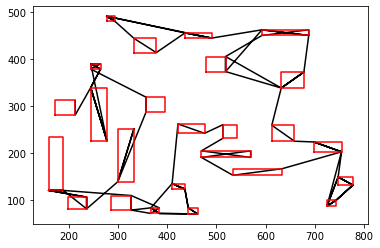

epoch:4, batch:400/2500, reward:6552.52587890625


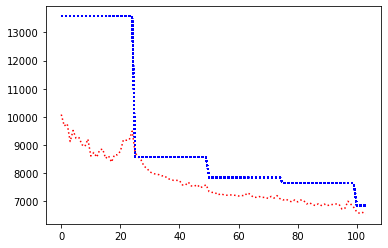

record the last path to gazebo for showing up


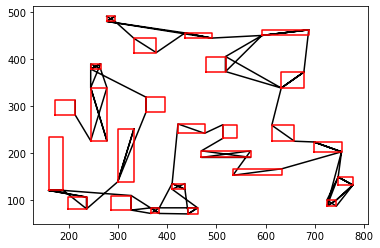

epoch:4, batch:500/2500, reward:6509.4248046875


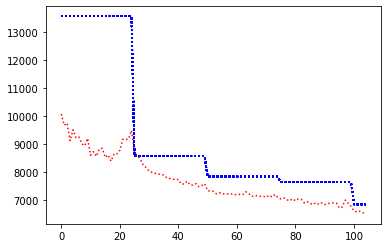

record the last path to gazebo for showing up


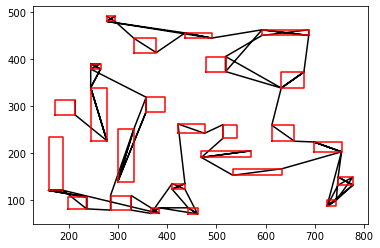

epoch:4, batch:600/2500, reward:6518.0263671875


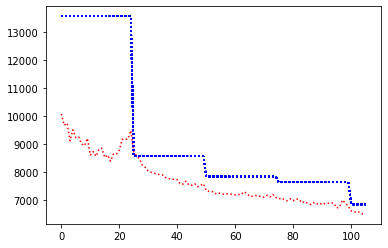

record the last path to gazebo for showing up


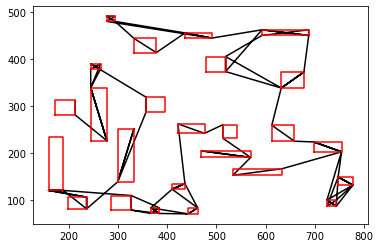

epoch:4, batch:700/2500, reward:6476.58349609375


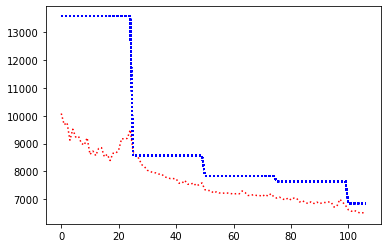

record the last path to gazebo for showing up


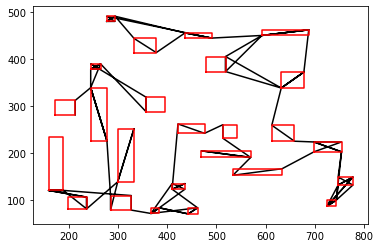

epoch:4, batch:800/2500, reward:6461.7685546875


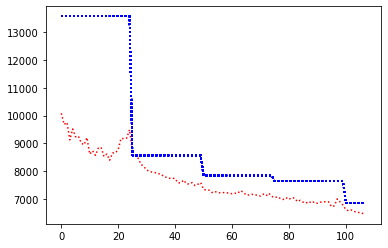

record the last path to gazebo for showing up


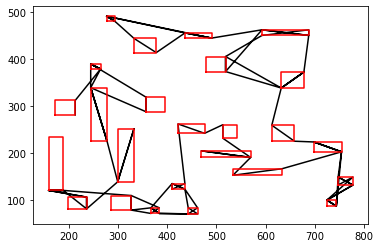

epoch:4, batch:900/2500, reward:6453.9228515625


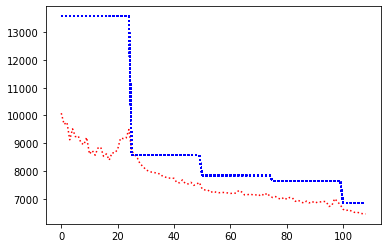

record the last path to gazebo for showing up


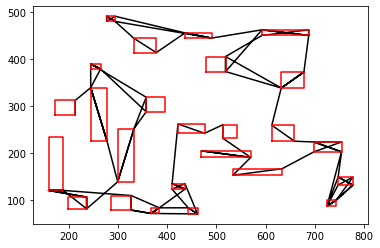

epoch:4, batch:1000/2500, reward:6495.8046875


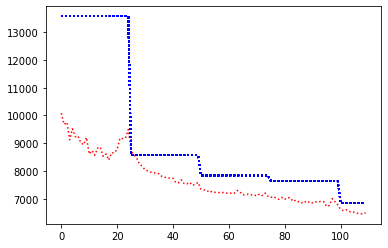

record the last path to gazebo for showing up


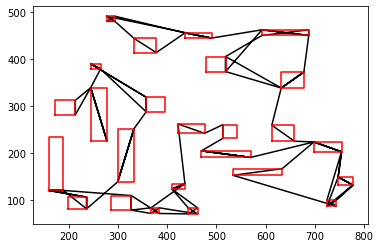

epoch:4, batch:1100/2500, reward:6448.6103515625


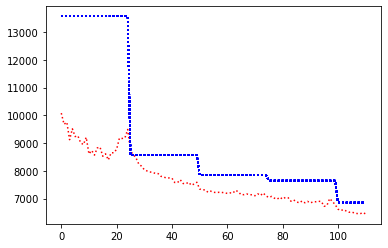

record the last path to gazebo for showing up


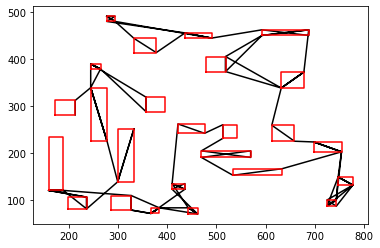

epoch:4, batch:1200/2500, reward:6437.3154296875


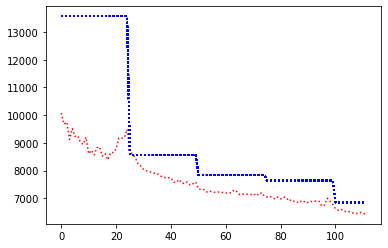

record the last path to gazebo for showing up


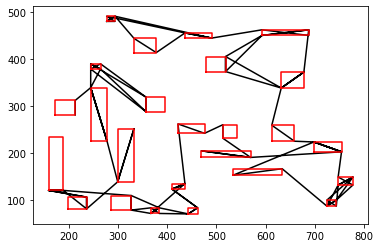

epoch:4, batch:1300/2500, reward:6416.73486328125


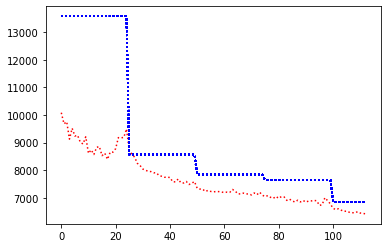

record the last path to gazebo for showing up


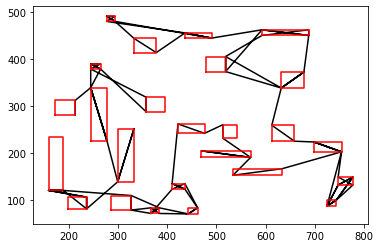

epoch:4, batch:1400/2500, reward:6404.51318359375


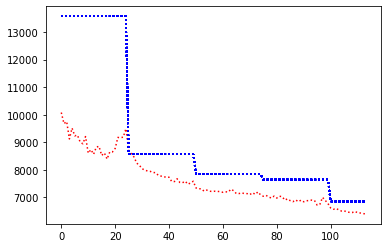

record the last path to gazebo for showing up


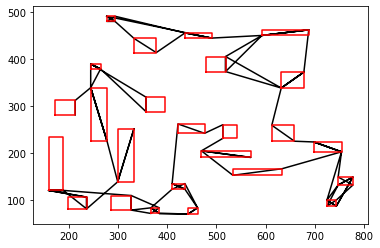

epoch:4, batch:1500/2500, reward:6449.3916015625


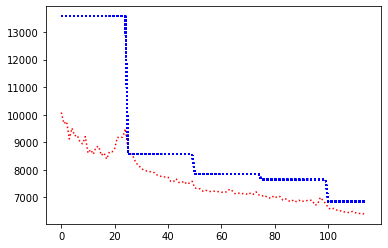

record the last path to gazebo for showing up


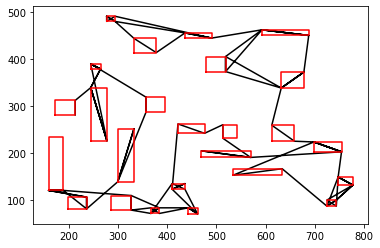

epoch:4, batch:1600/2500, reward:6436.98828125


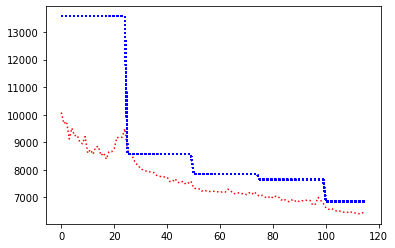

record the last path to gazebo for showing up


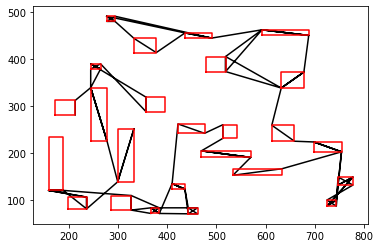

epoch:4, batch:1700/2500, reward:6386.201171875


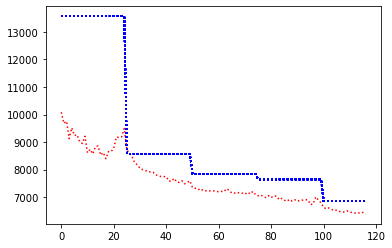

record the last path to gazebo for showing up


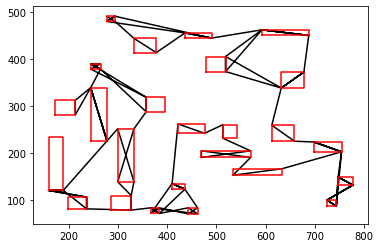

epoch:4, batch:1800/2500, reward:6457.318359375


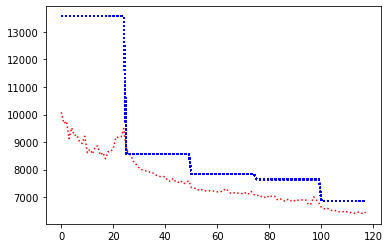

record the last path to gazebo for showing up


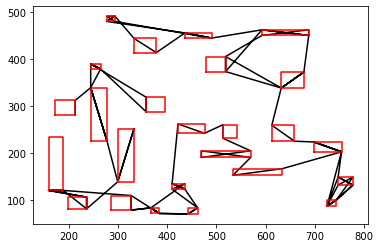

epoch:4, batch:1900/2500, reward:6372.96337890625


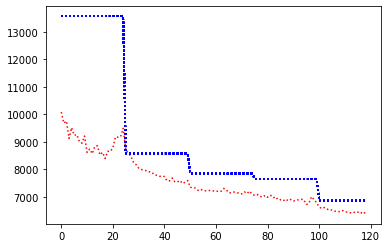

record the last path to gazebo for showing up


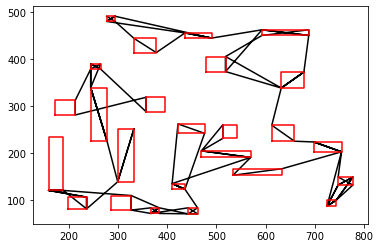

epoch:4, batch:2000/2500, reward:6400.623046875


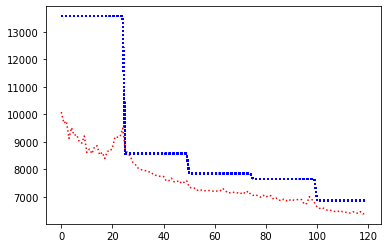

record the last path to gazebo for showing up


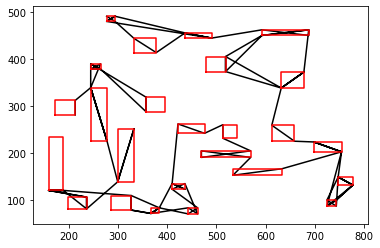

epoch:4, batch:2100/2500, reward:6436.20849609375


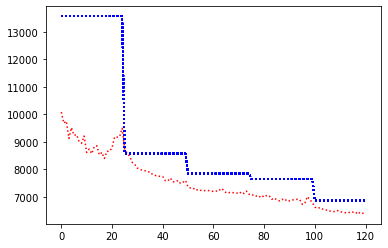

record the last path to gazebo for showing up


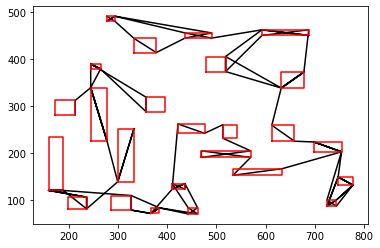

epoch:4, batch:2200/2500, reward:6422.365234375


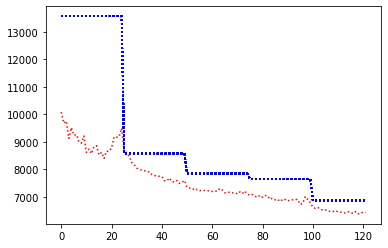

record the last path to gazebo for showing up


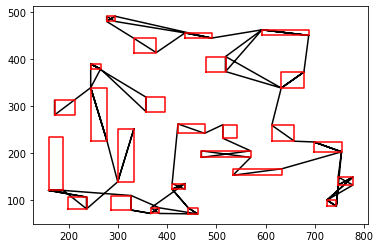

epoch:4, batch:2300/2500, reward:6400.58154296875


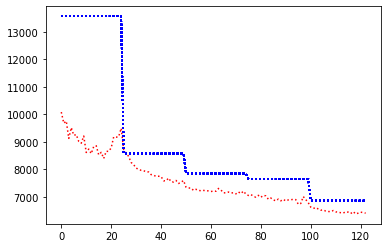

record the last path to gazebo for showing up


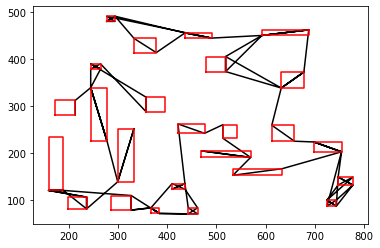

epoch:4, batch:2400/2500, reward:6385.9091796875


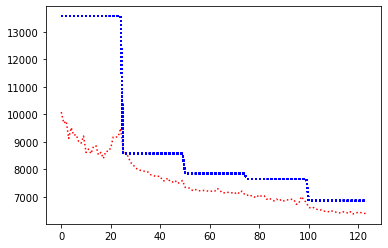

record the last path to gazebo for showing up


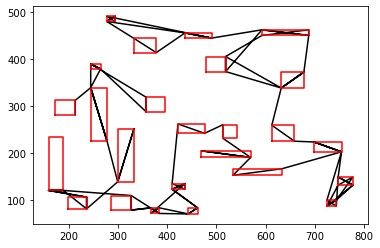

epoch:4, batch:2500/2500, reward:6386.89306640625


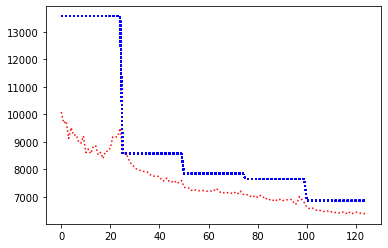

record the last path to gazebo for showing up


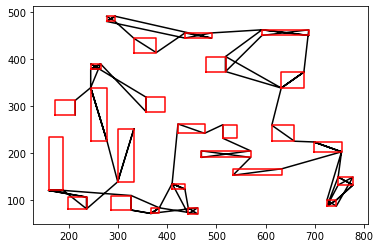

Avg Actor 10551.958984375 --- Avg Critic 6853.646484375
Epoch: 4, epoch time: 87.453min, tot time: 0.303day, L_actor: 10551.959, L_critic: 6853.646, update: False
Save Checkpoints
epoch:5, batch:100/2500, reward:6370.0458984375


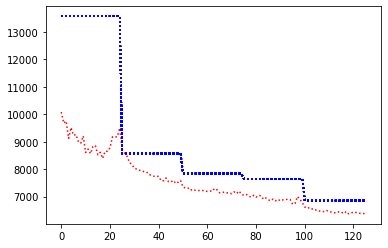

record the last path to gazebo for showing up


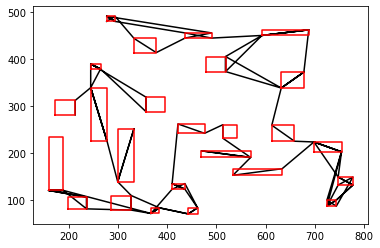

epoch:5, batch:200/2500, reward:6384.7197265625


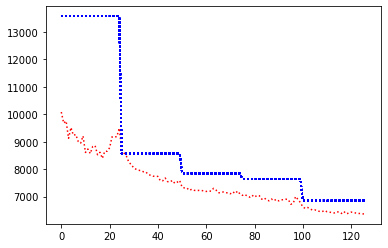

record the last path to gazebo for showing up


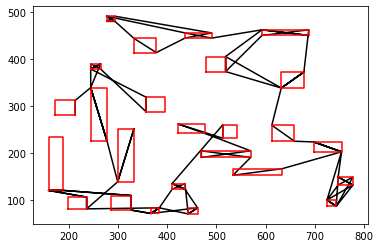

epoch:5, batch:300/2500, reward:6382.8828125


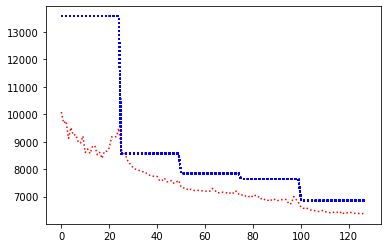

record the last path to gazebo for showing up


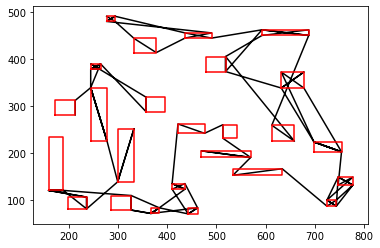

epoch:5, batch:400/2500, reward:6432.8984375


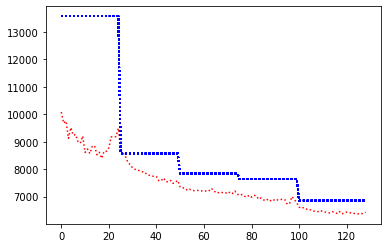

record the last path to gazebo for showing up


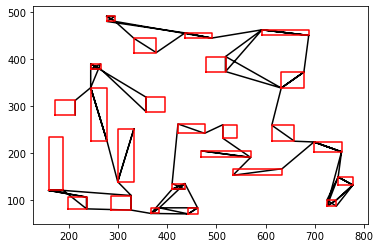

epoch:5, batch:500/2500, reward:6394.83642578125


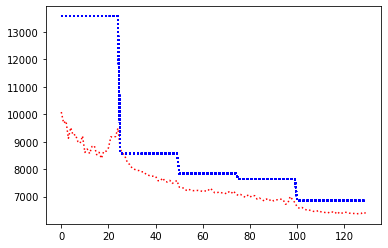

record the last path to gazebo for showing up


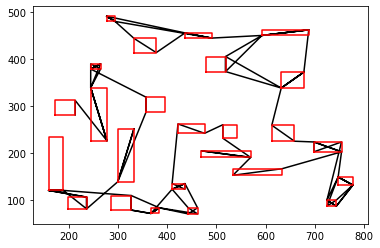

epoch:5, batch:600/2500, reward:6366.72802734375


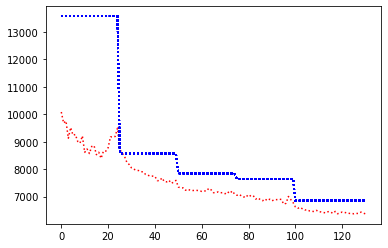

record the last path to gazebo for showing up


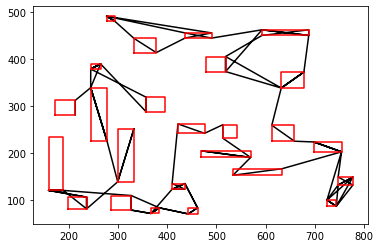

epoch:5, batch:700/2500, reward:6484.41259765625


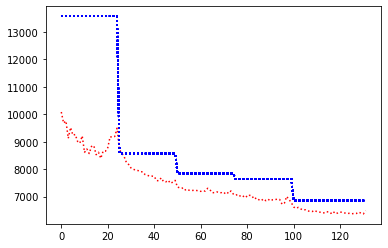

record the last path to gazebo for showing up


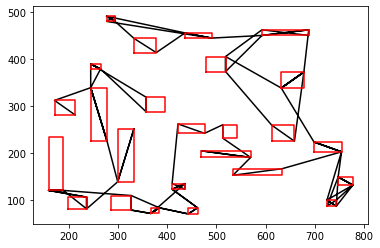

epoch:5, batch:800/2500, reward:6367.29248046875


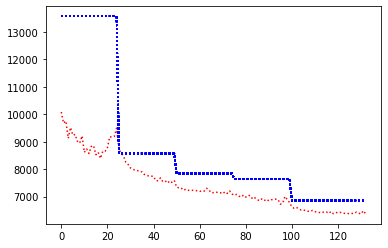

record the last path to gazebo for showing up


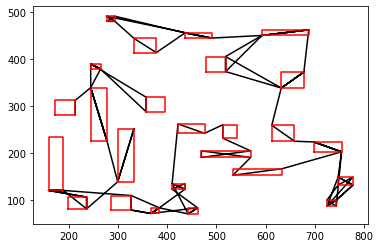

epoch:5, batch:900/2500, reward:6380.79931640625


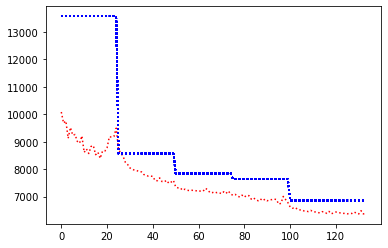

record the last path to gazebo for showing up


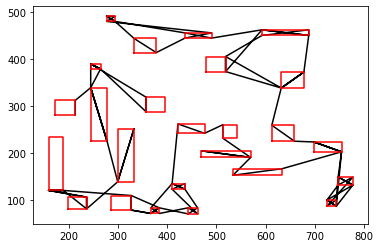

epoch:5, batch:1000/2500, reward:6439.25048828125


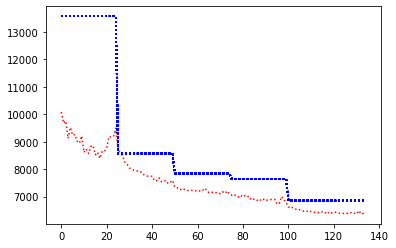

record the last path to gazebo for showing up


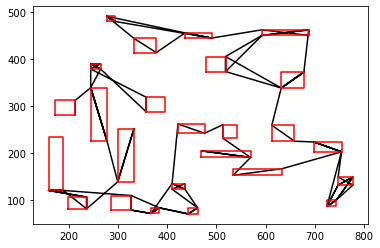

epoch:5, batch:1100/2500, reward:6417.44580078125


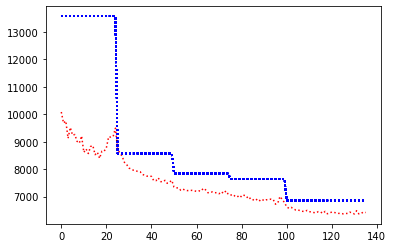

record the last path to gazebo for showing up


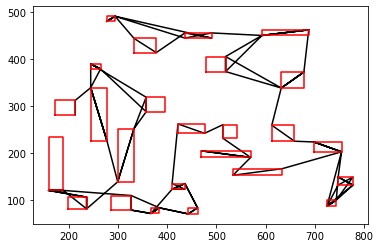

epoch:5, batch:1200/2500, reward:6364.47119140625


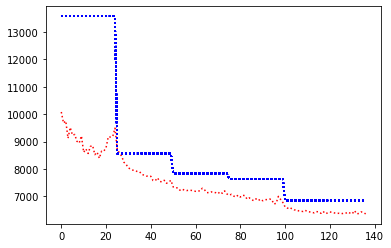

record the last path to gazebo for showing up


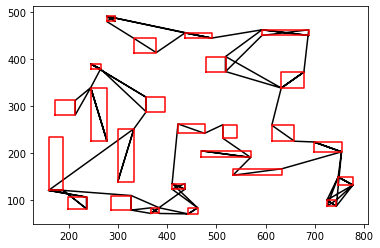

epoch:5, batch:1300/2500, reward:6412.22705078125


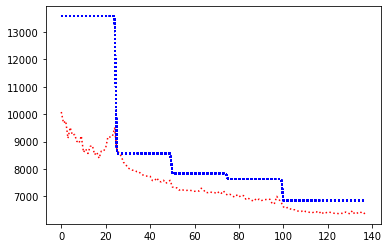

record the last path to gazebo for showing up


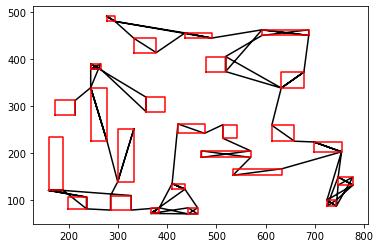

epoch:5, batch:1400/2500, reward:6400.29443359375


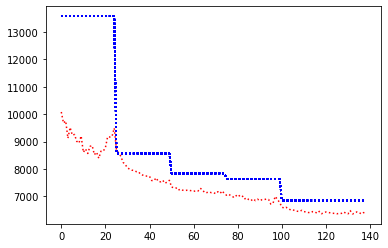

record the last path to gazebo for showing up


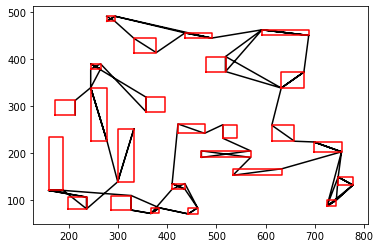

epoch:5, batch:1500/2500, reward:6368.1005859375


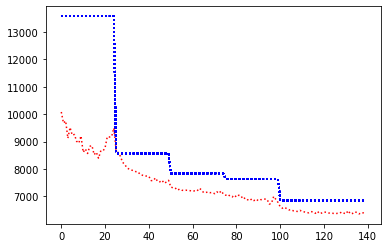

record the last path to gazebo for showing up


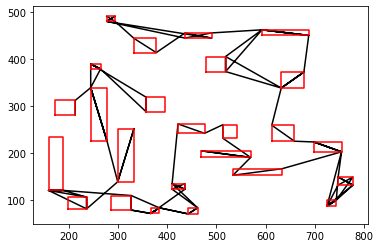

epoch:5, batch:1600/2500, reward:6388.1982421875


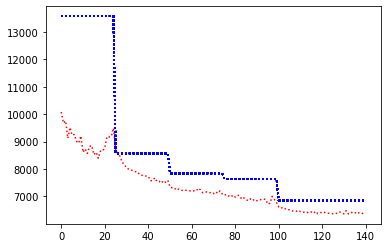

record the last path to gazebo for showing up


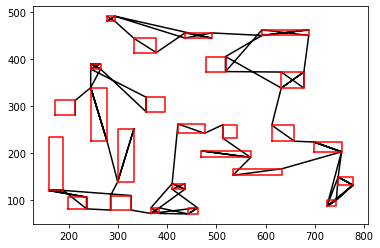

epoch:5, batch:1700/2500, reward:6346.8701171875


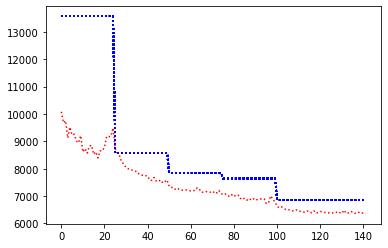

record the last path to gazebo for showing up


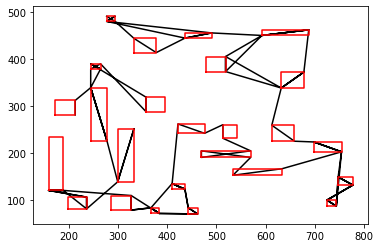

epoch:5, batch:1800/2500, reward:6351.3232421875


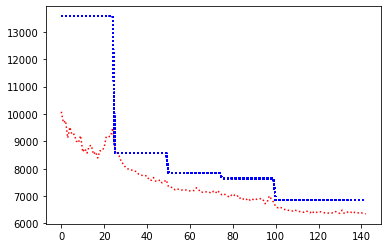

record the last path to gazebo for showing up


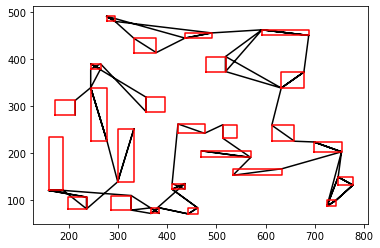

epoch:5, batch:1900/2500, reward:6357.869140625


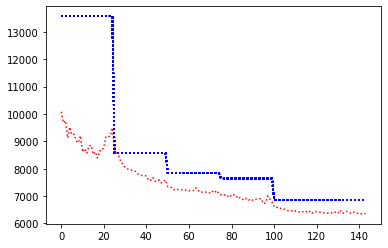

record the last path to gazebo for showing up


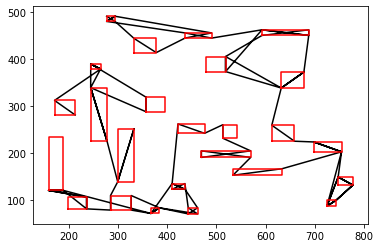

epoch:5, batch:2000/2500, reward:6374.8134765625


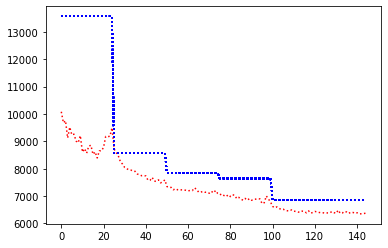

record the last path to gazebo for showing up


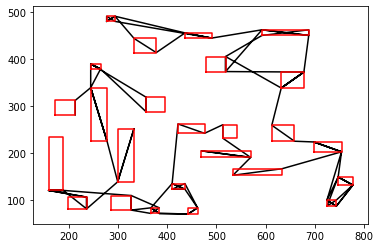

epoch:5, batch:2100/2500, reward:6357.982421875


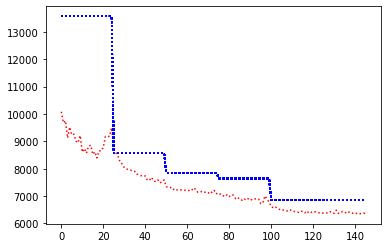

record the last path to gazebo for showing up


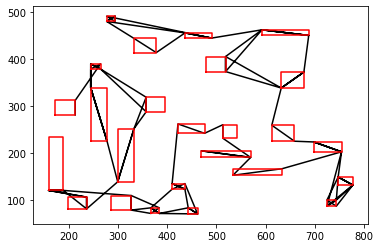

epoch:5, batch:2200/2500, reward:6365.12744140625


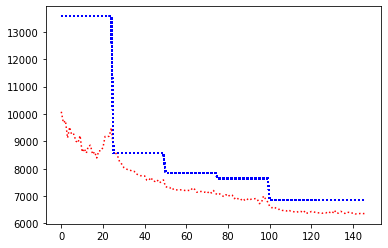

record the last path to gazebo for showing up


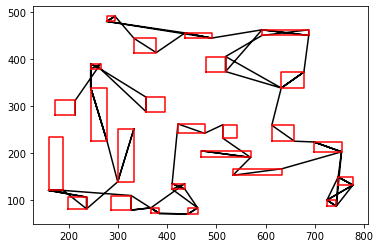

epoch:5, batch:2300/2500, reward:6396.55859375


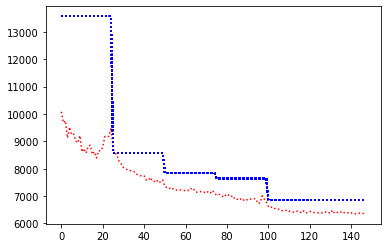

record the last path to gazebo for showing up


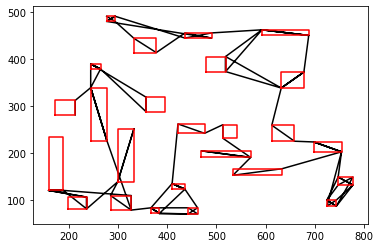

epoch:5, batch:2400/2500, reward:6323.9501953125


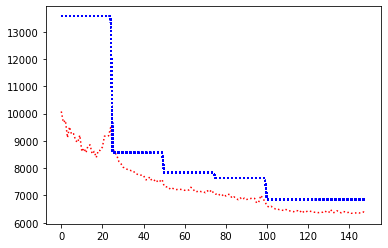

record the last path to gazebo for showing up


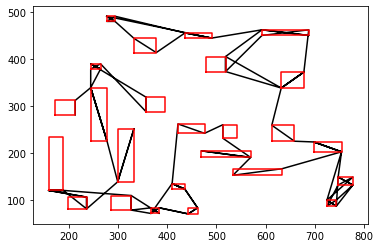

epoch:5, batch:2500/2500, reward:6347.42041015625


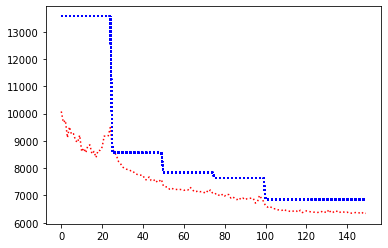

record the last path to gazebo for showing up


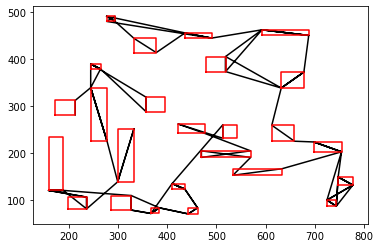

Avg Actor 6572.7587890625 --- Avg Critic 6853.646484375
My actor is going on the right road Hallelujah :) Updated
Epoch: 5, epoch time: 87.750min, tot time: 0.364day, L_actor: 6572.759, L_critic: 6853.646, update: True
Save Checkpoints
epoch:6, batch:100/2500, reward:6310.0283203125


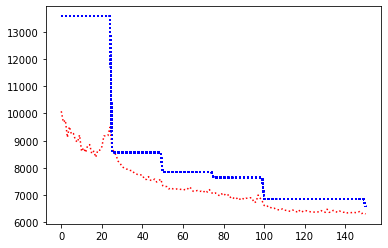

record the last path to gazebo for showing up


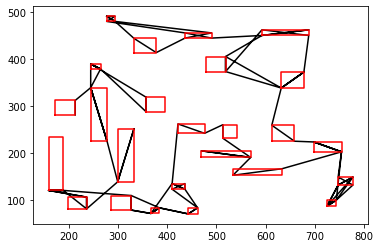

epoch:6, batch:200/2500, reward:6310.64599609375


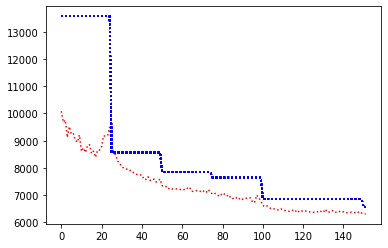

record the last path to gazebo for showing up


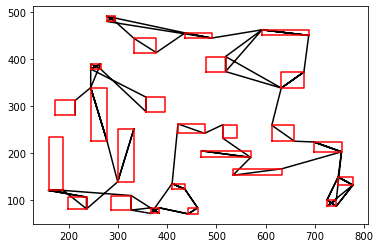

epoch:6, batch:300/2500, reward:6294.2294921875


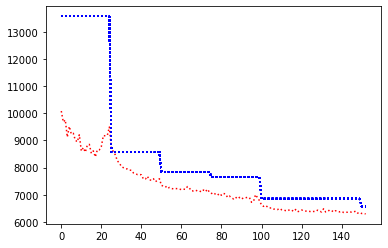

record the last path to gazebo for showing up


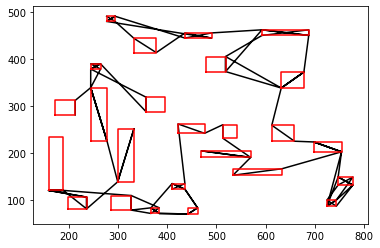

epoch:6, batch:400/2500, reward:6291.1396484375


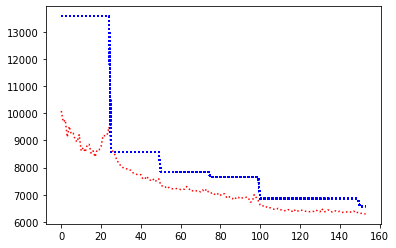

record the last path to gazebo for showing up


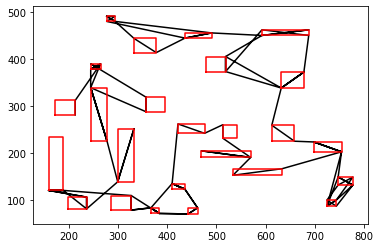

epoch:6, batch:500/2500, reward:6308.37646484375


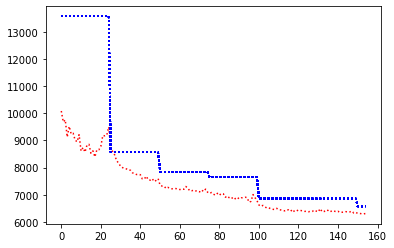

record the last path to gazebo for showing up


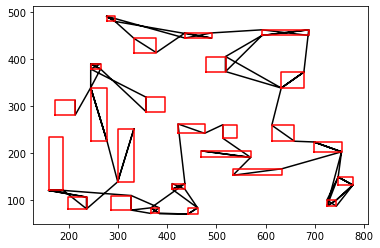

epoch:6, batch:600/2500, reward:6294.1865234375


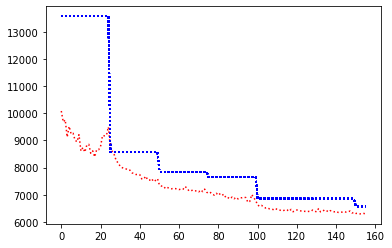

record the last path to gazebo for showing up


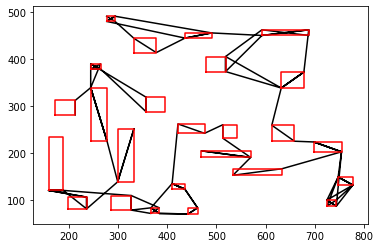

epoch:6, batch:700/2500, reward:6285.015625


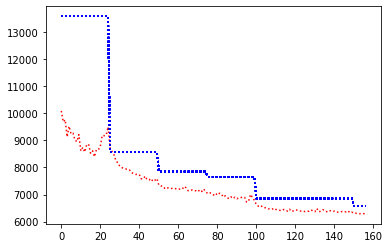

record the last path to gazebo for showing up


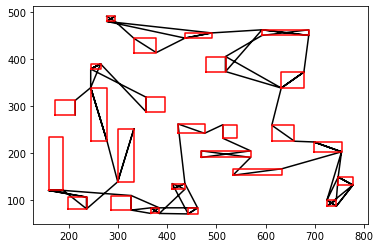

epoch:6, batch:800/2500, reward:6293.60009765625


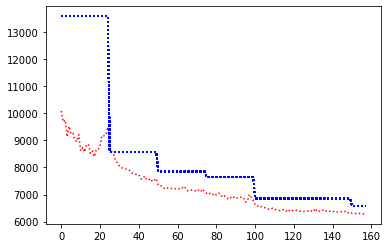

record the last path to gazebo for showing up


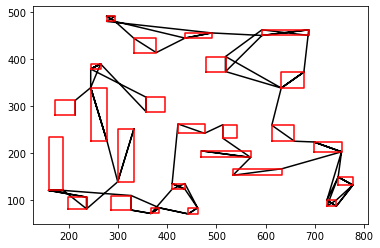

epoch:6, batch:900/2500, reward:6278.02197265625


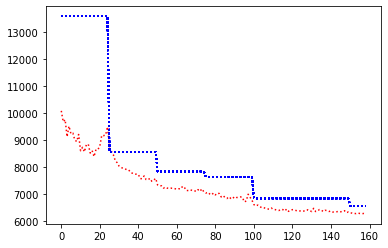

record the last path to gazebo for showing up


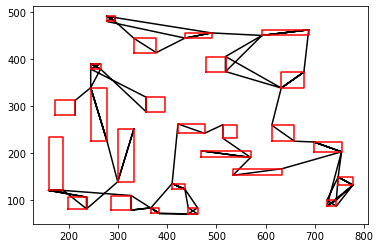

epoch:6, batch:1000/2500, reward:6287.44677734375


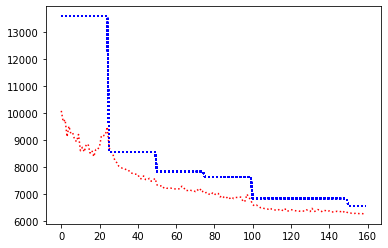

record the last path to gazebo for showing up


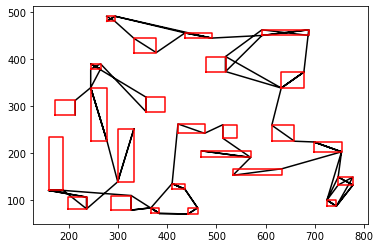

epoch:6, batch:1100/2500, reward:6292.38037109375


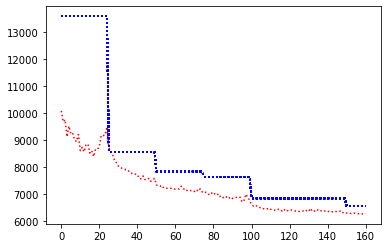

record the last path to gazebo for showing up


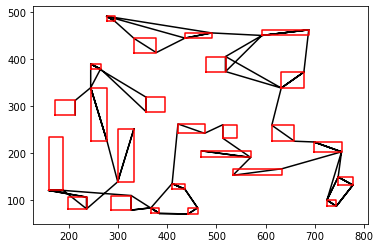

epoch:6, batch:1200/2500, reward:6290.5107421875


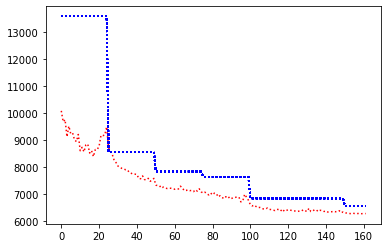

record the last path to gazebo for showing up


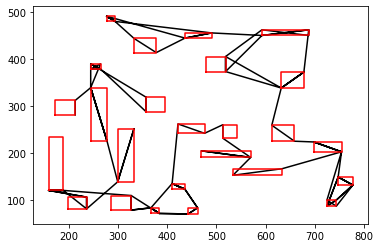

epoch:6, batch:1300/2500, reward:6273.87548828125


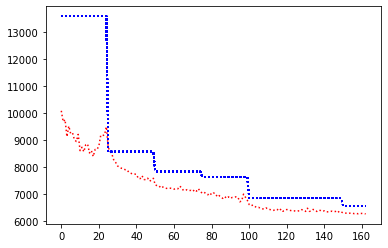

record the last path to gazebo for showing up


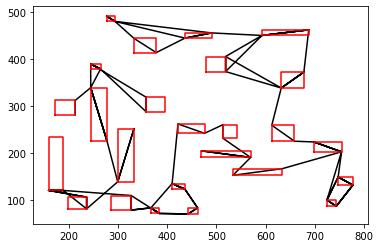

epoch:6, batch:1400/2500, reward:6304.45654296875


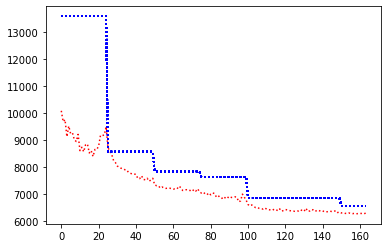

record the last path to gazebo for showing up


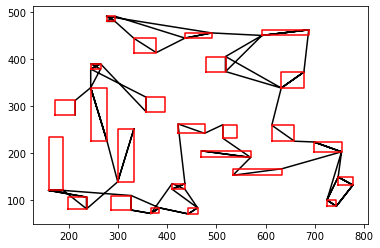

epoch:6, batch:1500/2500, reward:6289.4228515625


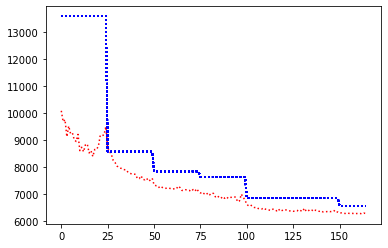

record the last path to gazebo for showing up


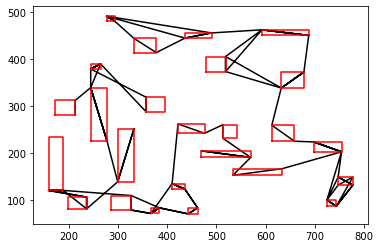

epoch:6, batch:1600/2500, reward:6280.0078125


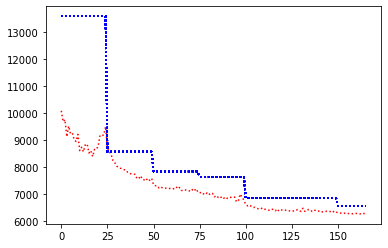

record the last path to gazebo for showing up


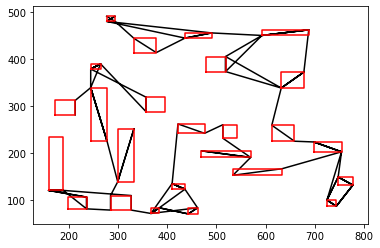

epoch:6, batch:1700/2500, reward:6316.04541015625


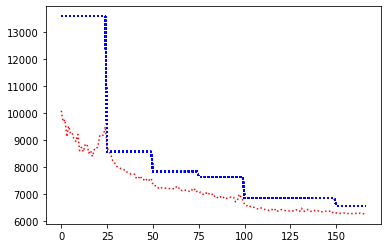

record the last path to gazebo for showing up


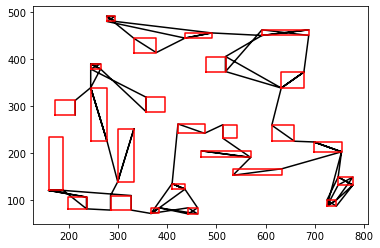

epoch:6, batch:1800/2500, reward:6321.6455078125


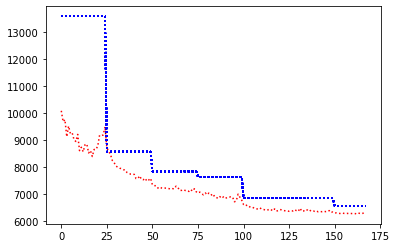

record the last path to gazebo for showing up


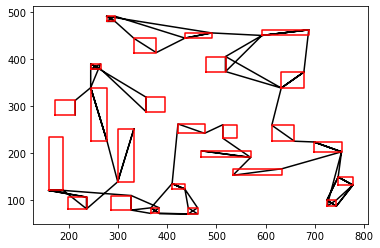

epoch:6, batch:1900/2500, reward:6285.2470703125


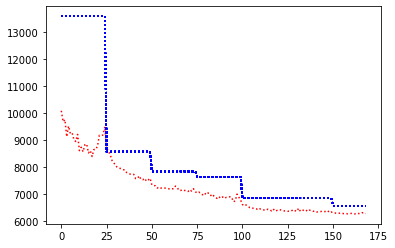

record the last path to gazebo for showing up


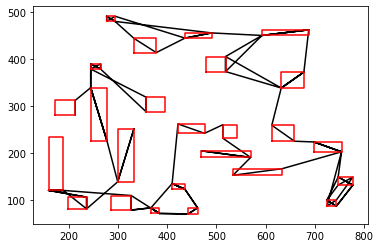

epoch:6, batch:2000/2500, reward:6288.4189453125


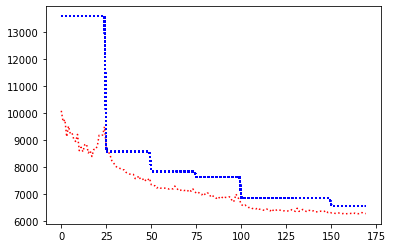

record the last path to gazebo for showing up


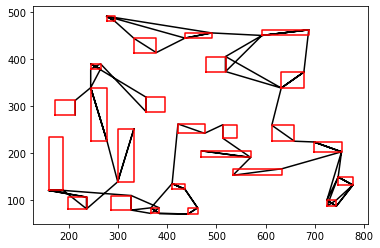

epoch:6, batch:2100/2500, reward:6281.53955078125


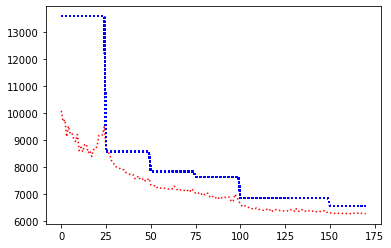

record the last path to gazebo for showing up


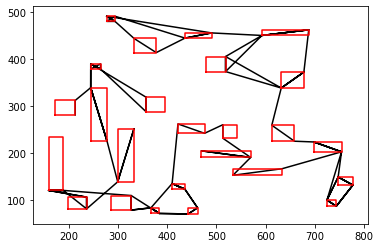

epoch:6, batch:2200/2500, reward:6288.17333984375


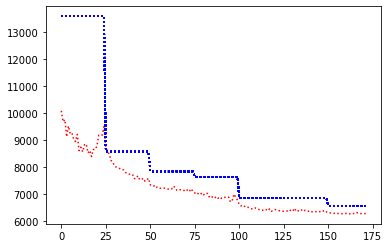

record the last path to gazebo for showing up


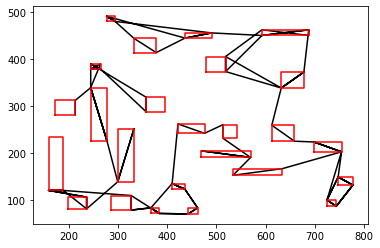

epoch:6, batch:2300/2500, reward:6271.2646484375


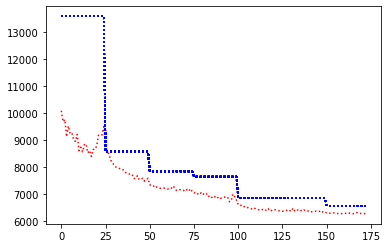

record the last path to gazebo for showing up


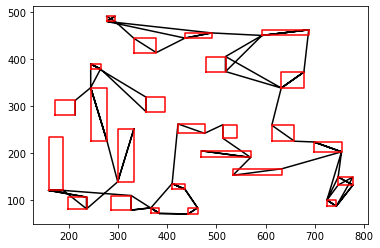

epoch:6, batch:2400/2500, reward:6289.884765625


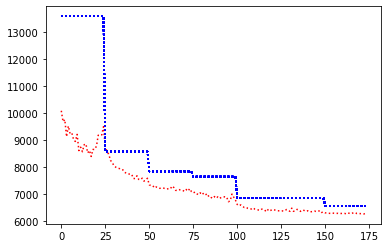

record the last path to gazebo for showing up


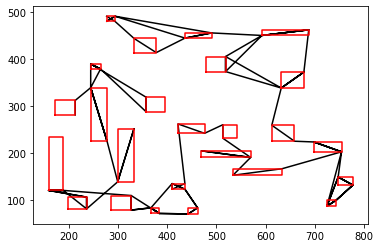

epoch:6, batch:2500/2500, reward:6271.63037109375


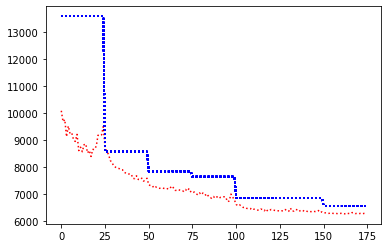

record the last path to gazebo for showing up


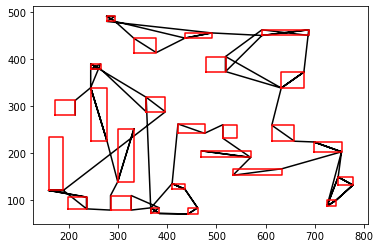

Avg Actor 10905.35546875 --- Avg Critic 6572.7587890625
Epoch: 6, epoch time: 87.770min, tot time: 0.426day, L_actor: 10905.355, L_critic: 6572.759, update: False
Save Checkpoints
epoch:7, batch:100/2500, reward:6264.3984375


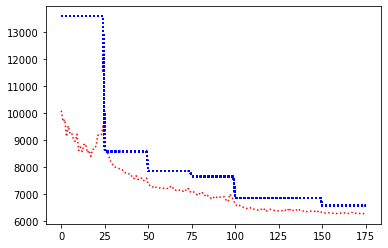

record the last path to gazebo for showing up


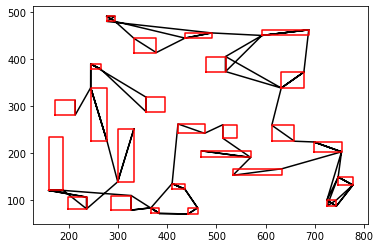

epoch:7, batch:200/2500, reward:6269.10888671875


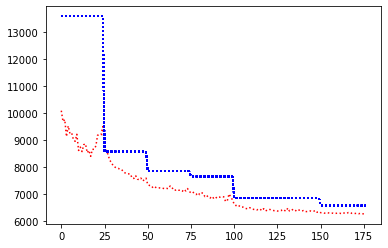

record the last path to gazebo for showing up


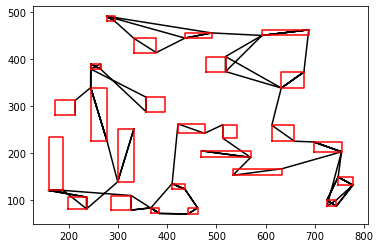

epoch:7, batch:300/2500, reward:6257.55908203125


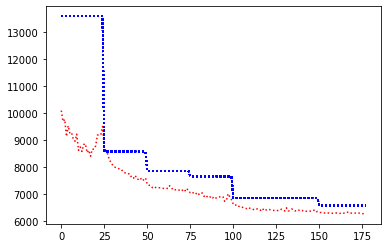

record the last path to gazebo for showing up


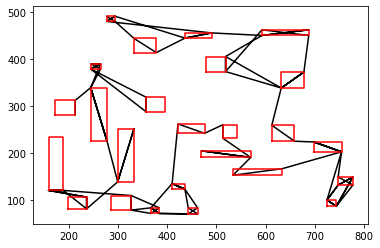

epoch:7, batch:400/2500, reward:6269.63232421875


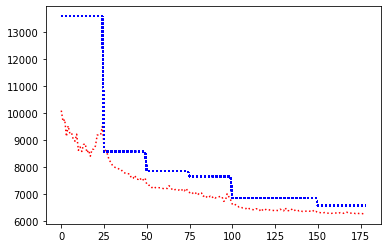

record the last path to gazebo for showing up


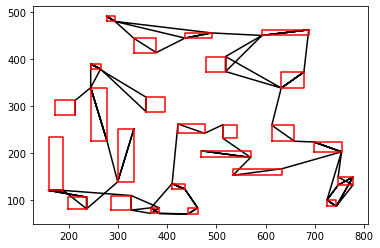

epoch:7, batch:500/2500, reward:6286.626953125


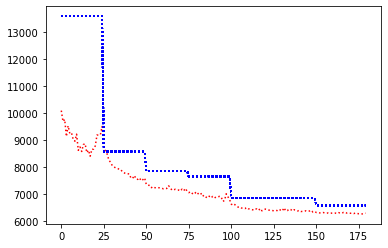

record the last path to gazebo for showing up


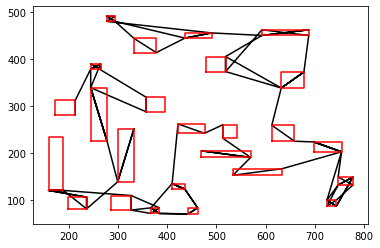

epoch:7, batch:600/2500, reward:6281.998046875


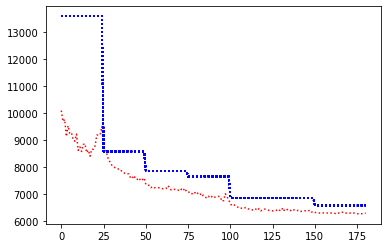

record the last path to gazebo for showing up


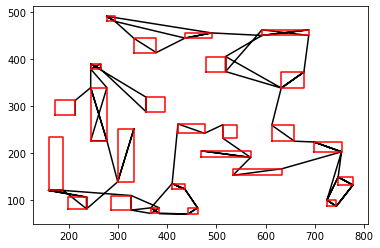

epoch:7, batch:700/2500, reward:6281.8642578125


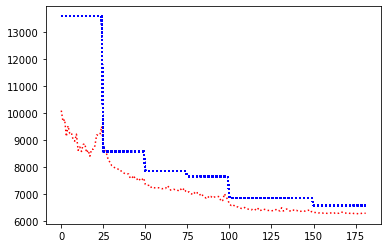

record the last path to gazebo for showing up


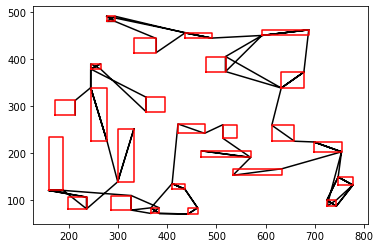

epoch:7, batch:800/2500, reward:6260.02197265625


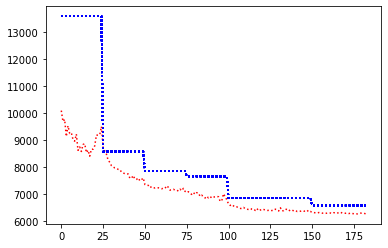

record the last path to gazebo for showing up


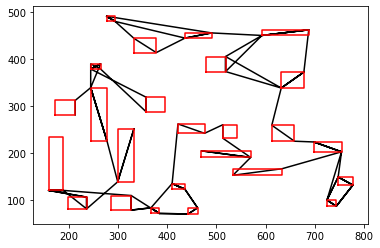

epoch:7, batch:900/2500, reward:6297.26171875


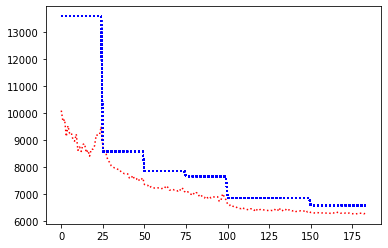

record the last path to gazebo for showing up


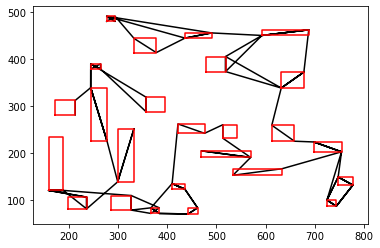

epoch:7, batch:1000/2500, reward:6286.150390625


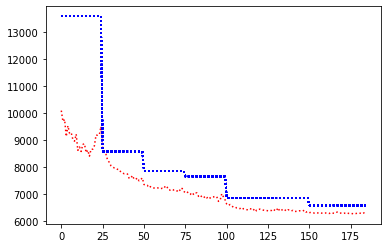

record the last path to gazebo for showing up


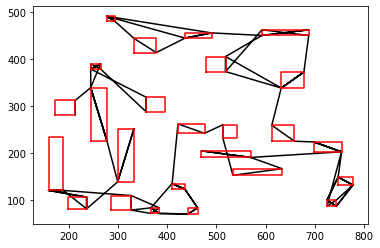

epoch:7, batch:1100/2500, reward:6285.1201171875


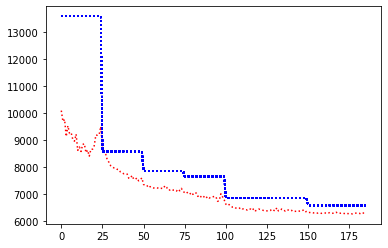

record the last path to gazebo for showing up


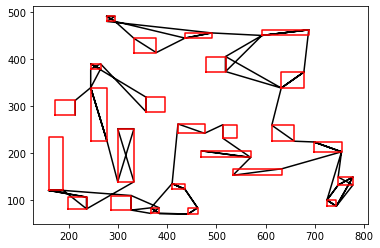

epoch:7, batch:1200/2500, reward:6329.234375


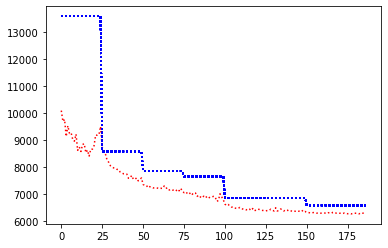

record the last path to gazebo for showing up


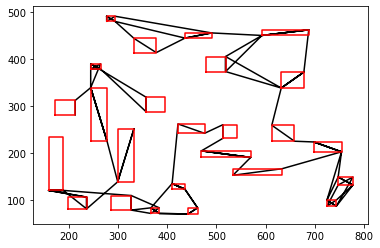

epoch:7, batch:1300/2500, reward:6295.048828125


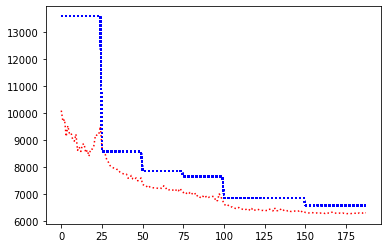

record the last path to gazebo for showing up


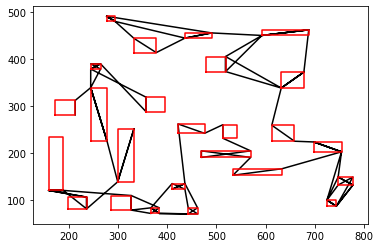

epoch:7, batch:1400/2500, reward:6266.96826171875


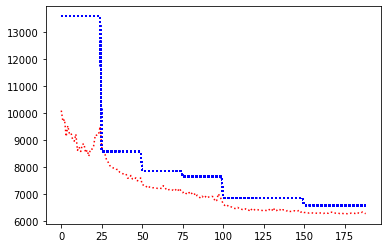

record the last path to gazebo for showing up


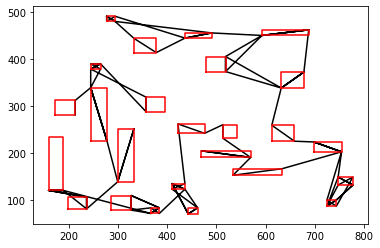

epoch:7, batch:1500/2500, reward:6286.4140625


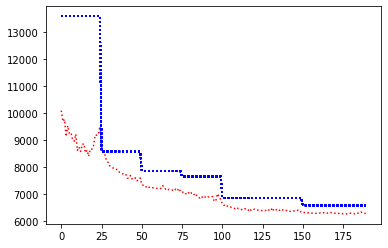

record the last path to gazebo for showing up


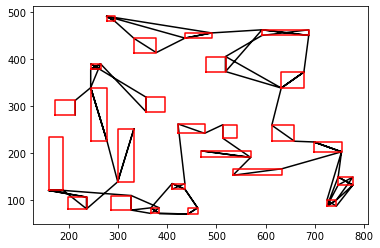

epoch:7, batch:1600/2500, reward:6288.27734375


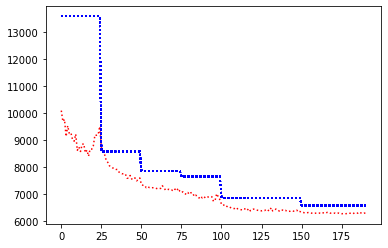

record the last path to gazebo for showing up


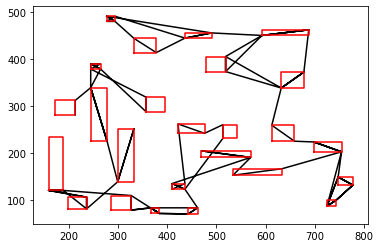

epoch:7, batch:1700/2500, reward:6283.3916015625


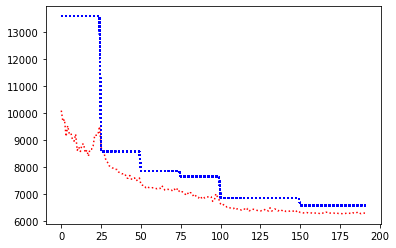

record the last path to gazebo for showing up


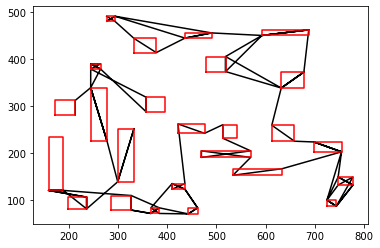

epoch:7, batch:1800/2500, reward:6262.4443359375


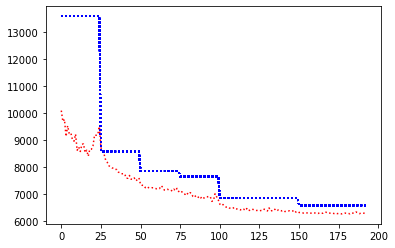

record the last path to gazebo for showing up


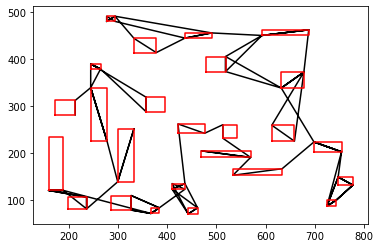

epoch:7, batch:1900/2500, reward:6264.93359375


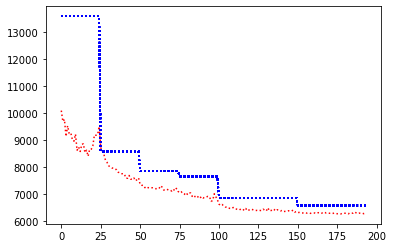

record the last path to gazebo for showing up


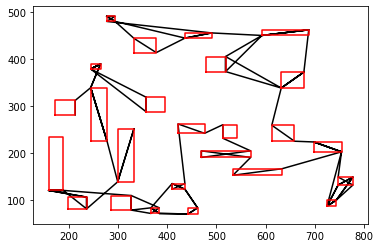

epoch:7, batch:2000/2500, reward:6290.0244140625


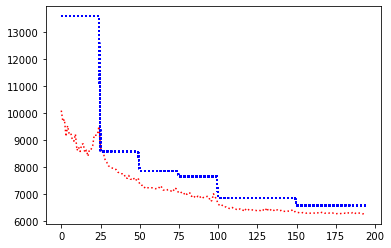

record the last path to gazebo for showing up


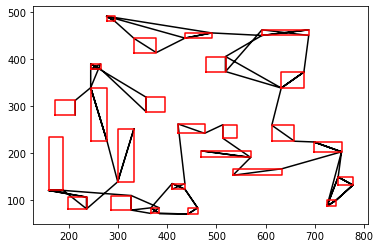

epoch:7, batch:2100/2500, reward:6344.16748046875


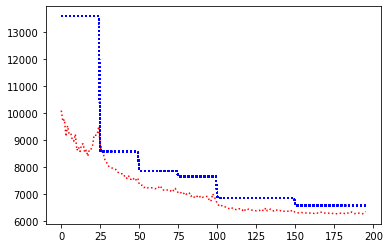

record the last path to gazebo for showing up


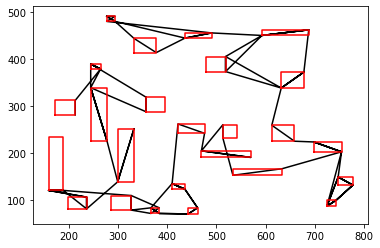

epoch:7, batch:2200/2500, reward:6328.94140625


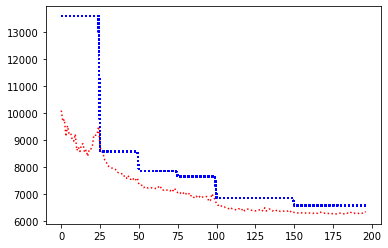

record the last path to gazebo for showing up


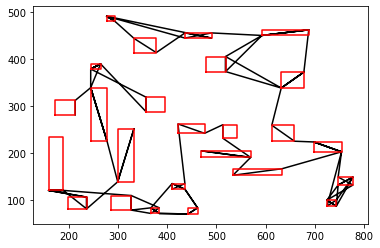

epoch:7, batch:2300/2500, reward:6280.12255859375


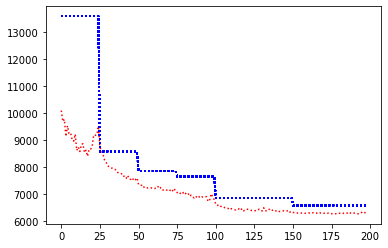

record the last path to gazebo for showing up


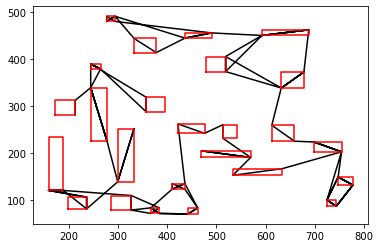

epoch:7, batch:2400/2500, reward:6281.33251953125


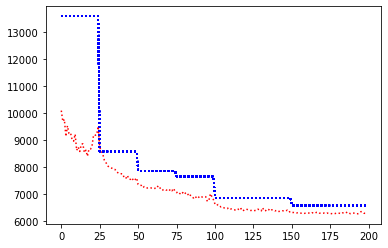

record the last path to gazebo for showing up


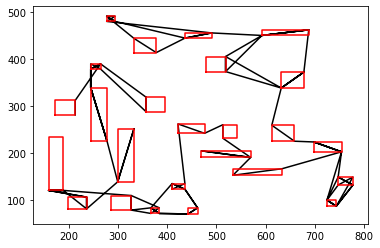

epoch:7, batch:2500/2500, reward:6266.3935546875


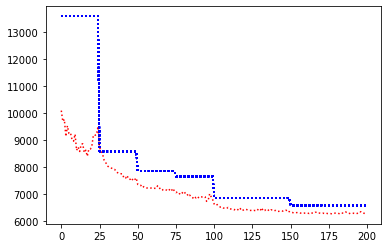

record the last path to gazebo for showing up


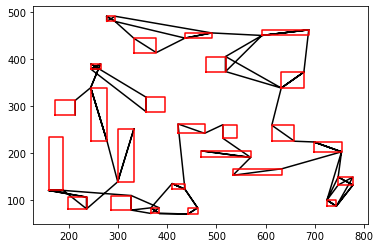

Avg Actor 12627.8193359375 --- Avg Critic 6572.7587890625
Epoch: 7, epoch time: 86.711min, tot time: 0.486day, L_actor: 12627.819, L_critic: 6572.759, update: False
Save Checkpoints
epoch:8, batch:100/2500, reward:6277.22802734375


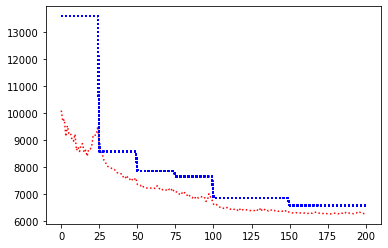

record the last path to gazebo for showing up


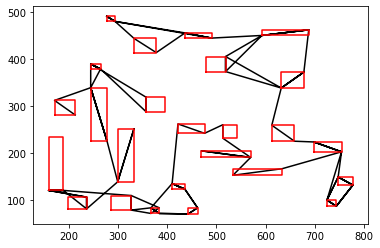

epoch:8, batch:200/2500, reward:6301.87451171875


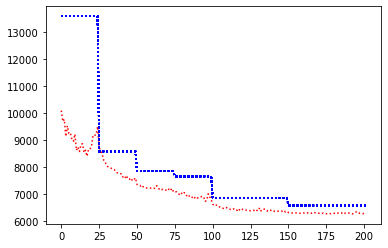

record the last path to gazebo for showing up


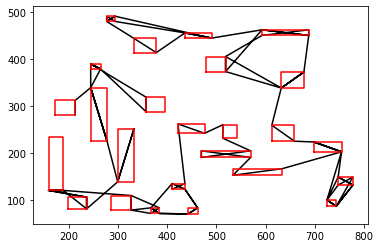

epoch:8, batch:300/2500, reward:6269.283203125


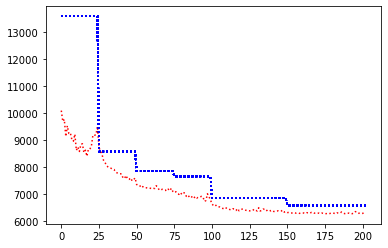

record the last path to gazebo for showing up


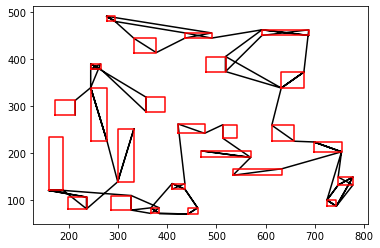

epoch:8, batch:400/2500, reward:6273.13623046875


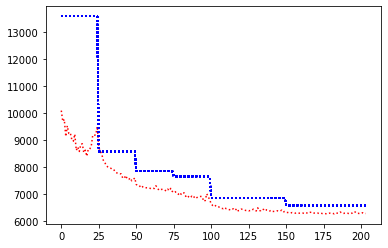

record the last path to gazebo for showing up


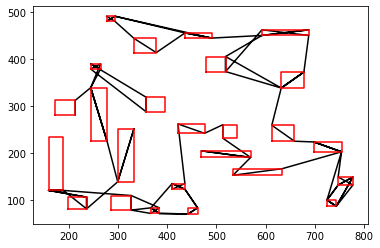

epoch:8, batch:500/2500, reward:6265.31884765625


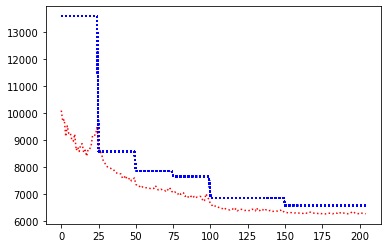

record the last path to gazebo for showing up


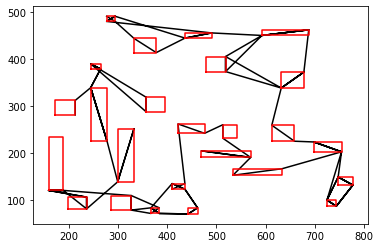

epoch:8, batch:600/2500, reward:6248.435546875


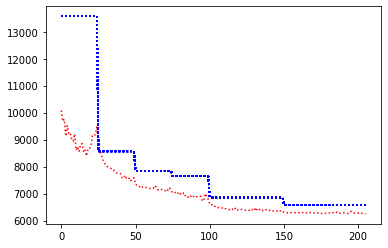

record the last path to gazebo for showing up


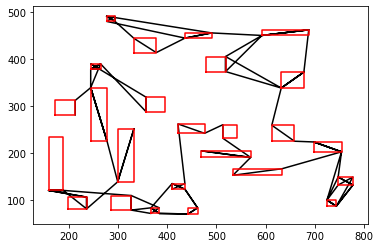

epoch:8, batch:700/2500, reward:6238.73828125


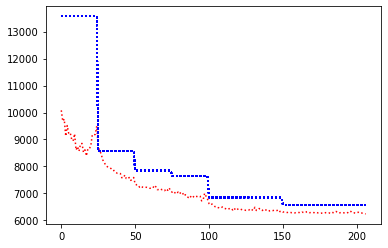

record the last path to gazebo for showing up


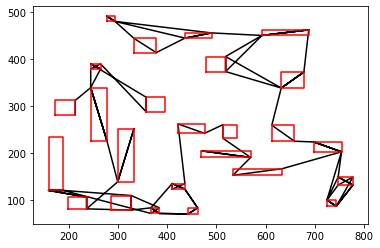

epoch:8, batch:800/2500, reward:6267.0771484375


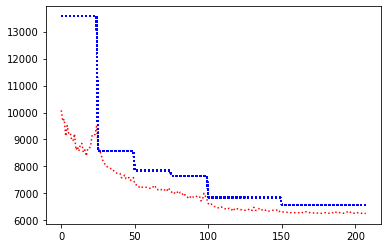

record the last path to gazebo for showing up


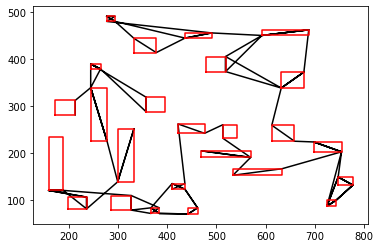

epoch:8, batch:900/2500, reward:6253.47216796875


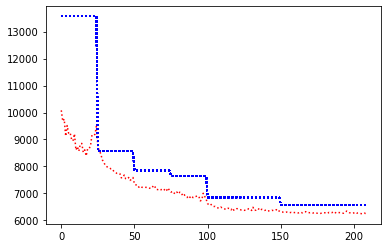

record the last path to gazebo for showing up


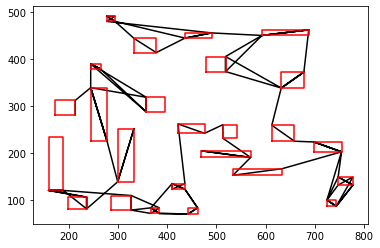

epoch:8, batch:1000/2500, reward:6259.5908203125


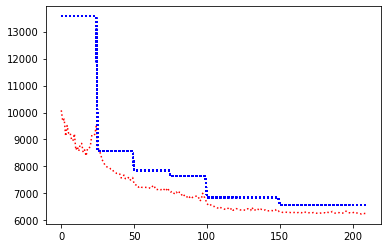

record the last path to gazebo for showing up


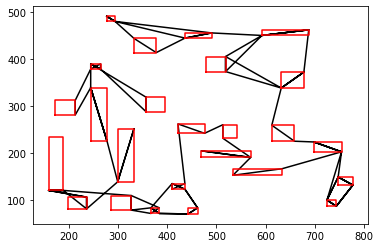

epoch:8, batch:1100/2500, reward:6251.5732421875


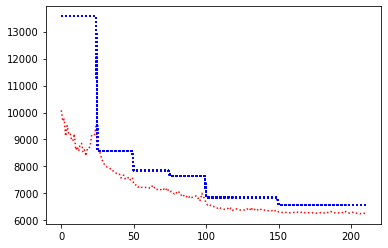

record the last path to gazebo for showing up


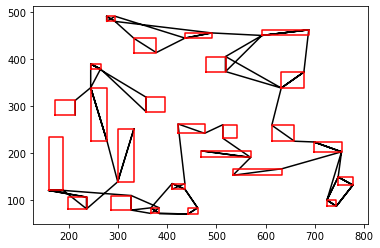

epoch:8, batch:1200/2500, reward:6258.09228515625


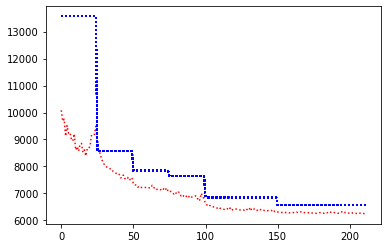

record the last path to gazebo for showing up


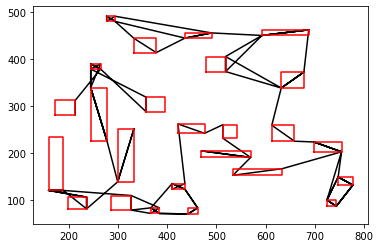

epoch:8, batch:1300/2500, reward:6258.90673828125


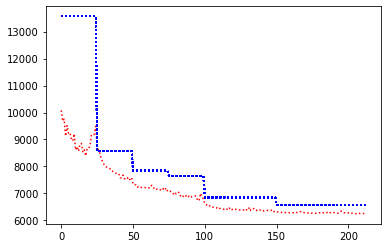

record the last path to gazebo for showing up


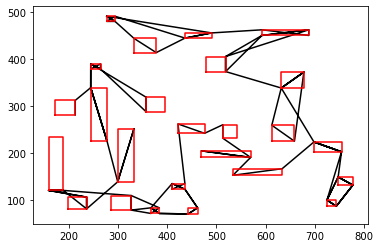

epoch:8, batch:1400/2500, reward:6264.56005859375


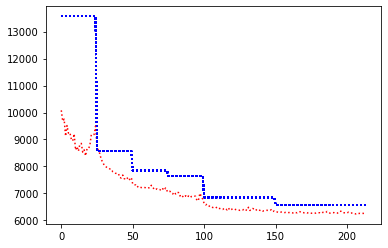

record the last path to gazebo for showing up


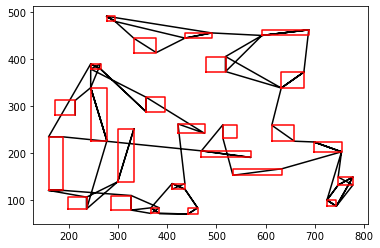

epoch:8, batch:1500/2500, reward:6266.44140625


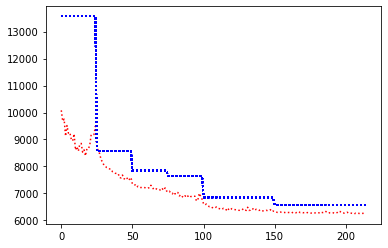

record the last path to gazebo for showing up


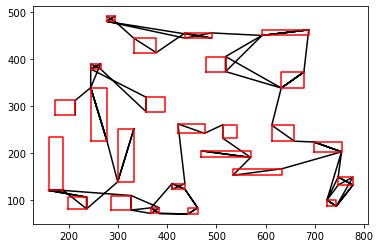

epoch:8, batch:1600/2500, reward:6256.87890625


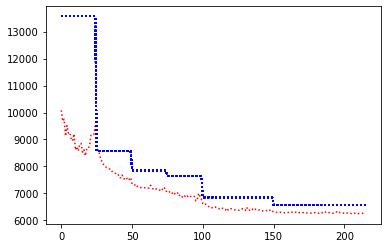

record the last path to gazebo for showing up


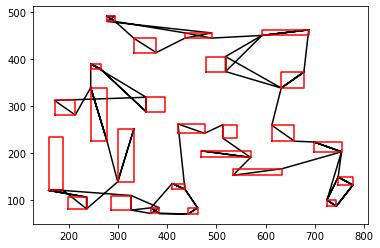

epoch:8, batch:1700/2500, reward:6275.318359375


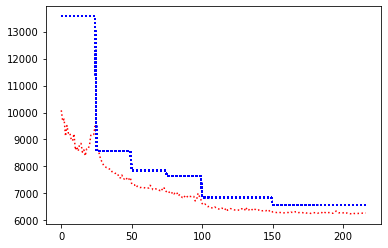

record the last path to gazebo for showing up


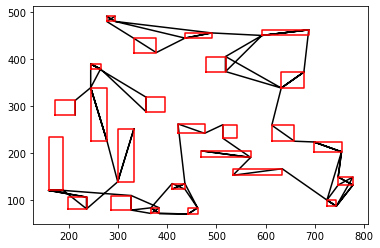

epoch:8, batch:1800/2500, reward:6244.31201171875


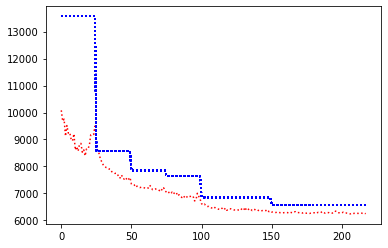

record the last path to gazebo for showing up


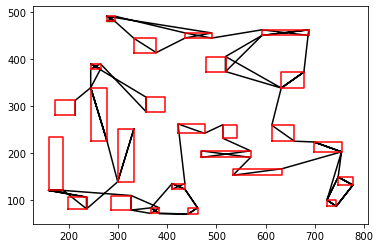

epoch:8, batch:1900/2500, reward:6251.6318359375


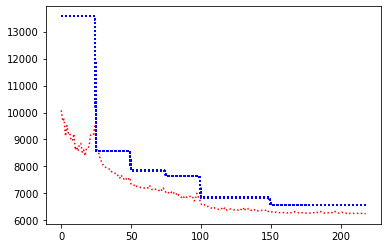

record the last path to gazebo for showing up


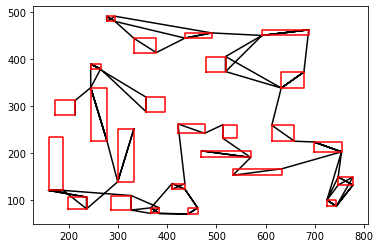

epoch:8, batch:2000/2500, reward:6253.7158203125


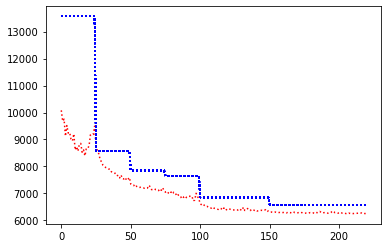

record the last path to gazebo for showing up


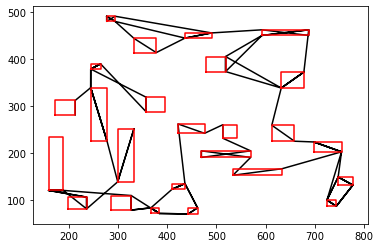

epoch:8, batch:2100/2500, reward:6256.123046875


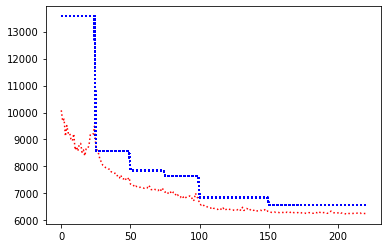

record the last path to gazebo for showing up


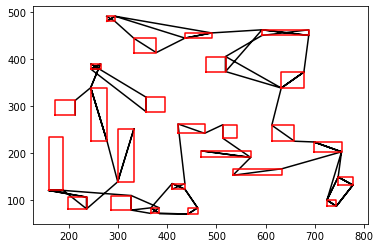

epoch:8, batch:2200/2500, reward:6275.29345703125


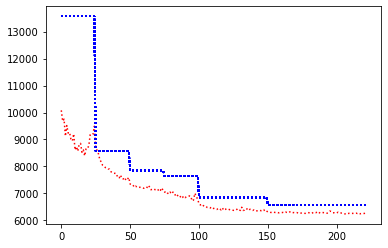

record the last path to gazebo for showing up


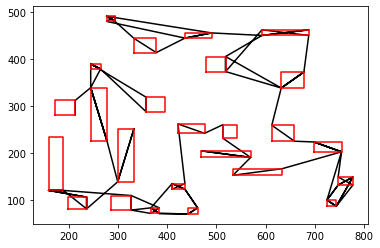

epoch:8, batch:2300/2500, reward:6238.982421875


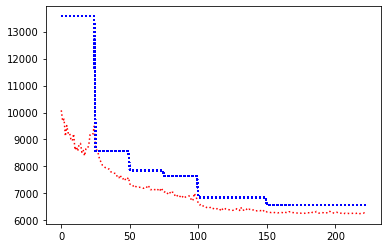

record the last path to gazebo for showing up


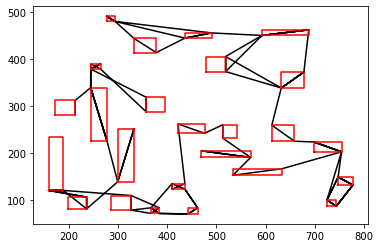

epoch:8, batch:2400/2500, reward:6252.8203125


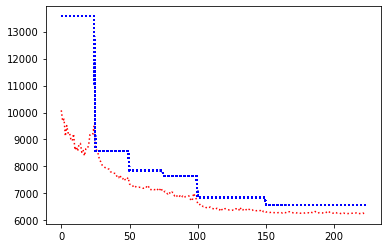

record the last path to gazebo for showing up


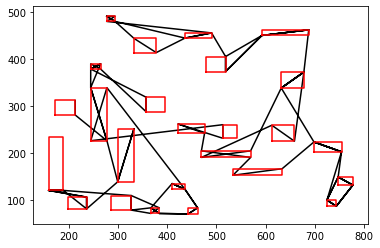

epoch:8, batch:2500/2500, reward:6306.3330078125


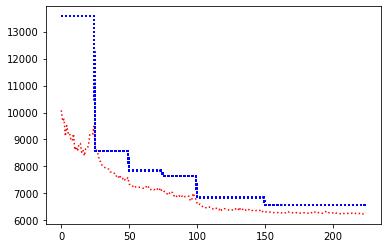

record the last path to gazebo for showing up


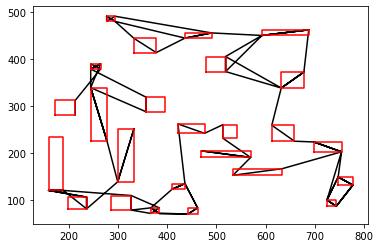

Avg Actor 12661.65234375 --- Avg Critic 6572.7587890625
Epoch: 8, epoch time: 87.215min, tot time: 0.547day, L_actor: 12661.652, L_critic: 6572.759, update: False
Save Checkpoints
epoch:9, batch:100/2500, reward:6257.27001953125


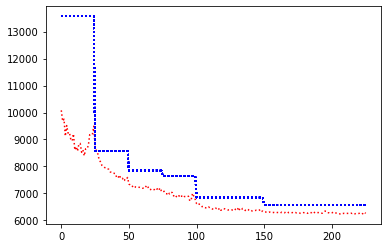

record the last path to gazebo for showing up


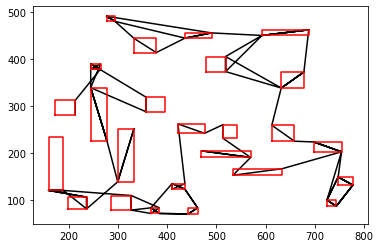

epoch:9, batch:200/2500, reward:6264.15576171875


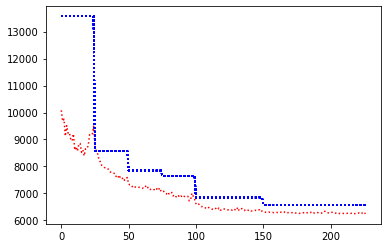

record the last path to gazebo for showing up


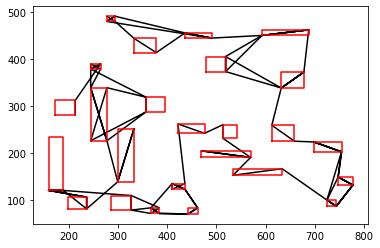

epoch:9, batch:300/2500, reward:6265.46533203125


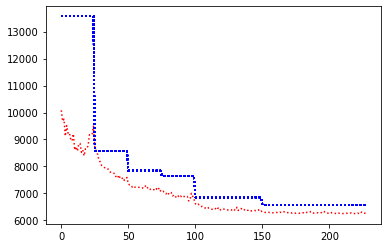

record the last path to gazebo for showing up


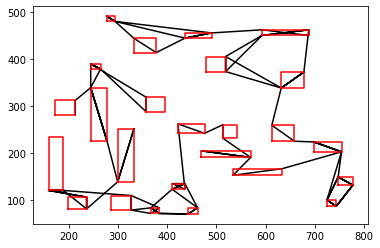

epoch:9, batch:400/2500, reward:6291.025390625


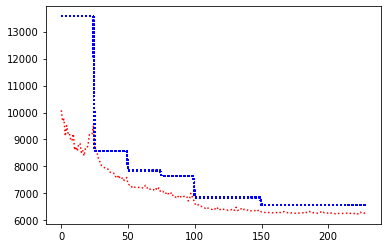

record the last path to gazebo for showing up


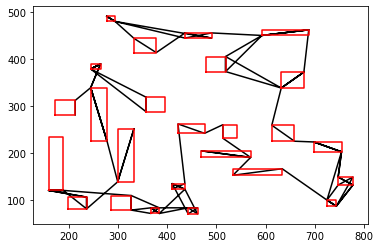

epoch:9, batch:500/2500, reward:6362.52734375


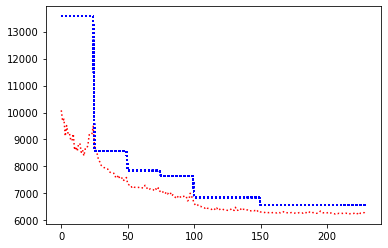

record the last path to gazebo for showing up


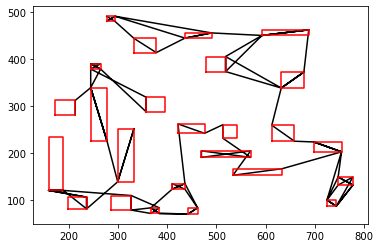

epoch:9, batch:600/2500, reward:6247.2216796875


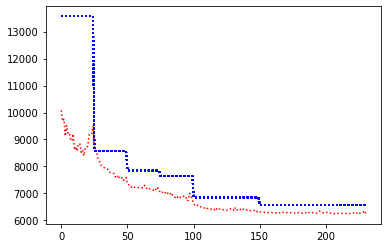

record the last path to gazebo for showing up


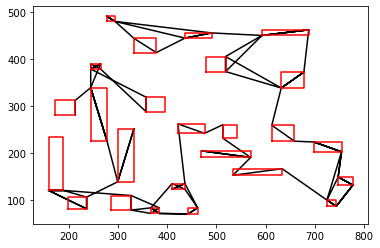

epoch:9, batch:700/2500, reward:6266.65478515625


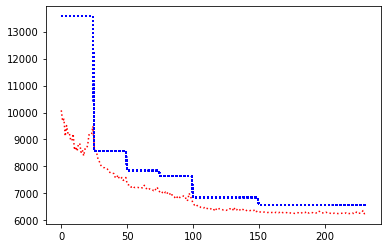

record the last path to gazebo for showing up


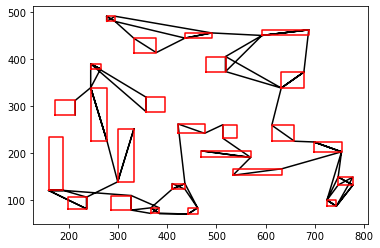

epoch:9, batch:800/2500, reward:6263.5732421875


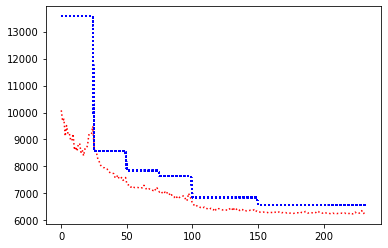

record the last path to gazebo for showing up


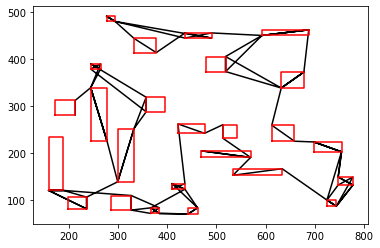

epoch:9, batch:900/2500, reward:6247.4287109375


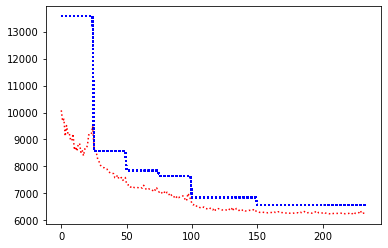

record the last path to gazebo for showing up


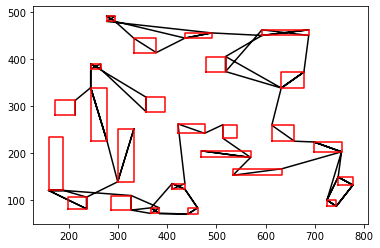

epoch:9, batch:1000/2500, reward:6271.80078125


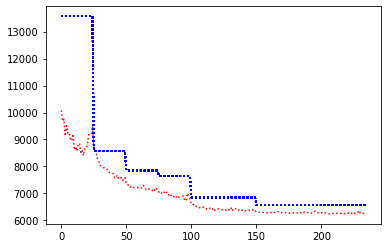

record the last path to gazebo for showing up


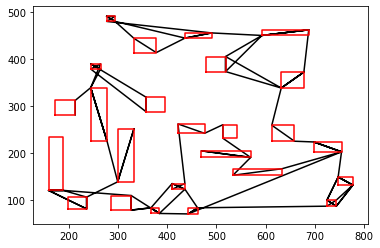

epoch:9, batch:1100/2500, reward:6269.326171875


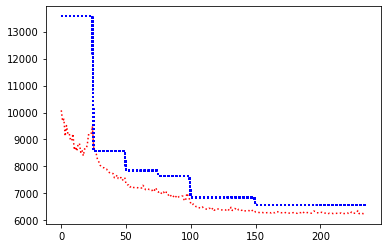

record the last path to gazebo for showing up


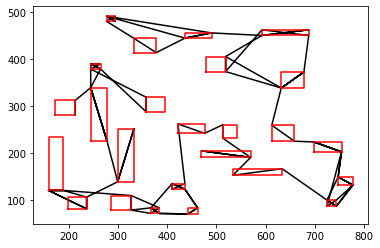

epoch:9, batch:1200/2500, reward:6254.0029296875


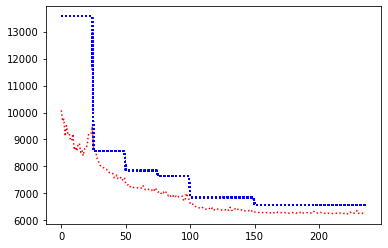

record the last path to gazebo for showing up


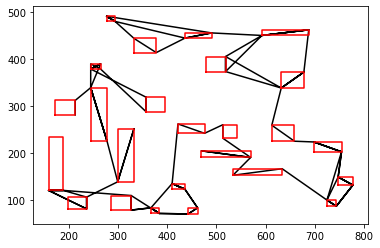

epoch:9, batch:1300/2500, reward:6259.5390625


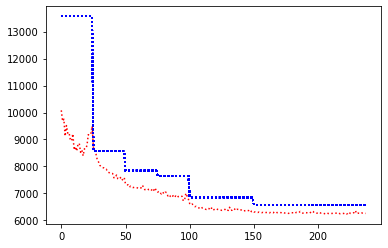

record the last path to gazebo for showing up


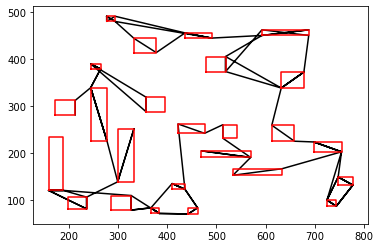

epoch:9, batch:1400/2500, reward:6241.38525390625


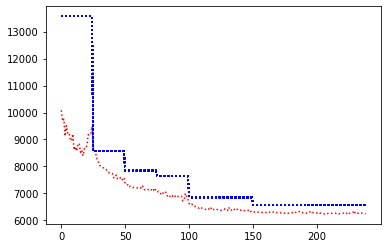

record the last path to gazebo for showing up


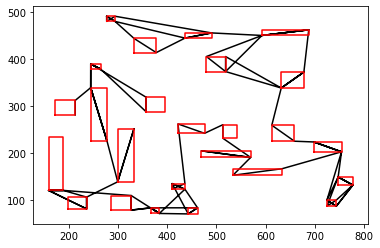

epoch:9, batch:1500/2500, reward:6267.5390625


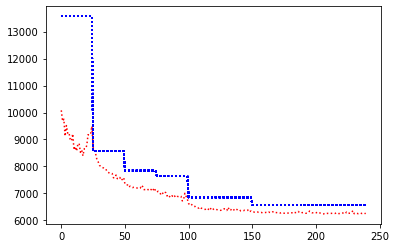

record the last path to gazebo for showing up


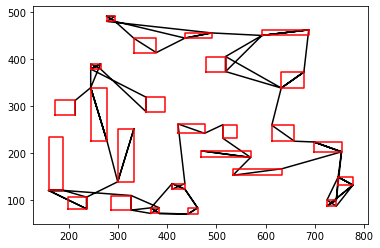

epoch:9, batch:1600/2500, reward:6234.1572265625


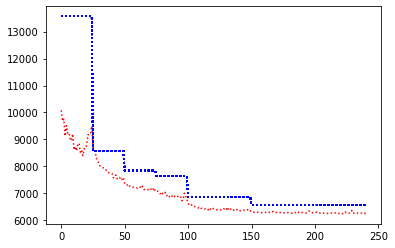

record the last path to gazebo for showing up


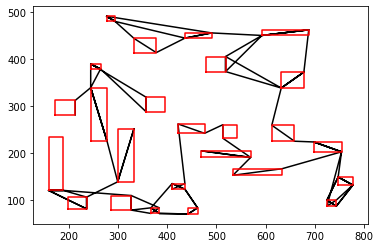

epoch:9, batch:1700/2500, reward:6248.8662109375


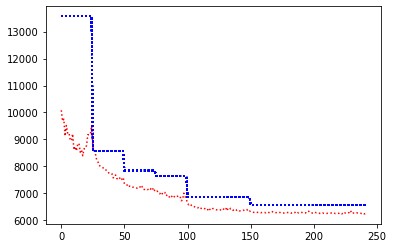

record the last path to gazebo for showing up


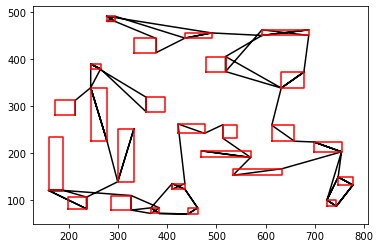

epoch:9, batch:1800/2500, reward:6227.662109375


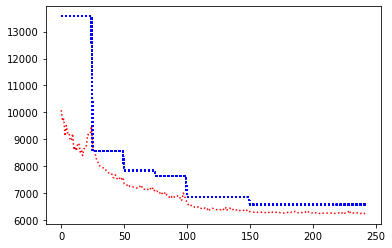

record the last path to gazebo for showing up


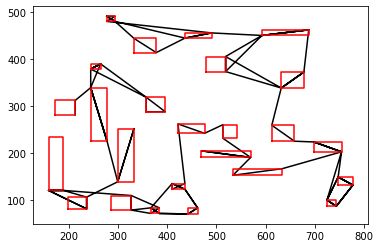

epoch:9, batch:1900/2500, reward:6260.9287109375


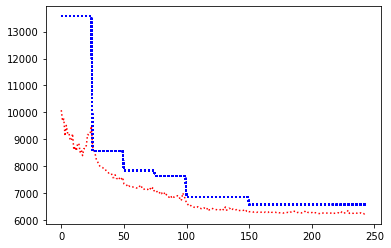

record the last path to gazebo for showing up


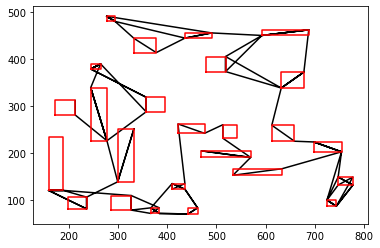

epoch:9, batch:2000/2500, reward:6268.06494140625


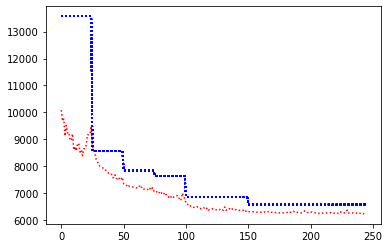

record the last path to gazebo for showing up


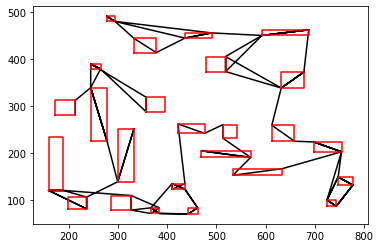

epoch:9, batch:2100/2500, reward:6224.9208984375


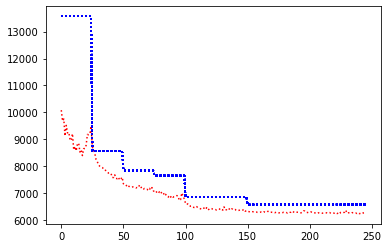

record the last path to gazebo for showing up


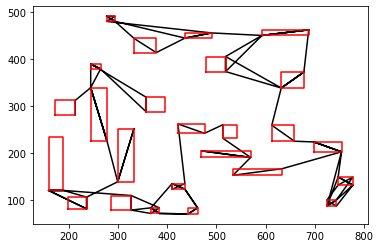

epoch:9, batch:2200/2500, reward:6269.71435546875


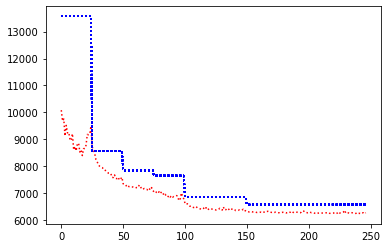

record the last path to gazebo for showing up


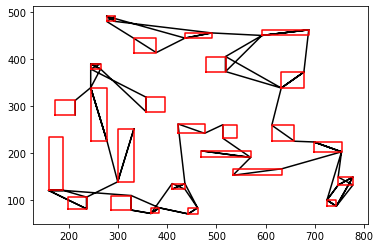

epoch:9, batch:2300/2500, reward:6254.455078125


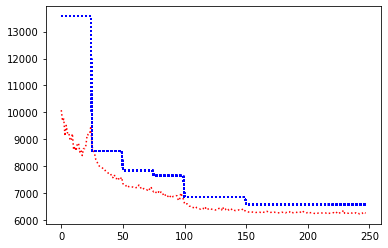

record the last path to gazebo for showing up


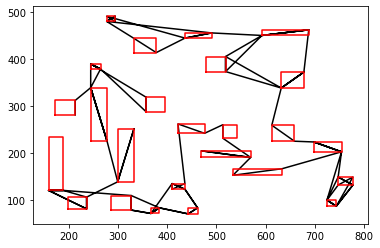

epoch:9, batch:2400/2500, reward:6290.333984375


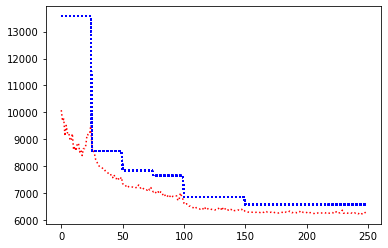

record the last path to gazebo for showing up


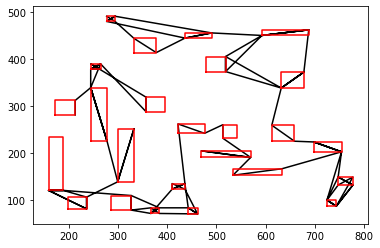

epoch:9, batch:2500/2500, reward:6260.5732421875


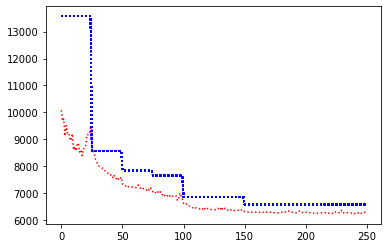

record the last path to gazebo for showing up


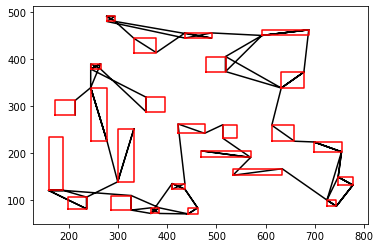

Avg Actor 6867.50341796875 --- Avg Critic 6572.7587890625
Epoch: 9, epoch time: 86.742min, tot time: 0.608day, L_actor: 6867.503, L_critic: 6572.759, update: False
Save Checkpoints
epoch:10, batch:100/2500, reward:6236.6923828125


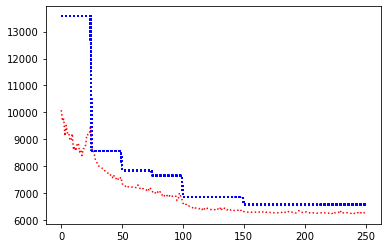

record the last path to gazebo for showing up


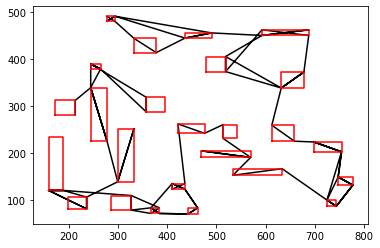

epoch:10, batch:200/2500, reward:6233.4384765625


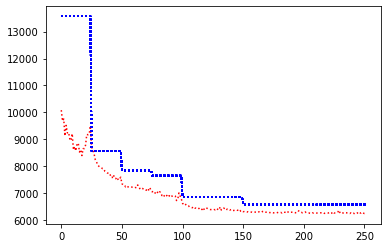

record the last path to gazebo for showing up


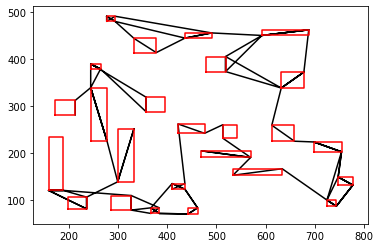

epoch:10, batch:300/2500, reward:6250.5517578125


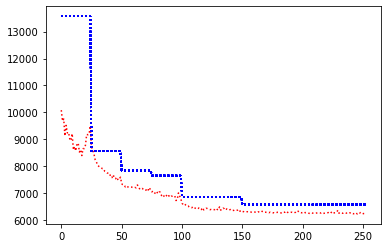

record the last path to gazebo for showing up


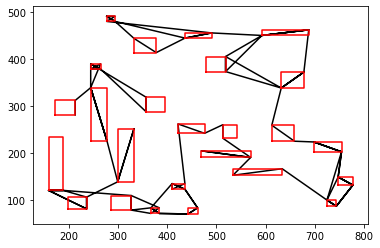

epoch:10, batch:400/2500, reward:6259.890625


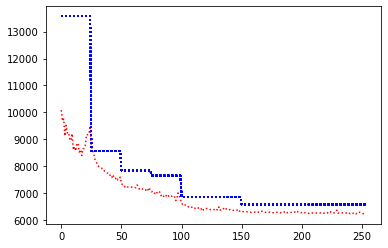

record the last path to gazebo for showing up


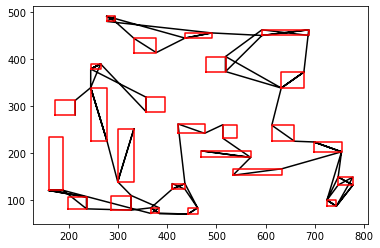

epoch:10, batch:500/2500, reward:6284.0810546875


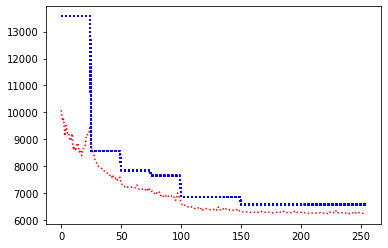

record the last path to gazebo for showing up


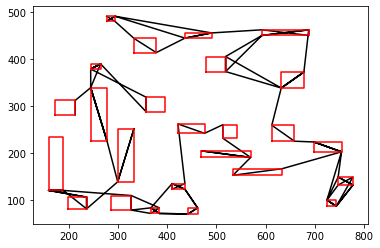

epoch:10, batch:600/2500, reward:6247.509765625


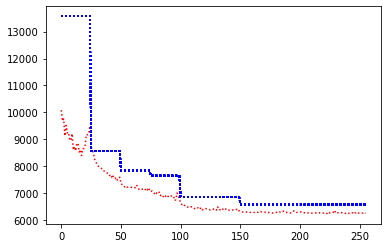

record the last path to gazebo for showing up


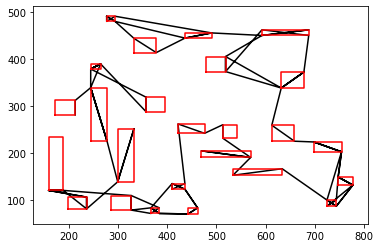

epoch:10, batch:700/2500, reward:6236.9560546875


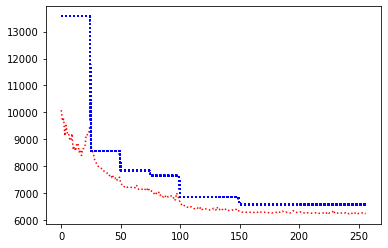

record the last path to gazebo for showing up


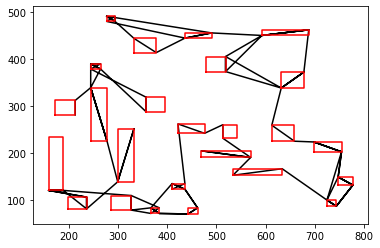

epoch:10, batch:800/2500, reward:6219.99755859375


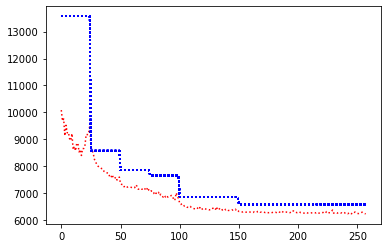

record the last path to gazebo for showing up


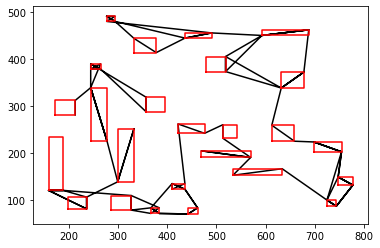

epoch:10, batch:900/2500, reward:6243.0244140625


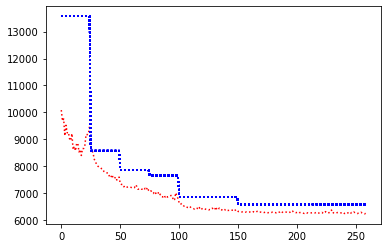

record the last path to gazebo for showing up


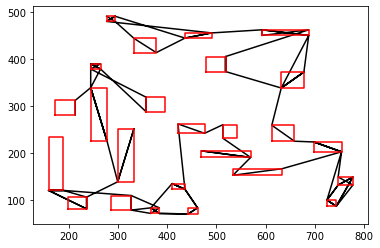

epoch:10, batch:1000/2500, reward:6217.88232421875


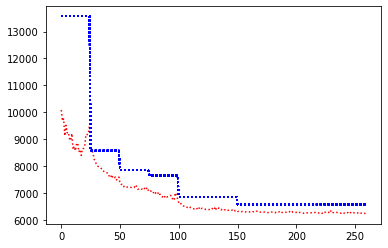

record the last path to gazebo for showing up


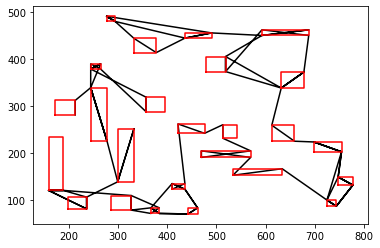

epoch:10, batch:1100/2500, reward:6234.08740234375


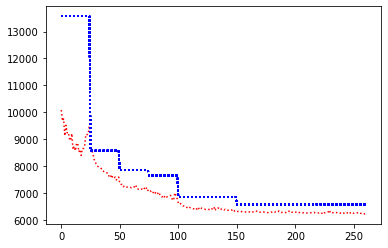

record the last path to gazebo for showing up


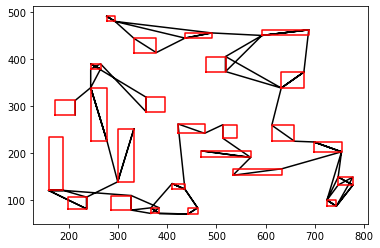

epoch:10, batch:1200/2500, reward:6231.59765625


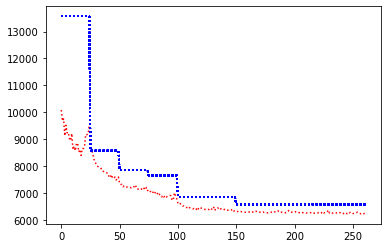

record the last path to gazebo for showing up


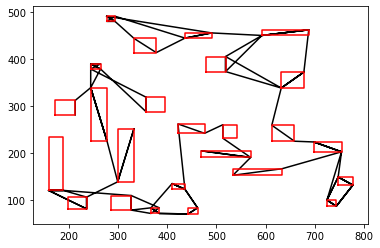

epoch:10, batch:1300/2500, reward:6231.595703125


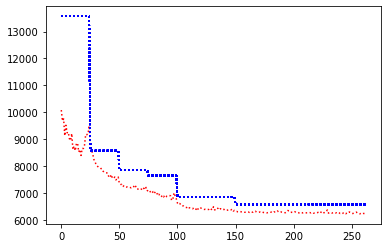

record the last path to gazebo for showing up


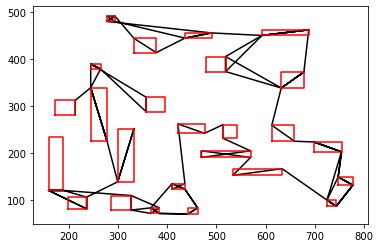

epoch:10, batch:1400/2500, reward:6236.03125


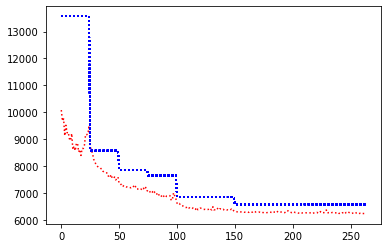

record the last path to gazebo for showing up


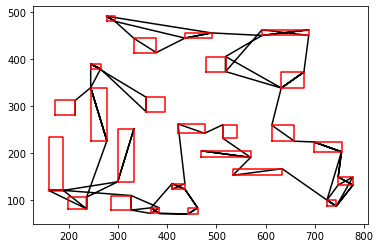

epoch:10, batch:1500/2500, reward:6236.330078125


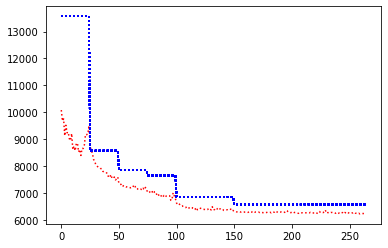

record the last path to gazebo for showing up


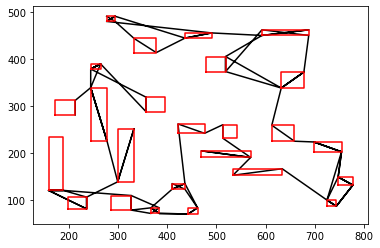

epoch:10, batch:1600/2500, reward:6231.55517578125


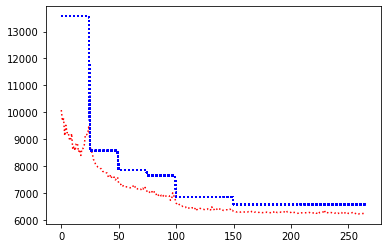

record the last path to gazebo for showing up


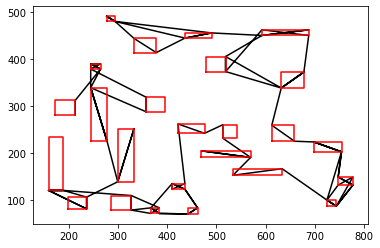

epoch:10, batch:1700/2500, reward:6228.51318359375


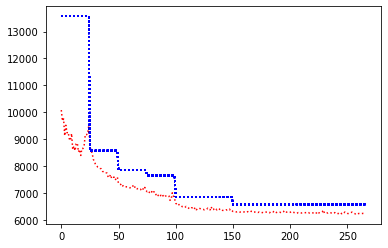

record the last path to gazebo for showing up


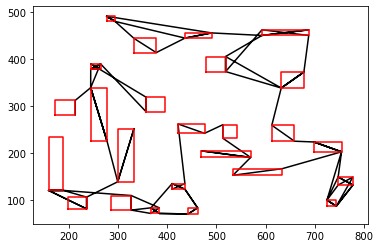

epoch:10, batch:1800/2500, reward:6256.92333984375


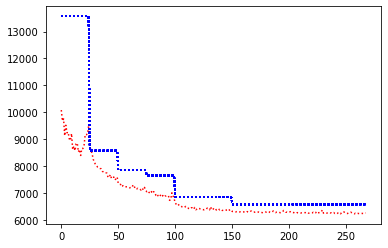

record the last path to gazebo for showing up


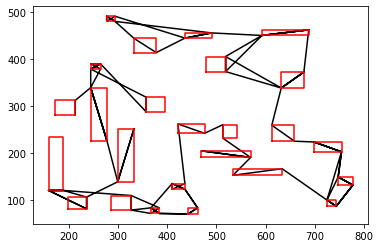

epoch:10, batch:1900/2500, reward:6234.0419921875


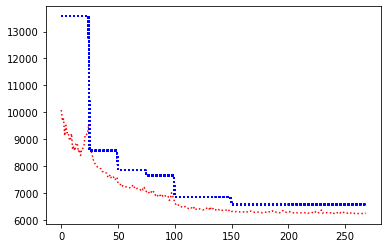

record the last path to gazebo for showing up


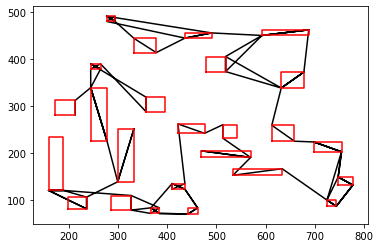

epoch:10, batch:2000/2500, reward:6219.5927734375


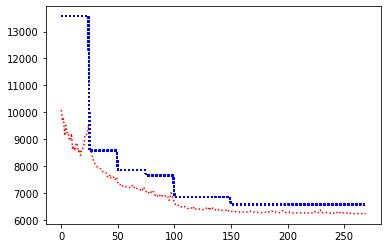

record the last path to gazebo for showing up


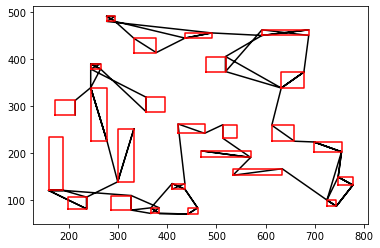

epoch:10, batch:2100/2500, reward:6257.1494140625


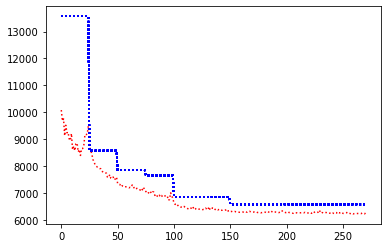

record the last path to gazebo for showing up


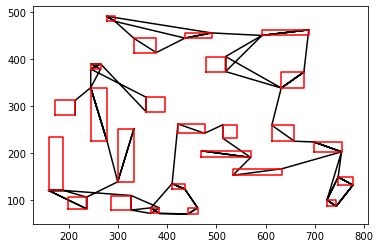

epoch:10, batch:2200/2500, reward:6224.2587890625


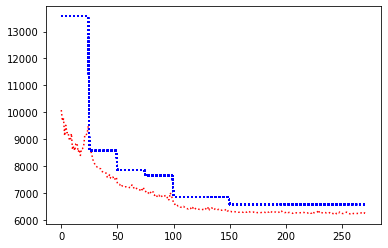

record the last path to gazebo for showing up


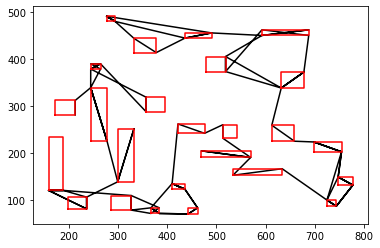

epoch:10, batch:2300/2500, reward:6251.7001953125


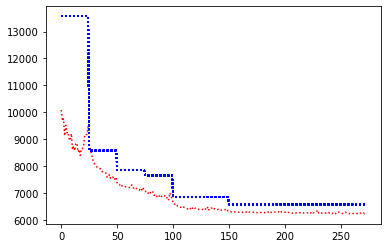

record the last path to gazebo for showing up


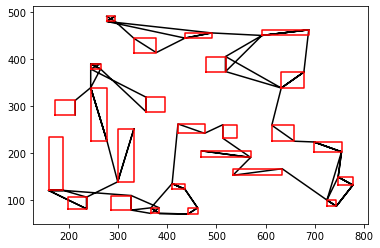

epoch:10, batch:2400/2500, reward:6219.0791015625


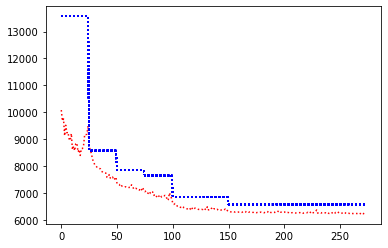

record the last path to gazebo for showing up


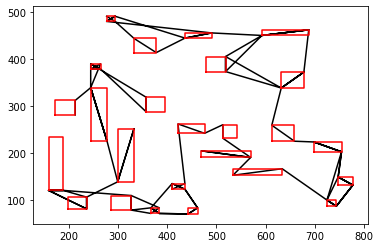

epoch:10, batch:2500/2500, reward:6240.70703125


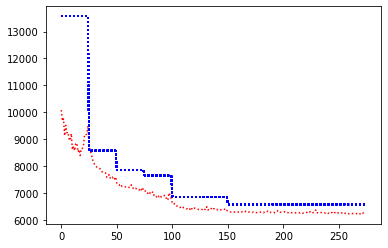

record the last path to gazebo for showing up


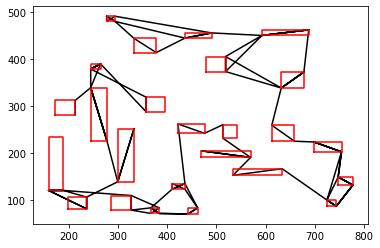

Avg Actor 14409.982421875 --- Avg Critic 6572.7587890625
Epoch: 10, epoch time: 86.852min, tot time: 0.669day, L_actor: 14409.982, L_critic: 6572.759, update: False
Save Checkpoints
epoch:11, batch:100/2500, reward:6254.7685546875


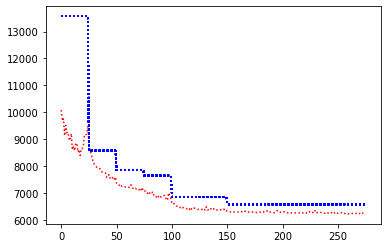

record the last path to gazebo for showing up


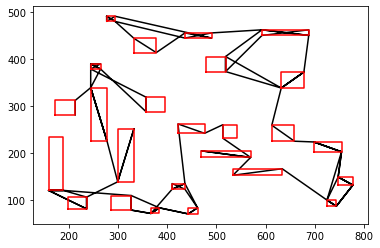

epoch:11, batch:200/2500, reward:6257.841796875


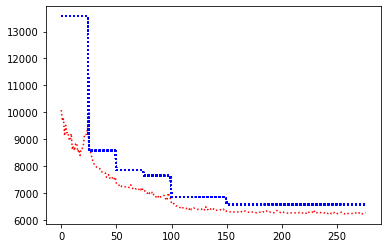

record the last path to gazebo for showing up


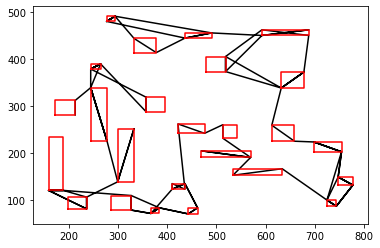

epoch:11, batch:300/2500, reward:6269.6552734375


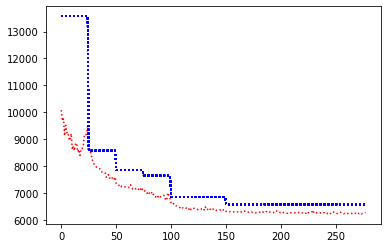

record the last path to gazebo for showing up


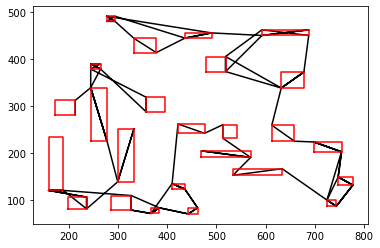

epoch:11, batch:400/2500, reward:6226.4052734375


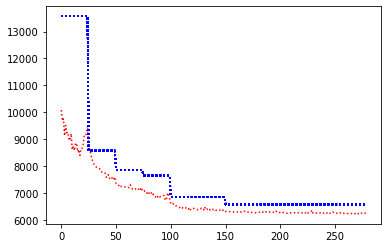

record the last path to gazebo for showing up


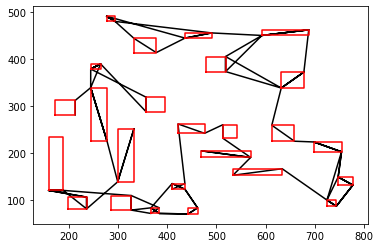

epoch:11, batch:500/2500, reward:6240.7470703125


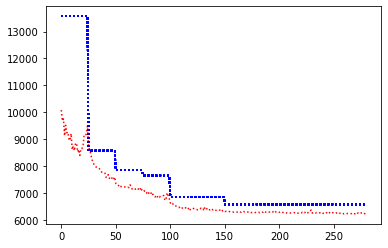

record the last path to gazebo for showing up


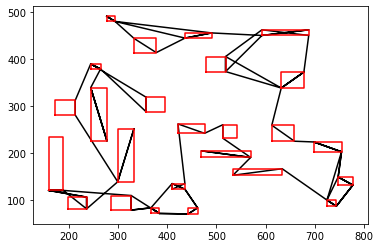

epoch:11, batch:600/2500, reward:6219.2724609375


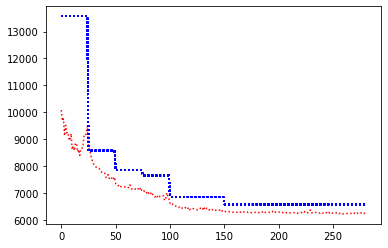

record the last path to gazebo for showing up


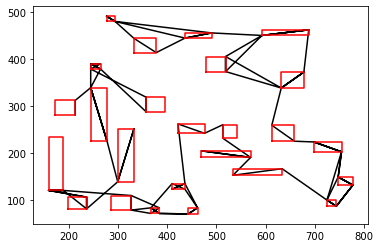

epoch:11, batch:700/2500, reward:6228.1640625


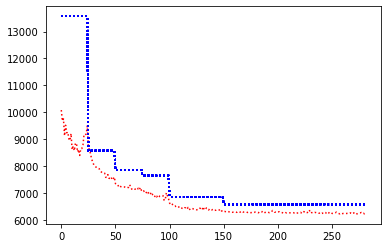

record the last path to gazebo for showing up


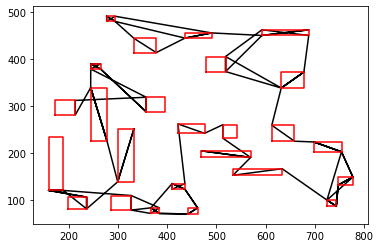

epoch:11, batch:800/2500, reward:6350.4423828125


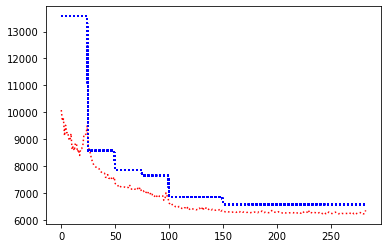

record the last path to gazebo for showing up


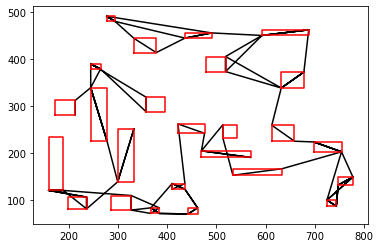

epoch:11, batch:900/2500, reward:6263.72314453125


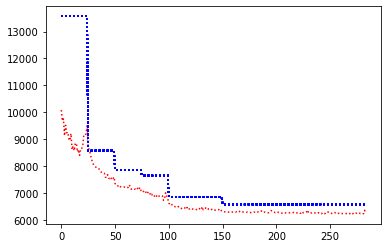

record the last path to gazebo for showing up


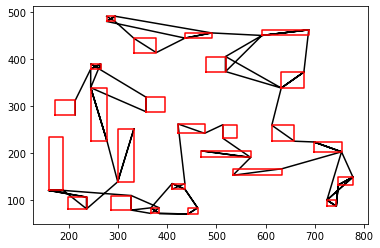

epoch:11, batch:1000/2500, reward:6233.65625


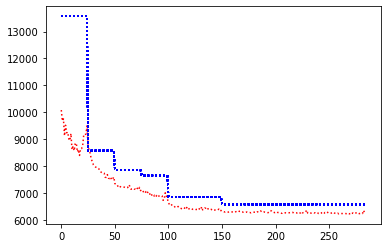

record the last path to gazebo for showing up


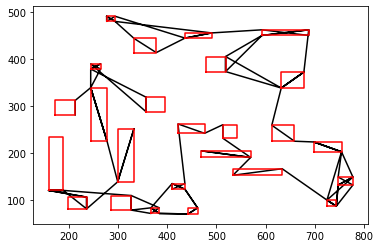

epoch:11, batch:1100/2500, reward:6270.7431640625


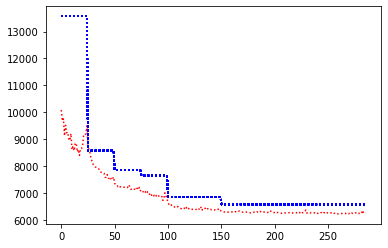

record the last path to gazebo for showing up


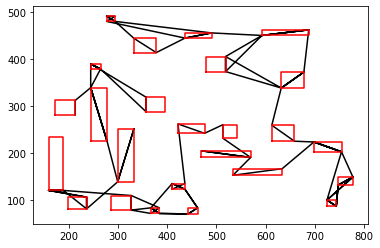

epoch:11, batch:1200/2500, reward:6220.95703125


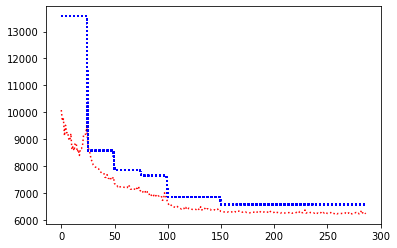

record the last path to gazebo for showing up


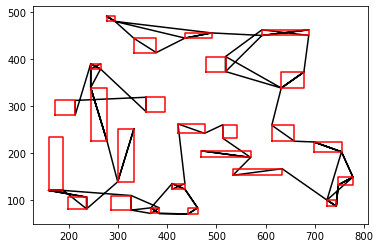

epoch:11, batch:1300/2500, reward:6241.50048828125


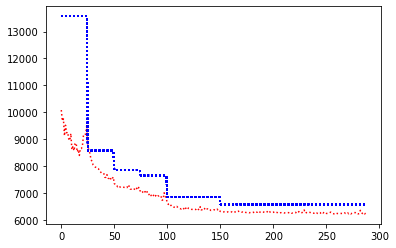

record the last path to gazebo for showing up


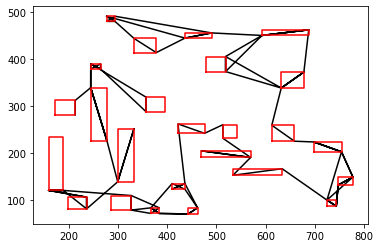

epoch:11, batch:1400/2500, reward:6231.9609375


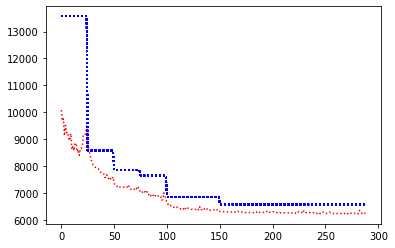

record the last path to gazebo for showing up


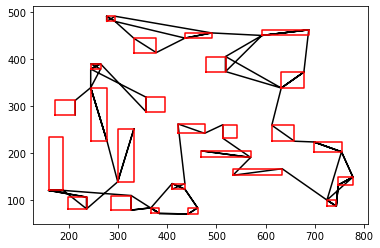

epoch:11, batch:1500/2500, reward:6221.1865234375


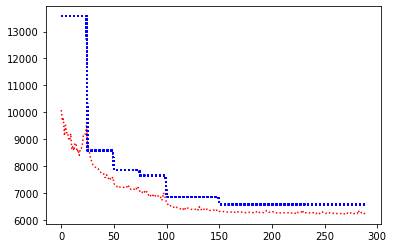

record the last path to gazebo for showing up


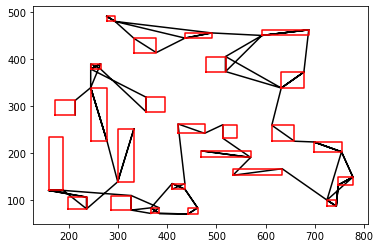

epoch:11, batch:1600/2500, reward:6220.8017578125


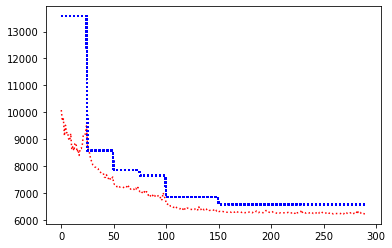

record the last path to gazebo for showing up


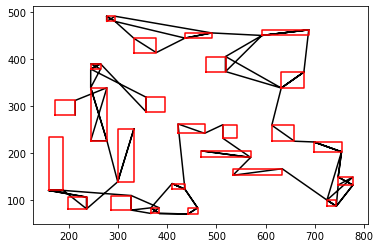

epoch:11, batch:1700/2500, reward:6245.22412109375


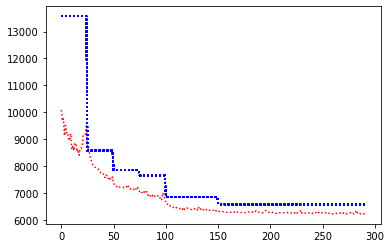

record the last path to gazebo for showing up


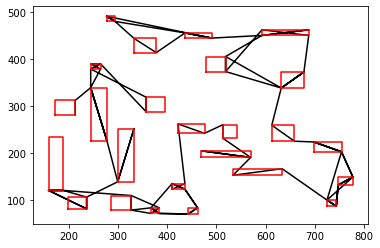

epoch:11, batch:1800/2500, reward:6241.97998046875


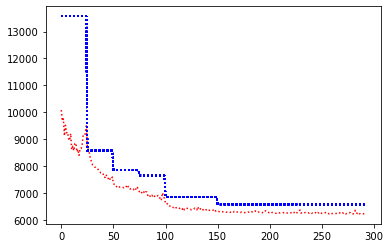

record the last path to gazebo for showing up


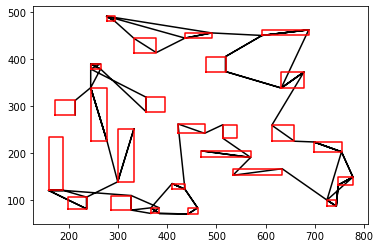

epoch:11, batch:1900/2500, reward:6224.228515625


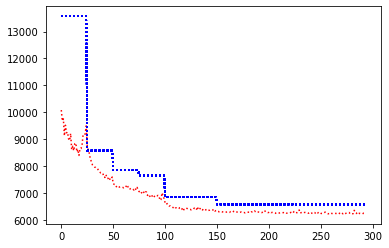

record the last path to gazebo for showing up


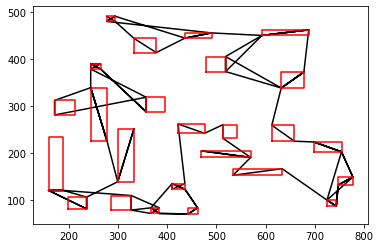

epoch:11, batch:2000/2500, reward:6235.60546875


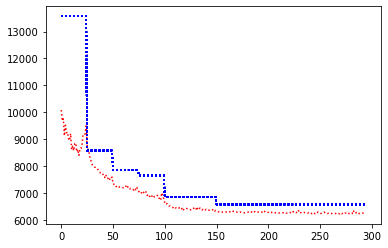

record the last path to gazebo for showing up


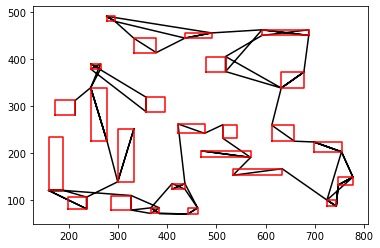

epoch:11, batch:2100/2500, reward:6223.3017578125


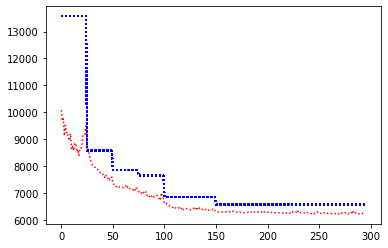

record the last path to gazebo for showing up


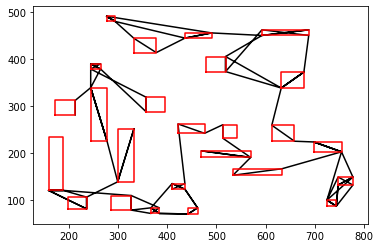

epoch:11, batch:2200/2500, reward:6210.68603515625


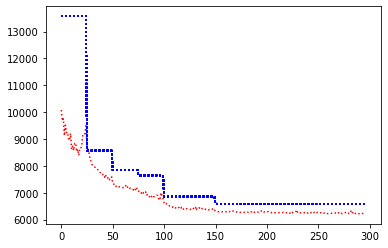

record the last path to gazebo for showing up


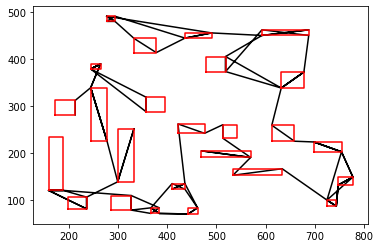

epoch:11, batch:2300/2500, reward:6211.9892578125


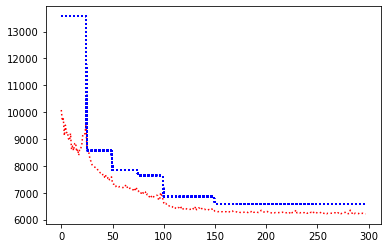

record the last path to gazebo for showing up


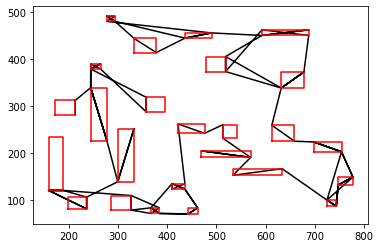

epoch:11, batch:2400/2500, reward:6216.5908203125


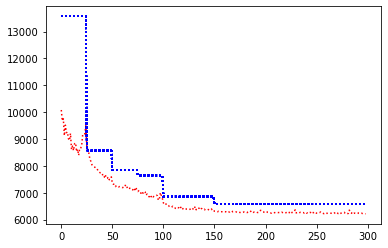

record the last path to gazebo for showing up


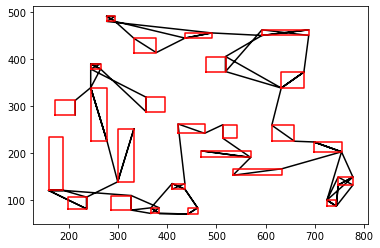

epoch:11, batch:2500/2500, reward:6207.98828125


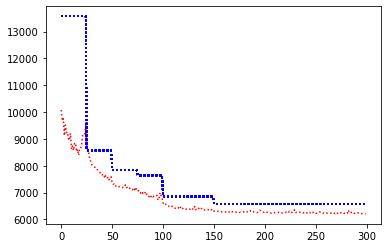

record the last path to gazebo for showing up


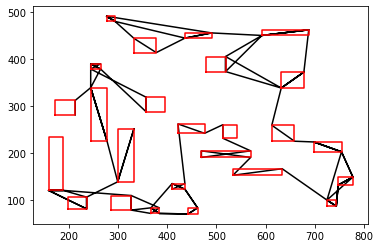

Avg Actor 8993.48046875 --- Avg Critic 6572.7587890625
Epoch: 11, epoch time: 87.674min, tot time: 0.730day, L_actor: 8993.480, L_critic: 6572.759, update: False
Save Checkpoints
epoch:12, batch:100/2500, reward:6225.63134765625


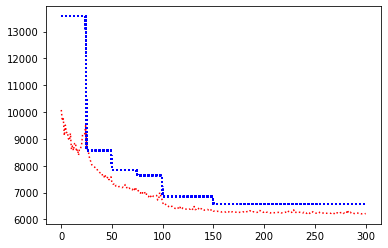

record the last path to gazebo for showing up


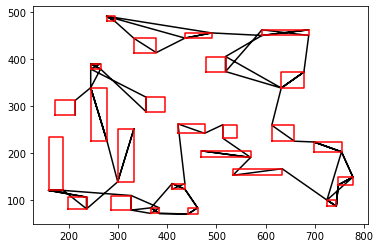

epoch:12, batch:200/2500, reward:6218.6435546875


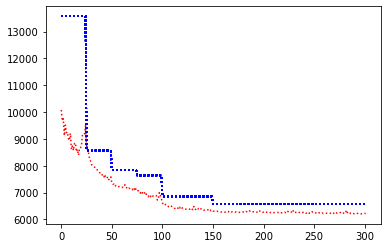

record the last path to gazebo for showing up


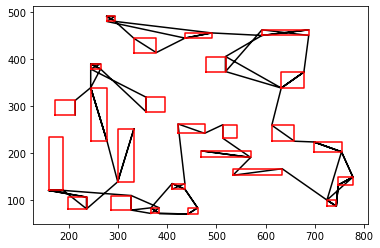

epoch:12, batch:300/2500, reward:6216.86328125


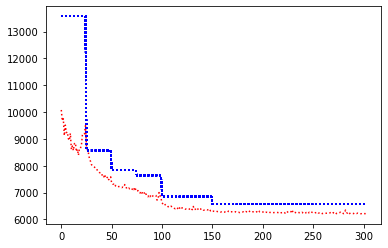

record the last path to gazebo for showing up


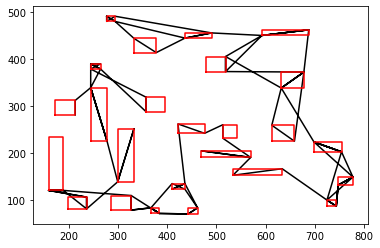

epoch:12, batch:400/2500, reward:6226.1455078125


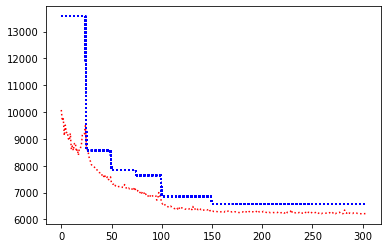

record the last path to gazebo for showing up


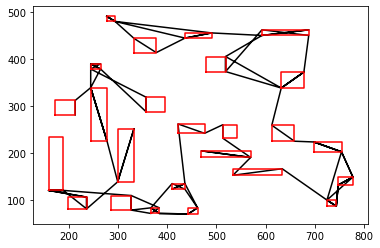

epoch:12, batch:500/2500, reward:6237.9111328125


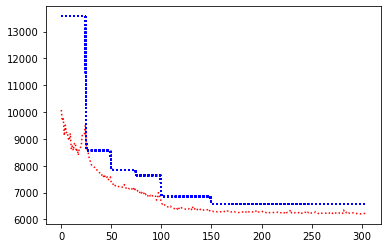

record the last path to gazebo for showing up


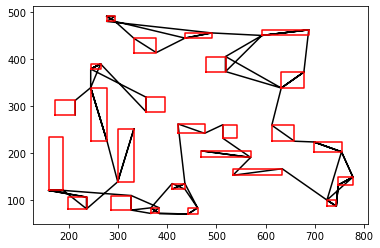

epoch:12, batch:600/2500, reward:6236.9833984375


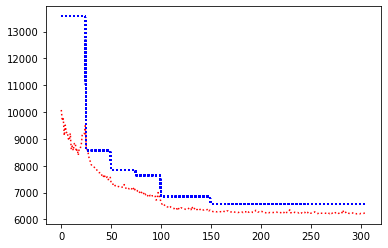

record the last path to gazebo for showing up


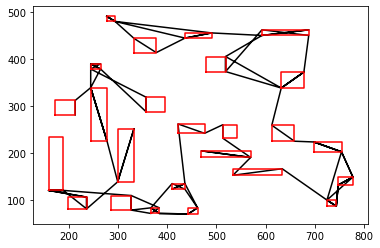

epoch:12, batch:700/2500, reward:6219.91796875


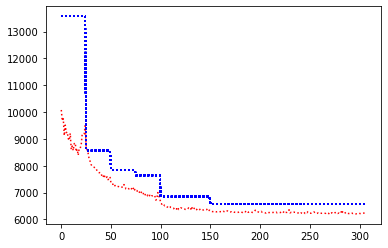

record the last path to gazebo for showing up


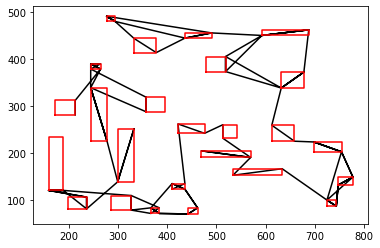

epoch:12, batch:800/2500, reward:6258.734375


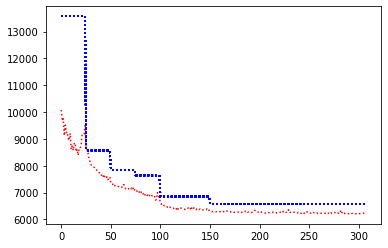

record the last path to gazebo for showing up


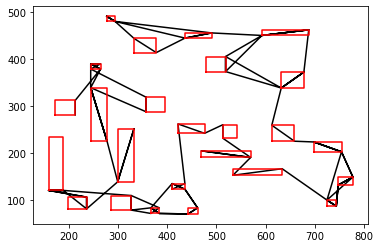

epoch:12, batch:900/2500, reward:6212.61962890625


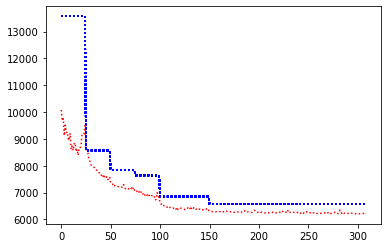

record the last path to gazebo for showing up


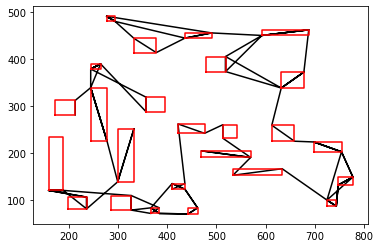

epoch:12, batch:1000/2500, reward:6229.771484375


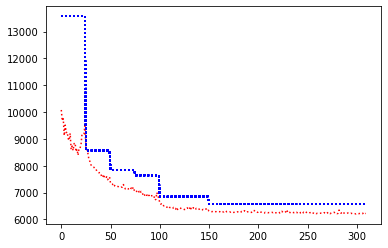

record the last path to gazebo for showing up


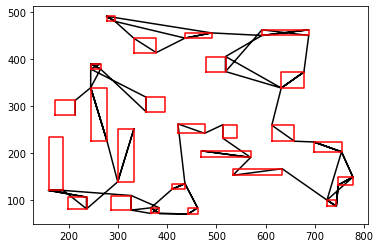

epoch:12, batch:1100/2500, reward:6217.4677734375


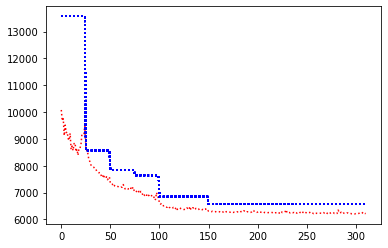

record the last path to gazebo for showing up


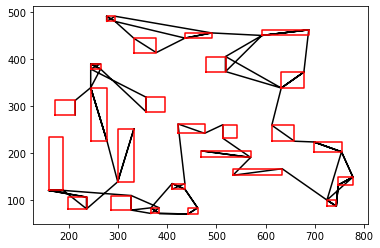

epoch:12, batch:1200/2500, reward:6224.6611328125


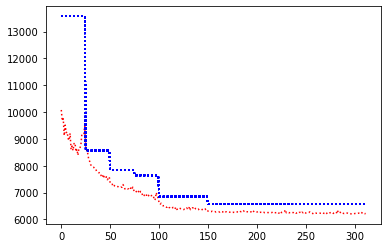

record the last path to gazebo for showing up


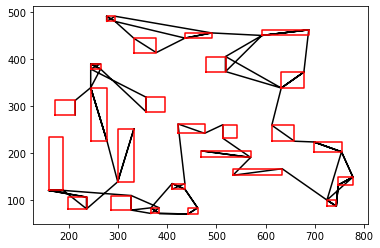

epoch:12, batch:1300/2500, reward:6230.36962890625


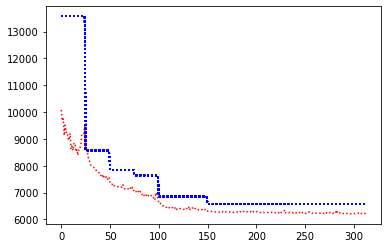

record the last path to gazebo for showing up


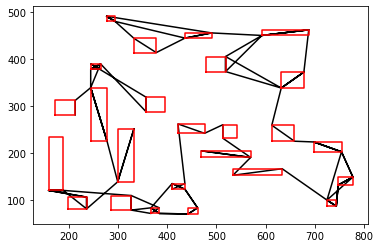

epoch:12, batch:1400/2500, reward:6220.646484375


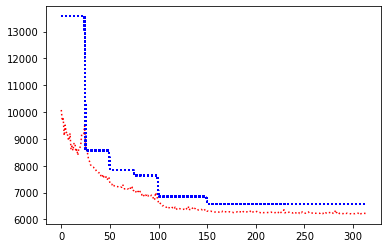

record the last path to gazebo for showing up


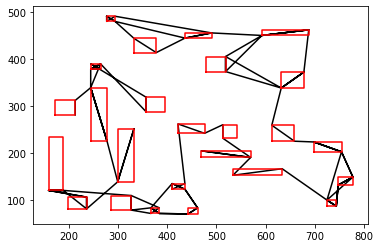

epoch:12, batch:1500/2500, reward:6239.0732421875


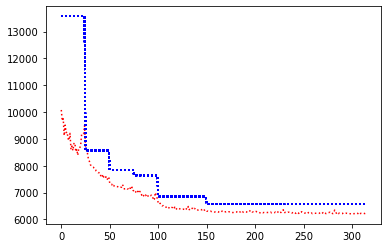

record the last path to gazebo for showing up


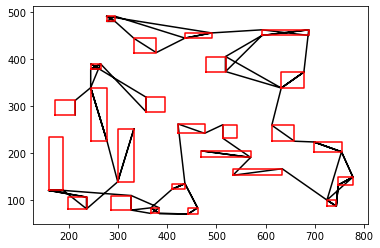

epoch:12, batch:1600/2500, reward:6264.06640625


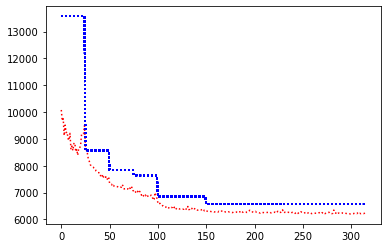

record the last path to gazebo for showing up


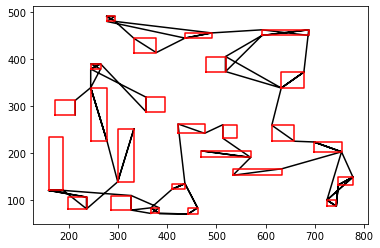

epoch:12, batch:1700/2500, reward:6244.8818359375


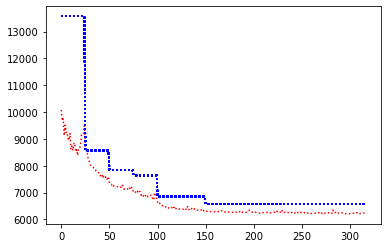

record the last path to gazebo for showing up


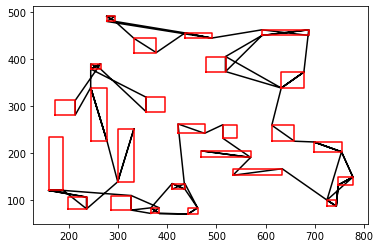

epoch:12, batch:1800/2500, reward:6243.6162109375


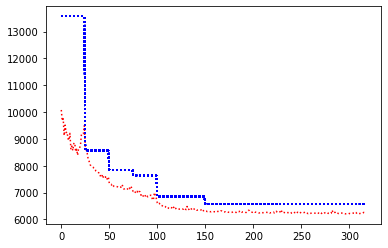

record the last path to gazebo for showing up


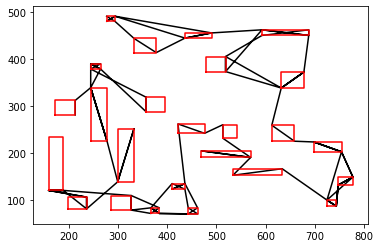

epoch:12, batch:1900/2500, reward:6248.42431640625


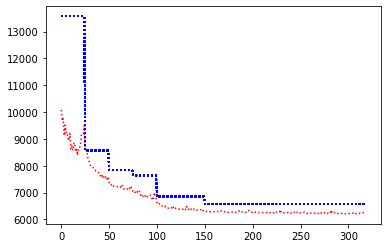

record the last path to gazebo for showing up


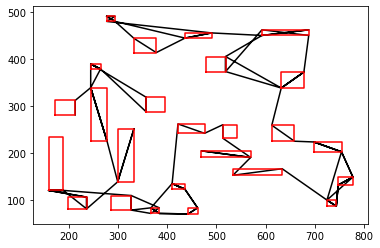

epoch:12, batch:2000/2500, reward:6244.0029296875


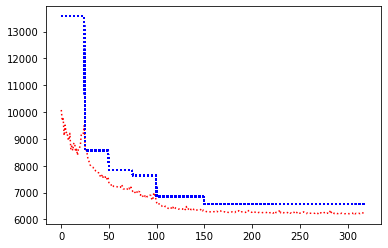

record the last path to gazebo for showing up


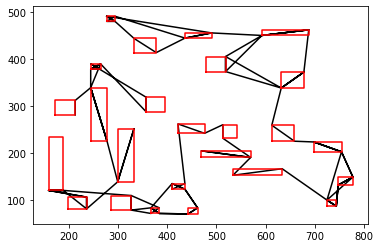

epoch:12, batch:2100/2500, reward:6238.9716796875


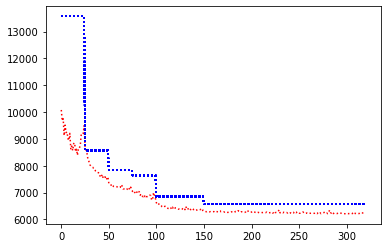

record the last path to gazebo for showing up


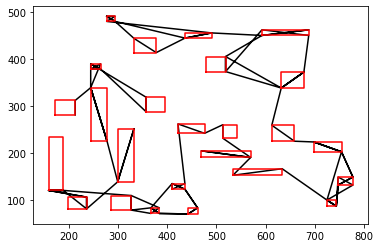

epoch:12, batch:2200/2500, reward:6209.3232421875


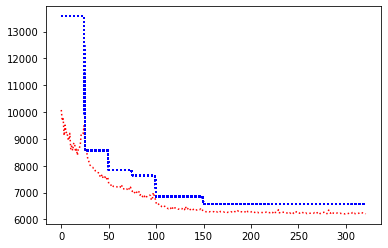

record the last path to gazebo for showing up


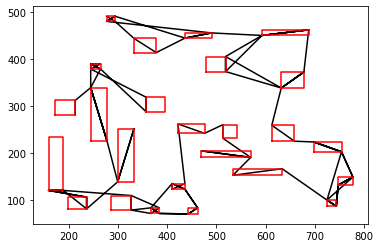

epoch:12, batch:2300/2500, reward:6220.13427734375


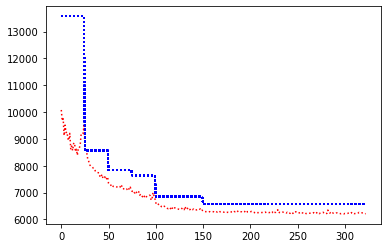

record the last path to gazebo for showing up


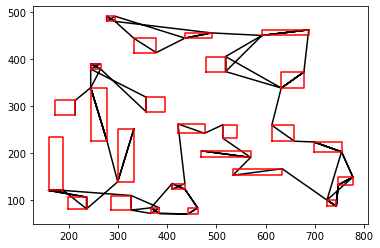

epoch:12, batch:2400/2500, reward:6223.8046875


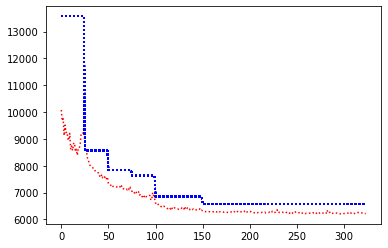

record the last path to gazebo for showing up


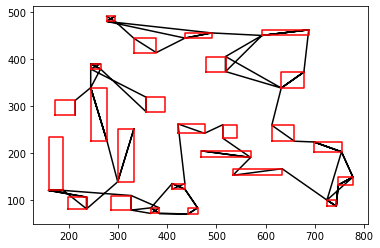

epoch:12, batch:2500/2500, reward:6221.75634765625


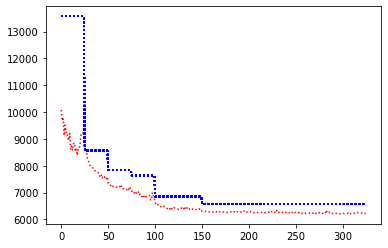

record the last path to gazebo for showing up


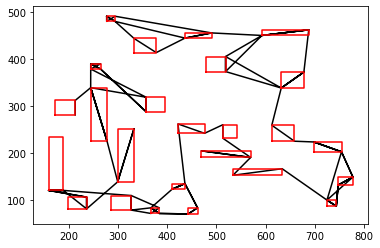

Avg Actor 9405.697265625 --- Avg Critic 6572.7587890625
Epoch: 12, epoch time: 86.559min, tot time: 0.791day, L_actor: 9405.697, L_critic: 6572.759, update: False
Save Checkpoints
epoch:13, batch:100/2500, reward:6238.587890625


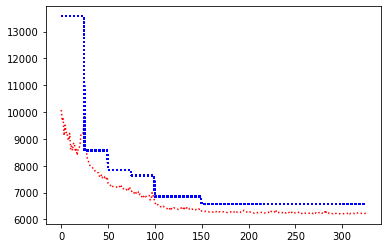

record the last path to gazebo for showing up


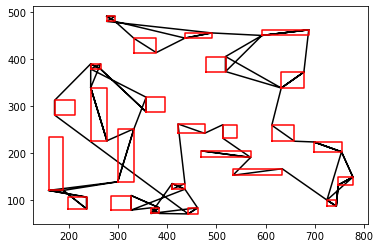

epoch:13, batch:200/2500, reward:6231.8642578125


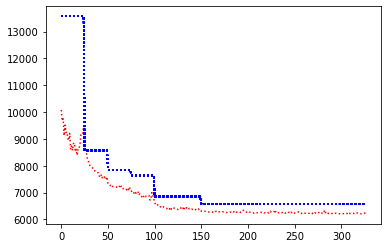

record the last path to gazebo for showing up


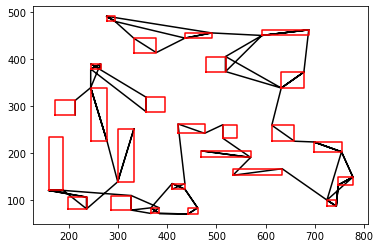

epoch:13, batch:300/2500, reward:6207.45263671875


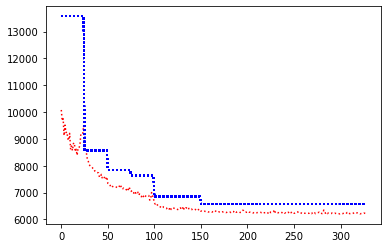

record the last path to gazebo for showing up


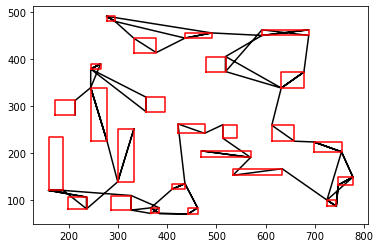

epoch:13, batch:400/2500, reward:6223.69189453125


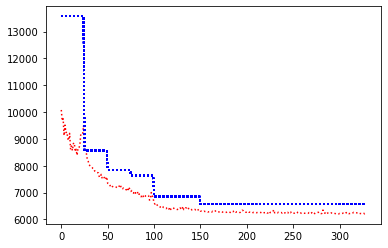

record the last path to gazebo for showing up


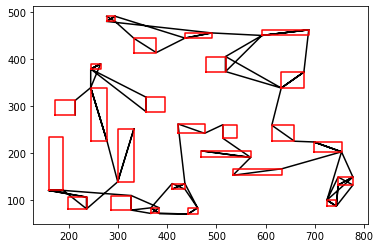

epoch:13, batch:500/2500, reward:6223.1748046875


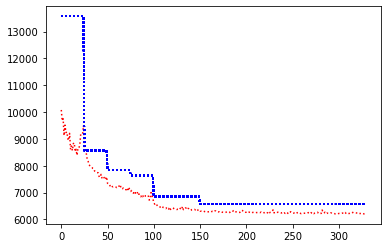

record the last path to gazebo for showing up


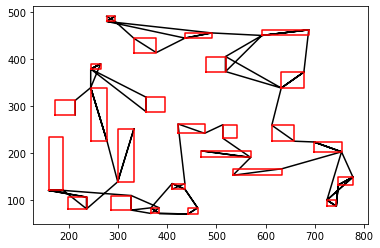

epoch:13, batch:600/2500, reward:6248.4169921875


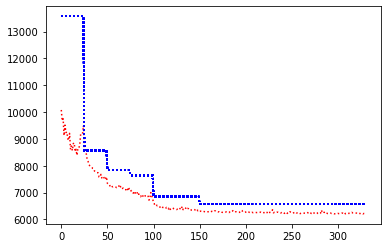

record the last path to gazebo for showing up


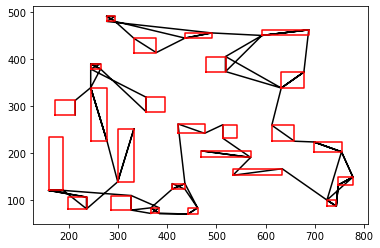

epoch:13, batch:700/2500, reward:6231.28662109375


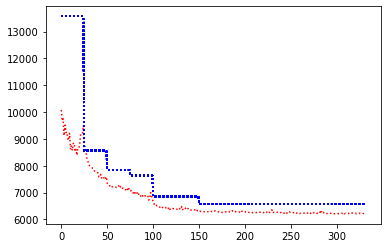

record the last path to gazebo for showing up


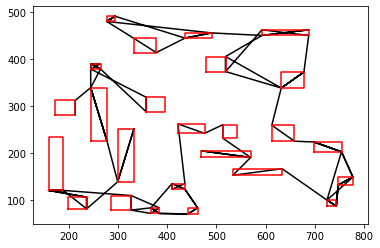

epoch:13, batch:800/2500, reward:6222.27294921875


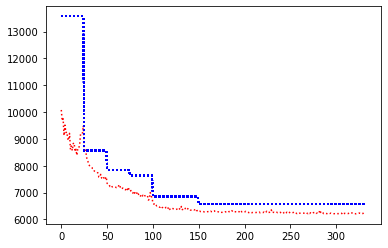

record the last path to gazebo for showing up


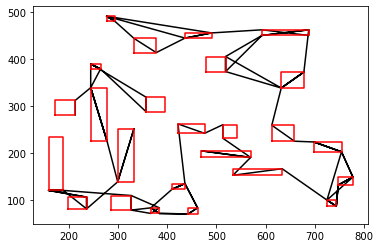

epoch:13, batch:900/2500, reward:6212.005859375


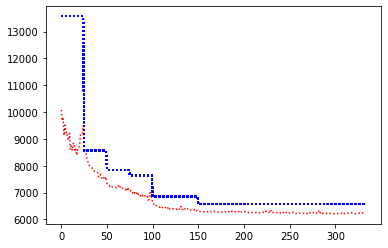

record the last path to gazebo for showing up


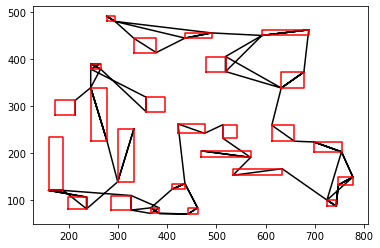

epoch:13, batch:1000/2500, reward:6226.06787109375


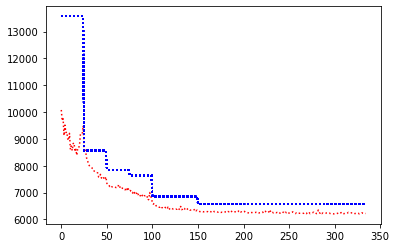

record the last path to gazebo for showing up


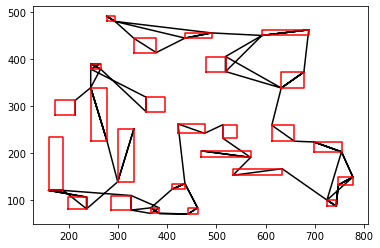

epoch:13, batch:1100/2500, reward:6208.00732421875


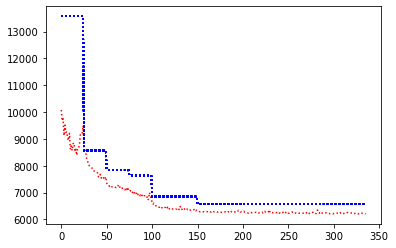

record the last path to gazebo for showing up


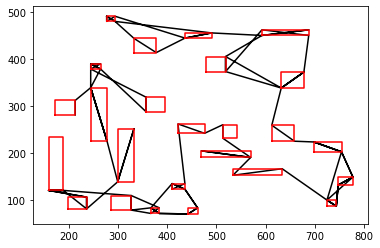

epoch:13, batch:1200/2500, reward:6206.1875


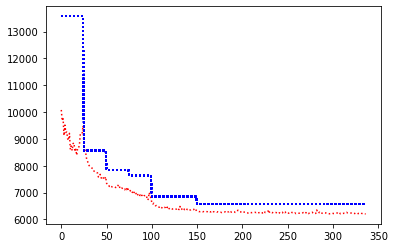

record the last path to gazebo for showing up


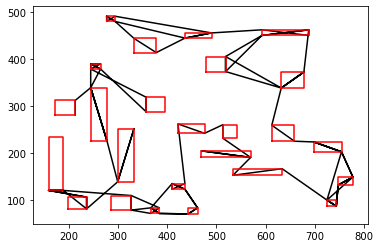

epoch:13, batch:1300/2500, reward:6218.9990234375


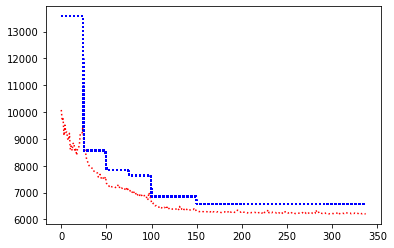

record the last path to gazebo for showing up


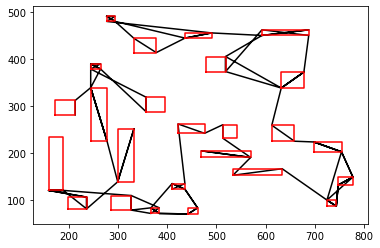

epoch:13, batch:1400/2500, reward:6208.68994140625


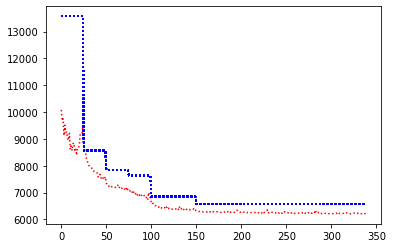

record the last path to gazebo for showing up


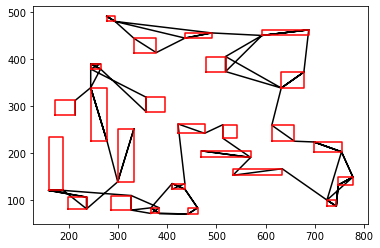

epoch:13, batch:1500/2500, reward:6280.70068359375


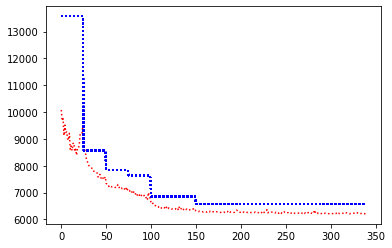

record the last path to gazebo for showing up


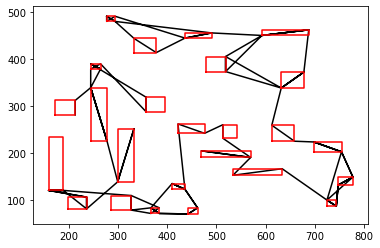

epoch:13, batch:1600/2500, reward:6220.84619140625


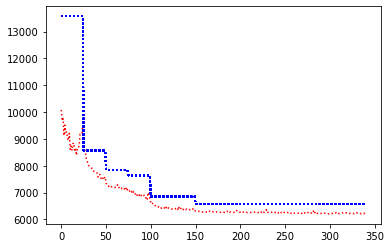

record the last path to gazebo for showing up


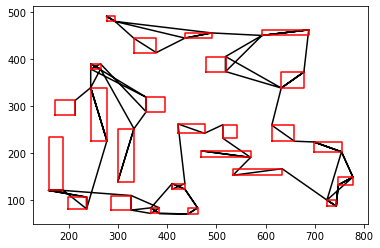

epoch:13, batch:1700/2500, reward:6220.82421875


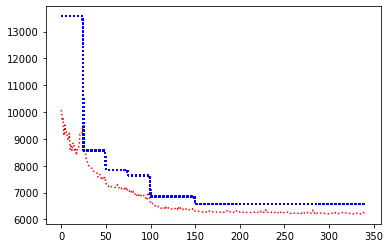

record the last path to gazebo for showing up


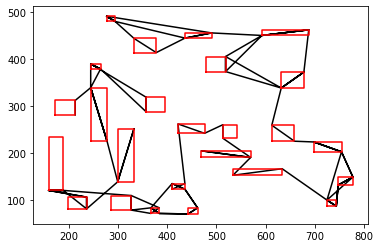

epoch:13, batch:1800/2500, reward:6268.9140625


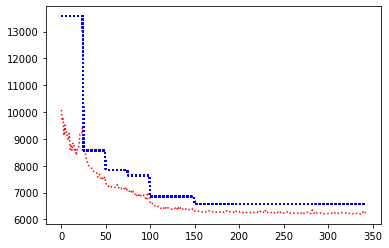

record the last path to gazebo for showing up


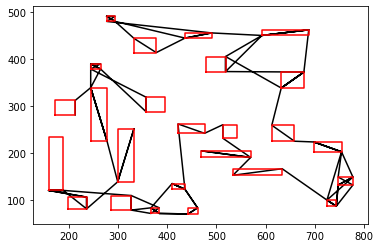

epoch:13, batch:1900/2500, reward:6205.6513671875


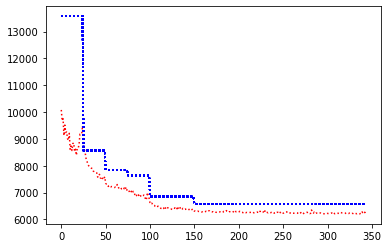

record the last path to gazebo for showing up


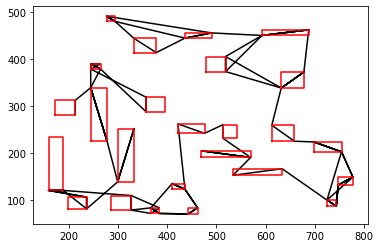

epoch:13, batch:2000/2500, reward:6218.24755859375


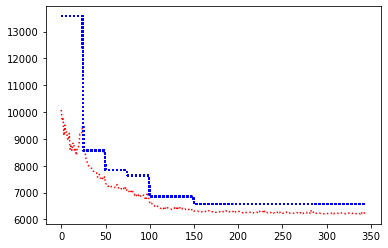

record the last path to gazebo for showing up


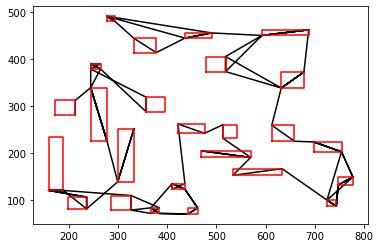

epoch:13, batch:2100/2500, reward:6221.0078125


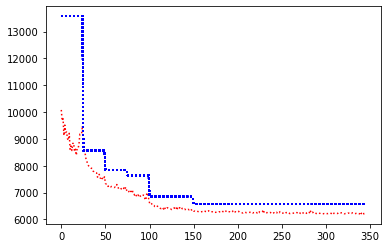

record the last path to gazebo for showing up


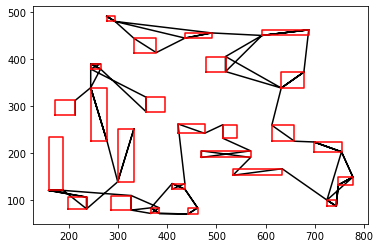

epoch:13, batch:2200/2500, reward:6405.107421875


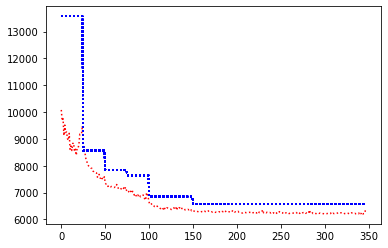

record the last path to gazebo for showing up


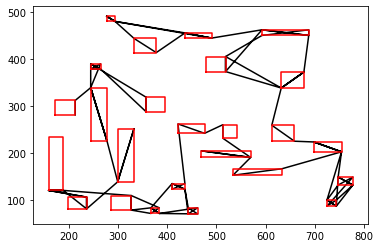

epoch:13, batch:2300/2500, reward:6335.2646484375


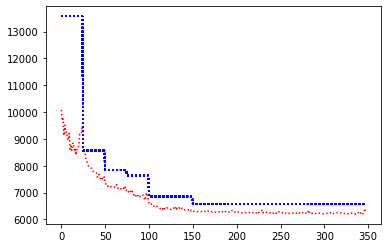

record the last path to gazebo for showing up


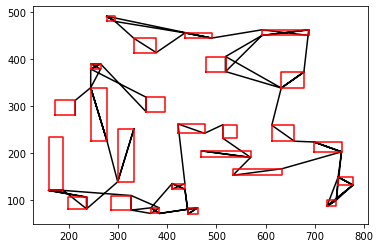

epoch:13, batch:2400/2500, reward:6284.5361328125


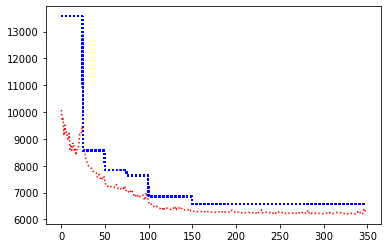

record the last path to gazebo for showing up


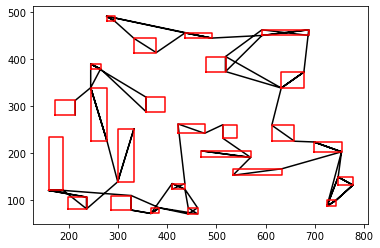

epoch:13, batch:2500/2500, reward:6245.3955078125


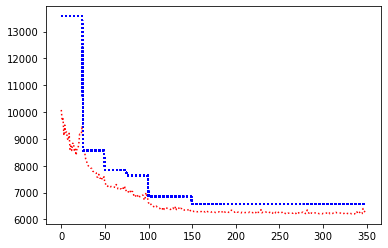

record the last path to gazebo for showing up


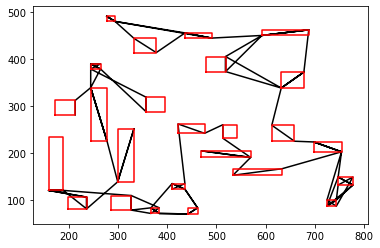

Avg Actor 11744.865234375 --- Avg Critic 6572.7587890625
Epoch: 13, epoch time: 87.238min, tot time: 0.852day, L_actor: 11744.865, L_critic: 6572.759, update: False
Save Checkpoints
epoch:14, batch:100/2500, reward:6224.4423828125


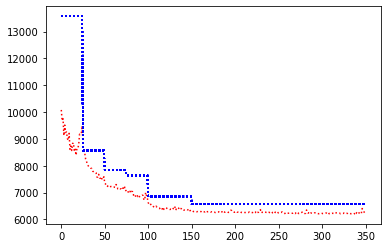

record the last path to gazebo for showing up


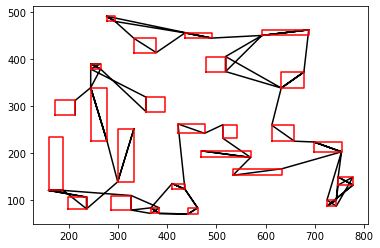

epoch:14, batch:200/2500, reward:6224.30859375


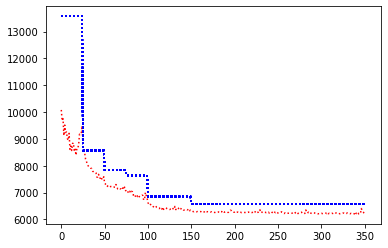

record the last path to gazebo for showing up


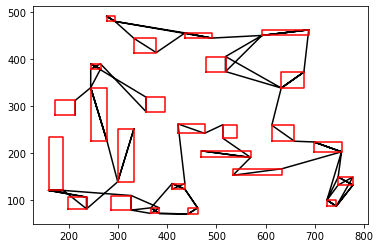

epoch:14, batch:300/2500, reward:6238.94580078125


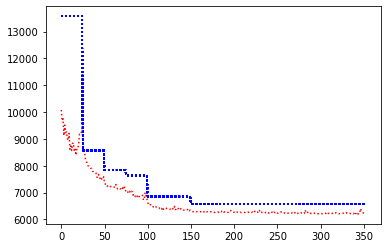

record the last path to gazebo for showing up


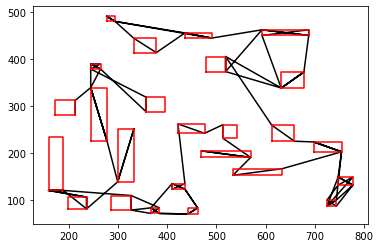

epoch:14, batch:400/2500, reward:6232.41796875


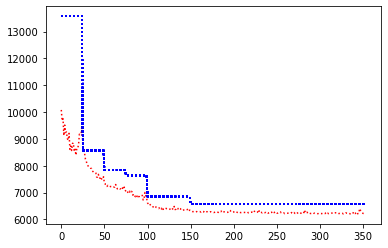

record the last path to gazebo for showing up


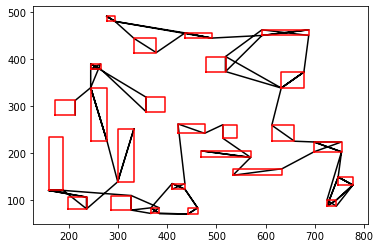

epoch:14, batch:500/2500, reward:6227.72802734375


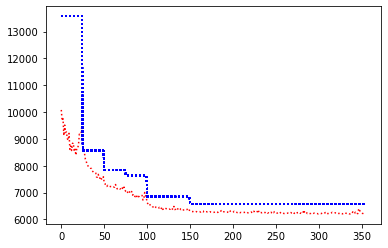

record the last path to gazebo for showing up


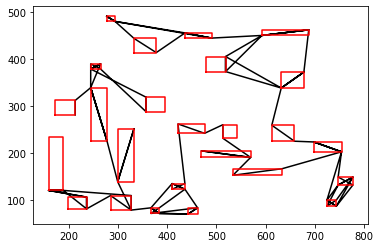

epoch:14, batch:600/2500, reward:6219.123046875


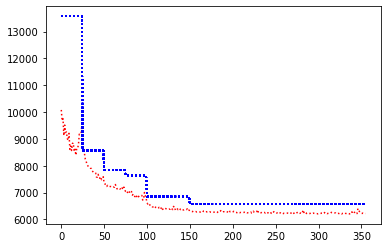

record the last path to gazebo for showing up


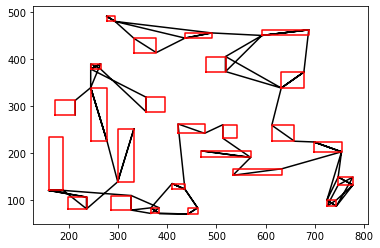

epoch:14, batch:700/2500, reward:6226.546875


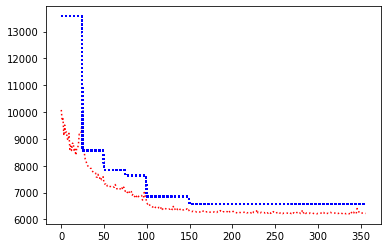

record the last path to gazebo for showing up


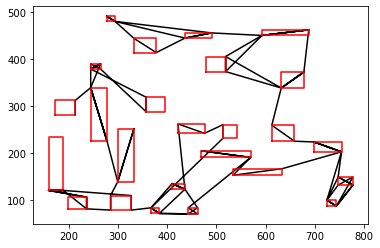

In [ ]:
import yaml
from torch.distributions.categorical import Categorical
# visualization
%matplotlib inline
import matplotlib.pyplot as plt
import warnings
from tqdm import tqdm_notebook
import torch.nn.functional as F
####### my own import file ##########
from listofpathpoint import input_handler
import cnc_input
import copy
#from hybrid_models import HPN
####### my own import file ##########
'''
so, the models we have are TransEncoderNet,
                            Attention
                            LSTM
                            HPN
each one have initial parameters and the forward part, 
once we have the forward part, the back propagation will 
finished automatically by pytorch  
'''
TOL = 1e-3
TINY = 1e-15
learning_rate = 1e-4   #learning rate
B = 128            #batch size
B_valLoop = 20
steps = 2500
n_epoch = 100       # epochs
map_number = 0
record_actor = []
record_critic = []
dimension = 4
speed_of_nozzle = 30
range_of_wait = 10
visit_time_range = 4
scale_of_the_map = (800,500,speed_of_nozzle*range_of_wait)

print('======================')
print('prepare to train')
print('======================')
print('Hyper parameters:')
print('learning rate', learning_rate)
print('batch size', B)
print('steps', steps)
print('epoch', n_epoch)
print('======================')

'''
instantiate a training network and a baseline network
'''


try:
    del Actor  # remove existing model
    del Critic # remove existing model
except:
    pass
Actor = HPN(n_feature = dimension, n_hidden = 128)
Critic = HPN(n_feature = dimension, n_hidden = 128)
optimizer = optim.Adam(Actor.parameters(), lr=learning_rate)

# Putting Critic model on the eval mode
Actor = Actor.to(device)
Critic = Critic.to(device)
Critic.eval()

epoch_ckpt = 0
tot_time_ckpt = 0

val_mean = []
val_std = []
maplist = ['10&15data/25_chips/25_1.json'
          ,'10&15data/25_chips/25_1.json','10&15data/25_chips/25_1.json'\
          ,'10&15data/25_chips/25_1.json','10&15data/25_chips/25_1.json'\
          ,'10&15data/25_chips/25_1.json'
          ]
          
plot_performance_train = []
plot_performance_baseline = []
# recording the result of the resent epoch makes it available for future
#*********************# Uncomment these lines to load the previous check point
"""
checkpoint_file = "checkpoint/mutimap_20.pkl"
checkpoint = torch.load(checkpoint_file, map_location=device)
epoch_ckpt = checkpoint['epoch'] + 1
tot_time_ckpt = checkpoint['tot_time']
plot_performance_train = checkpoint['plot_performance_train']
plot_performance_baseline = checkpoint['plot_performance_baseline']
Critic.load_state_dict(checkpoint['model_baseline'])
Actor.load_state_dict(checkpoint['model_train'])
optimizer.load_state_dict(checkpoint['optimizer'])

print('Re-start training with saved checkpoint file={:s}\n  Checkpoint at epoch= {:d} and time={:.3f}min\n'.format(checkpoint_file,epoch_ckpt-1,tot_time_ckpt/60))
"""

#***********************# Uncomment these lines to load the previous check point

# Main training loop
# The core training concept mainly upon Sampling from the actor
# then taking the greedy action from the critic

start_training_time = time.time()
time_stamp = datetime.datetime.now().strftime("%y-%m-%d--%H-%M-%S") # Load the time stamp

C = 0       # baseline => the object which the actor can compare
R = 0       # reward

temp = input_handler(maplist[map_number])
X_temp, mask_list_num, waiting_time_list_initial = temp.final_ver_points()
X_baseline_temp, mask_list_num, waiting_time_list_initial = temp.baseline_points()
#change the waiting time to the distance that we can measure
mask_list_num_with_lastone = mask_list_num.copy()
size = mask_list_num.pop()*4
size_final = len(X_temp)
if torch.cuda.is_available():
    Not_last_time = torch.ones(B,size, dtype=torch.bool).cuda()
else:
    Not_last_time = torch.ones(B,size, dtype=torch.bool)
zero_to_bsz = torch.arange(B, device = device) # a list contains 0 to (batch size -1)
zero_to_size = torch.arange(size_final, device = device)
for last_one in mask_list_num:
    Not_last_time[zero_to_bsz,(last_one-1)*4] = False
    Not_last_time[zero_to_bsz,(last_one-1)*4+1] = False
    Not_last_time[zero_to_bsz,(last_one-1)*4+2] = False
    Not_last_time[zero_to_bsz,(last_one-1)*4+3] = False

for corner in X_temp:
    corner[dimension -2] *= speed_of_nozzle
size_rec = int(size/4)
print(size_rec)

X_temp = torch.FloatTensor(X_temp)
X_baseline_temp = torch.FloatTensor(X_baseline_temp)
waiting_time_list_initial = torch.FloatTensor(waiting_time_list_initial)
X = X_temp.repeat(B,1,1)
X_baseline = X_baseline_temp.repeat(B,1,1)
waiting_time_list_initial *= speed_of_nozzle
waiting_time_list = waiting_time_list_initial.repeat(B,1)
if torch.cuda.is_available():
    waiting_time_list = waiting_time_list.cuda()
map_matrix = make_map_matrix(size, size_final, mask_list_num_with_lastone)

print('initial_all',waiting_time_list_initial)

if torch.cuda.is_available():
    X = X.cuda()

for epoch in range(0, n_epoch):
    # re-start training with saved checkpoint
    epoch += epoch_ckpt # adding the number of the former epochs
    # Train the model for one epoch
    start = time.time() # record the starting time
    Actor.train() 
    path_gazebo = []
    for i in range(1, steps+1): # 1 ~ 2500 steps
        # mask some points that are not the first visited points
        if torch.cuda.is_available():
            R = torch.zeros(B).cuda()
            punishment_of_wait = torch.zeros(B).cuda()
            logprobs = 0
            reward = torch.zeros(B).cuda()
            mask_final = torch.zeros(B,size_final).cuda()
            mask = torch.zeros(B,size).cuda() # use mask to make some points impossible to choose
            mask_temp = torch.zeros(B,size).cuda() # mask_temp for temp-masked points(wait for drying)
        else:
            R = torch.zeros(B)
            punishment_of_wait = torch.zeros(B)
            logprobs = 0
            reward = torch.zeros(B)
            mask_final = torch.zeros(B,size_final)
            mask = torch.zeros(B,size) # use mask to make some points impossible to choose
            mask_temp = torch.zeros(B,size) # mask_temp for temp-masked points(wait for drying)
        mask_temp += -np.inf
        for initial_area_idx in mask_list_num:
            mask_temp[zero_to_bsz,initial_area_idx*4] = 0
            mask_temp[zero_to_bsz,initial_area_idx*4 +1] = 0
            mask_temp[zero_to_bsz,initial_area_idx*4 +2] = 0
            mask_temp[zero_to_bsz,initial_area_idx*4 +3] = 0
        if torch.cuda.is_available():
            Not_choosen_ones = torch.ones(B,size).cuda()
        else:
            Not_choosen_ones = torch.ones(B,size)
        x = torch.zeros(B,dimension)# Y[:,0,:] #set the first point to x
        h = None
        c = None
        context = None        # set Y_ini to the out corner
        Transcontext = None
        Y0 = None
        waiting_time_list = waiting_time_list_initial.repeat(B,1)
        if torch.cuda.is_available():
            waiting_time_list = waiting_time_list.cuda()
        # need a counter_visit here to map the baseline_idx to final_version_idx
        counter_visit = torch.zeros(B,int(size_final/4))
        if torch.cuda.is_available():
            counter_visit = counter_visit.cuda()
        # Actor Sampling phase
        for k in range(size_rec):
            #add the time passed to the time axis of nessesary points
            reward_reshape = reward.view(B,1)
            waiting_time_list[zero_to_bsz] += Not_choosen_ones[zero_to_bsz] * reward_reshape
            R_reshape = R.view(B,1)
            temp_remain_wait = waiting_time_list - R_reshape
            Y = X_baseline.view(B,size,dimension-1)
            Y_final = X.view(B,size_final,dimension)
            #refresh the mask list, fits the present situation
            mask_temp = unmask_checker(R,B, waiting_time_list, mask_temp)
            #check if all the points to be masked,if so, raise the total reward R, and check again
            if torch.cuda.is_available():
                test_mask_tool = torch.zeros(B,size).cuda()
            else:
                test_mask_tool = torch.zeros(B,size)
            test_mask_tool += mask
            test_mask_tool += mask_temp
            test_output = F.softmax(test_mask_tool, dim=1)
            test_anyone_open = torch.sum(test_output,1)
            test_anyone_open = test_anyone_open>0
            test_no_one_open = torch.logical_not(test_anyone_open)
            if torch.sum(test_no_one_open.type(torch.uint8)) >0:
                punishment_of_wait += test_no_one_open*range_of_wait*speed_of_nozzle
                temp_waiting = range_of_wait*speed_of_nozzle
                mask_temp = unmask_checker(R+temp_waiting,B, waiting_time_list, mask_temp)
            # now we need to convert the mask+mask_temp to mask_final and use it 
            mask_final_temp = mask + mask_temp
            # using a function 'logical mask filter'    
            mask_final = logical_mask_filter(mask_final_temp, mask_final, map_matrix)
            if torch.cuda.is_available():
                mask_final = mask_final.cuda()
            context, Transcontext, output, h, c, _ = Actor(context,Transcontext,x=x, X_all=X,h=h,
                                                           c=c, mask_final=mask_final)
            sampler = torch.distributions.Categorical(output)
            idx = sampler.sample() #[batch_size, 1]
            # this idx here is the final point version, need to transfer to baseline version
            
            # make a function to map the idx to idx_baseline using counter_visit and mask_list_num_with_lastone
            idx_baseline = idx_transfer(counter_visit, mask_list_num_with_lastone, idx,B)
            #prepare for the back propagation of pytorch
            reward, Y0,x = rectangle_process_actor(temp, idx_baseline,idx,Y,Y_final,Y0,mask,k,B,i,path_gazebo,
                                                Not_choosen_ones,Not_last_time,mask_list_num_with_lastone)
            
            R += reward
            logprobs += torch.log(output[zero_to_bsz, idx.data] + TINY)
            
# critic baseline phase, use the baseline to compute the actual reward of agent at that time
        if torch.cuda.is_available():
            mask = torch.zeros(B,size).cuda() # use mask to make some points impossible to choose
            C = torch.zeros(B).cuda()
            punishment_of_wait_critic = torch.zeros(B).cuda()
            baseline = torch.zeros(B).cuda()
            mask_temp = torch.zeros(B,size).cuda() # mask_temp for temp-masked points(wait for drying)
        else:
            mask = torch.zeros(B,size) # use mask to make some points impossible to choose
            C = torch.zeros(B)
            punishment_of_wait_critic = torch.zeros(B)
            baseline = torch.zeros(B)
            mask_temp = torch.zeros(B,size) # mask_temp for temp-masked points(wait for drying)
        mask_temp += -np.inf
        for initial_area_idx in mask_list_num:
            mask_temp[zero_to_bsz,initial_area_idx*4] = 0
            mask_temp[zero_to_bsz,initial_area_idx*4 +1] = 0
            mask_temp[zero_to_bsz,initial_area_idx*4 +2] = 0
            mask_temp[zero_to_bsz,initial_area_idx*4 +3] = 0
        if torch.cuda.is_available():
            Not_choosen_ones = torch.ones(B,size).cuda()
        else:
            Not_choosen_ones = torch.ones(B,size)
        x = torch.zeros(B,dimension)#Y[:,0,:] #set the first point to x
        h = None
        c = None
        context = None
        Transcontext = None
        C0 = None
        waiting_time_list = waiting_time_list_initial.repeat(B,1)
        if torch.cuda.is_available():
            waiting_time_list = waiting_time_list.cuda()
        # compute tours for baseline without grad "Cause we want to fix the weights for the critic"

        with torch.no_grad():
            # need a counter_visit here to map the baseline_idx to final_version_idx
            counter_visit = torch.zeros(B,int(size_final/4))
            if torch.cuda.is_available():
                counter_visit = counter_visit.cuda()
            for k in range(size_rec):     
                baseline_reshape = baseline.view(B,1)
                waiting_time_list[zero_to_bsz] += Not_choosen_ones[zero_to_bsz] * baseline_reshape
                Y = X_baseline.view(B,size,dimension-1)
                Y_final = X.view(B,size_final,dimension)
                mask_temp = unmask_checker(C,B, waiting_time_list, mask_temp)
                #check if all the points to be masked,if so, raise the total reward R, and check again
                if torch.cuda.is_available():
                    test_mask_tool = torch.zeros(B,size).cuda()
                else:
                    test_mask_tool = torch.zeros(B,size)
                test_mask_tool += mask
                test_mask_tool += mask_temp
                test_output = F.softmax(test_mask_tool, dim=1)
                test_anyone_open = torch.sum(test_output,1)
                test_anyone_open = test_anyone_open>0
                test_no_one_open = torch.logical_not(test_anyone_open)
                if torch.sum(test_no_one_open.type(torch.uint8)) >0:
                    punishment_of_wait_critic += test_no_one_open*range_of_wait*speed_of_nozzle
                    temp_waiting = range_of_wait*speed_of_nozzle
                    mask_temp = unmask_checker(C+temp_waiting,B, waiting_time_list, mask_temp)
                # now we need to convert the mask+mask_temp to mask_final and use it 
                mask_final_temp = mask + mask_temp
                # using a function 'logical mask filter'    
                mask_final = logical_mask_filter(mask_final_temp, mask_final, map_matrix)
                if torch.cuda.is_available():
                    mask_final = mask_final.cuda()
                context, Transcontext, output, h, c, _ = Critic(context,Transcontext,x=x, X_all=X,h=h,
                                                                c=c, mask_final=mask_final)
                idx = torch.argmax(output, dim=1) # ----> greedy baseline critic
                # this idx here is the final point version, need to transfer to baseline version
                # make a function to map the idx to idx_baseline using counter_visit and mask_list_num_with_lastone
                idx_baseline = idx_transfer(counter_visit, mask_list_num_with_lastone, idx,B)
                baseline, C0,x = rectangle_process(temp,idx_baseline,idx,Y,Y_final,C0, mask,k,B,
                                                   Not_choosen_ones,Not_last_time,mask_list_num_with_lastone)
                C += baseline
        ###################
        # Loss and backprop handling 
        ###################
        C+= punishment_of_wait_critic
        R+= punishment_of_wait
        loss = torch.mean((R - C) * logprobs)
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        if i % 100 == 0:
            print("epoch:{}, batch:{}/{}, reward:{}".format(epoch, i, steps,R.mean().item()))
            record_actor.append(R.mean().tolist())
            record_critic.append(C.tolist())
            plt.plot(record_actor,'r:')
            plt.plot(record_critic,'b:')
            plt.show()
        if i % 100 == 0:
            print("record the last path to gazebo for showing up")
            #starting to show the path on simulated enviroment of cnc_machine 
            the_resent_path = temp.zig_zag_path(path_gazebo,mask_list_num_with_lastone)
            data = {'path':the_resent_path}
            data_1 = {'corners':path_gazebo}
            pathpoints_dir = os.path.join("pathpoints")
            if not os.path.exists(pathpoints_dir):
                os.makedirs(pathpoints_dir)
            name = 'pathpoints/path_points '+str(i)+'.yaml'
            with open(name, 'w') as file:
                documents = yaml.dump(data,file)
                documents = yaml.dump(data_1,file)
            path_gazebo = []
        if i % 2000 == 0:
            validation_R = R.mean().item()
    time_one_epoch = time.time() - start #recording the work time of one epoch
    time_tot = time.time() - start_training_time + tot_time_ckpt
    ###################
    # Evaluate train model and baseline 
    # in this phase we just solve random instances with the actor and the critic
    # compare this soluation if we get any improvment we'll transfer the actor's
    # weights into the critic
    ###################
    # putting the actor in the eval mode
    Actor.eval()
    
    mean_tour_length_actor = validation_R
    mean_tour_length_critic = 0

    for step in range(0,B_valLoop):
        
        # compute tour for model and baseline
        # mask some points that are not the first visited points
        if torch.cuda.is_available():
            R = torch.zeros(B).cuda()
            punishment_of_wait = torch.zeros(B).cuda()
            logprobs = 0
            reward = torch.zeros(B).cuda()
            mask = torch.zeros(B,size).cuda() # use mask to make some points impossible to choose
            mask_temp = torch.zeros(B,size).cuda() # mask_temp for temp-masked points(wait for drying)
        else:
            R = torch.zeros(B)
            punishment_of_wait = torch.zeros(B)
            logprobs = 0
            reward = torch.zeros(B)
            mask = torch.zeros(B,size) # use mask to make some points impossible to choose
            mask_temp = torch.zeros(B,size) # mask_temp for temp-masked points(wait for drying)
        mask_temp += -np.inf
        for initial_area_idx in mask_list_num:
            mask_temp[zero_to_bsz,initial_area_idx*4] = 0
            mask_temp[zero_to_bsz,initial_area_idx*4 +1] = 0
            mask_temp[zero_to_bsz,initial_area_idx*4 +2] = 0
            mask_temp[zero_to_bsz,initial_area_idx*4 +3] = 0
        if torch.cuda.is_available():
            Not_choosen_ones = torch.ones(B,size).cuda()
        else:
            Not_choosen_ones = torch.ones(B,size)
        x = torch.zeros(B,dimension)# Y[:,0,:] #set the first point to x
        h = None
        c = None
        context = None        # set Y_ini to the out corner
        Transcontext = None
        Y0 = None
        waiting_time_list = waiting_time_list_initial.repeat(B,1)
        if torch.cuda.is_available():
            waiting_time_list = waiting_time_list.cuda()

        with torch.no_grad():
            # need a counter_visit here to map the baseline_idx to final_version_idx
            counter_visit = torch.zeros(B,int(size_final/4))
            if torch.cuda.is_available():
                counter_visit = counter_visit.cuda()
            for k in range(size_rec):
                #add the time passed to the time axis of nessesary points
                reward_reshape = reward.view(B,1)
                waiting_time_list[zero_to_bsz] += Not_choosen_ones[zero_to_bsz] * reward_reshape
                Y = X_baseline.view(B,size,dimension-1)
                Y_final = X.view(B,size_final,dimension)
                #refresh the mask list, fits the present situation
                mask_temp = unmask_checker(R,B, waiting_time_list, mask_temp)
                #check if all the points to be masked,if so, raise the total reward R, and check again
                if torch.cuda.is_available():
                    test_mask_tool = torch.zeros(B,size).cuda()
                else:
                    test_mask_tool = torch.zeros(B,size)
                test_mask_tool += mask
                test_mask_tool += mask_temp
                test_output = F.softmax(test_mask_tool, dim=1)
                test_anyone_open = torch.sum(test_output,1)
                test_anyone_open = test_anyone_open>0
                test_no_one_open = torch.logical_not(test_anyone_open)
                if torch.sum(test_no_one_open.type(torch.uint8)) >0:
                    punishment_of_wait += test_no_one_open*range_of_wait*speed_of_nozzle
                    temp_waiting = range_of_wait*speed_of_nozzle
                    mask_temp = unmask_checker(R+temp_waiting,B, waiting_time_list, mask_temp)
                # now we need to convert the mask+mask_temp to mask_final and use it 
                mask_final_temp = mask + mask_temp
                # using a function 'logical mask filter'    
                mask_final = logical_mask_filter(mask_final_temp, mask_final, map_matrix)
                if torch.cuda.is_available():
                    mask_final = mask_final.cuda()
                #same as the above part
                context, Transcontext, output, h, c, _ = Actor(context,Transcontext,x=x, 
                                                               X_all=X,h=h, c=c, mask_final=mask_final)
                idx = torch.argmax(output, dim=1)
                # this idx here is the final point version, need to transfer to baseline version
                # make a function to map the idx to idx_baseline using counter_visit and mask_list_num_with_lastone
                idx_baseline = idx_transfer(counter_visit, mask_list_num_with_lastone, idx,B)
                reward, Y0,x = rectangle_process(temp, idx_baseline, idx, Y,Y_final,Y0, mask,k,B,
                                                 Not_choosen_ones,Not_last_time,mask_list_num_with_lastone)
                R += reward
        # critic baseline
        if torch.cuda.is_available():
            mask = torch.zeros(B,size).cuda() # use mask to make some points impossible to choose
            C = torch.zeros(B).cuda()
            punishment_of_wait_critic = torch.zeros(B).cuda()
            baseline = torch.zeros(B).cuda()
            mask_temp = torch.zeros(B,size).cuda() # mask_temp for temp-masked points(wait for drying)
        else:
            mask = torch.zeros(B,size) # use mask to make some points impossible to choose
            C = torch.zeros(B)
            punishment_of_wait_critic = torch.zeros(B)
            baseline = torch.zeros(B)
            mask_temp = torch.zeros(B,size) # mask_temp for temp-masked points(wait for drying)
        mask_temp += -np.inf
        for initial_area_idx in mask_list_num:
            mask_temp[zero_to_bsz,initial_area_idx*4] = 0
            mask_temp[zero_to_bsz,initial_area_idx*4 +1] = 0
            mask_temp[zero_to_bsz,initial_area_idx*4 +2] = 0
            mask_temp[zero_to_bsz,initial_area_idx*4 +3] = 0
        if torch.cuda.is_available():
            Not_choosen_ones = torch.ones(B,size).cuda()
        else:
            Not_choosen_ones = torch.ones(B,size)
        x = torch.zeros(B,dimension)#Y[:,0,:] #set the first point to x
        h = None
        c = None
        context = None
        Transcontext = None
        C0 = None
        waiting_time_list = waiting_time_list_initial.repeat(B,1)
        if torch.cuda.is_available():
            waiting_time_list = waiting_time_list.cuda()
        
        with torch.no_grad():
            # need a counter_visit here to map the baseline_idx to final_version_idx
            counter_visit = torch.zeros(B,int(size_final/4))
            if torch.cuda.is_available():
                counter_visit = counter_visit.cuda()
            for k in range(size_rec):
                #same as the above part
                baseline_reshape = baseline.view(B,1)
                waiting_time_list[zero_to_bsz] += Not_choosen_ones[zero_to_bsz] * baseline_reshape
                Y = X_baseline.view(B,size,dimension-1)
                Y_final = X.view(B,size_final,dimension)
                mask_temp = unmask_checker(C,B, waiting_time_list, mask_temp)
                #check if all the points to be masked,if so, raise the total reward R, and check again
                if torch.cuda.is_available():
                    test_mask_tool = torch.zeros(B,size).cuda()
                else:
                    test_mask_tool = torch.zeros(B,size)
                test_mask_tool += mask
                test_mask_tool += mask_temp
                test_output = F.softmax(test_mask_tool, dim=1)
                test_anyone_open = torch.sum(test_output,1)
                test_anyone_open = test_anyone_open>0
                test_no_one_open = torch.logical_not(test_anyone_open)
                if torch.sum(test_no_one_open.type(torch.uint8)) >0:
                    punishment_of_wait_critic += test_no_one_open*range_of_wait*speed_of_nozzle
                    temp_waiting = range_of_wait*speed_of_nozzle
                    mask_temp = unmask_checker(C+temp_waiting,B, waiting_time_list, mask_temp)
                # now we need to convert the mask+mask_temp to mask_final and use it 
                mask_final_temp = mask + mask_temp
                # using a function 'logical mask filter'    
                mask_final = logical_mask_filter(mask_final_temp, mask_final, map_matrix)
                if torch.cuda.is_available():
                    mask_final = mask_final.cuda()
                context, Transcontext, output, h, c, _ = Critic(context,Transcontext,x=x, X_all=X,h=h,
                                                                c=c, mask_final=mask_final)
                idx = torch.argmax(output, dim=1)  
                # this idx here is the final point version, need to transfer to baseline version
                # make a function to map the idx to idx_baseline using counter_visit and mask_list_num_with_lastone
                idx_baseline = idx_transfer(counter_visit, mask_list_num_with_lastone, idx,B)
                baseline, C0,x = rectangle_process(temp,idx_baseline, idx ,Y,Y_final,C0, mask,k,B,
                                                   Not_choosen_ones,Not_last_time,mask_list_num_with_lastone)
                C += baseline
        C+= punishment_of_wait_critic
        R+= punishment_of_wait
        #mean_tour_length_actor  += R.mean().item()
        mean_tour_length_critic += C.mean().item()

    #mean_tour_length_actor  =  mean_tour_length_actor  / B_valLoop
    mean_tour_length_critic =  mean_tour_length_critic / B_valLoop
    # evaluate train model and baseline and update if train model is better

    update_baseline = mean_tour_length_actor + TOL < mean_tour_length_critic

    print('Avg Actor {} --- Avg Critic {}'.format(mean_tour_length_actor,mean_tour_length_critic))

    if update_baseline:
        Critic.load_state_dict(Actor.state_dict())
        print('My actor is going on the right road Hallelujah :) Updated')
    ###################
    # Valdiation train model and baseline on 1k random TSP instances
    ###################
    # erased by daniel due to the 1K tsp is not the scale I want to train  

    # For checkpoint
    plot_performance_train.append([(epoch+1), mean_tour_length_actor])
    plot_performance_baseline.append([(epoch+1), mean_tour_length_critic])
    # compute the optimally gap ==> this is interesting because there is no LKH or other optimal algorithms 
    # for the problem like this rectangle characterized map
    mystring_min = 'Epoch: {:d}, epoch time: {:.3f}min, tot time: {:.3f}day, L_actor: {:.3f}, L_critic: {:.3f}, update: {}'.format(
        epoch, time_one_epoch/60, time_tot/86400, mean_tour_length_actor, mean_tour_length_critic, update_baseline)

    print(mystring_min)
    print('Save Checkpoints')

    # Saving checkpoint
    checkpoint_dir = os.path.join("checkpoint")

    if not os.path.exists(checkpoint_dir):
        os.makedirs(checkpoint_dir)
    
    torch.save({
        'epoch': epoch,
        'time': time_one_epoch,
        'tot_time': time_tot,
        'loss': loss.item(),
        'plot_performance_train': plot_performance_train,
        'plot_performance_baseline': plot_performance_baseline,
        'model_baseline': Critic.state_dict(),
        'model_train': Actor.state_dict(),
        'optimizer': optimizer.state_dict(),
        },'{}.pkl'.format(checkpoint_dir + "/checkpoint_" + time_stamp + "-n{}".format(size) + "-gpu{}".format(gpu_id)))


  




                
            
                
        
                        

In [ ]:
import torch
index = int(9.34)
table = [[1,2],[3,4]]
table_1 = [[3,44],[5,6]]
table = torch.as_tensor(table)
table_1 = torch.as_tensor(table_1)
result = torch.maximum(table_1[:,0],table_1[:,1])
print(result)

In [ ]:
import torch
a = torch.zeros(10)
a[3] = 10
a = a.type(torch.bool)
b = a*10
print(b)
print(0+np.inf)